# CrowdTruth metrics 2.0 documentation

Let:

* $workers(u):$ all workers that annotate media unit $u$;
* $units(i):$ all input media units annotated by worker $i$;
* $WorkVec(i, u):$ annotations of worker $i$ on media unit $u$ as a binary vector;
* $MediaUnitVec(s) = \sum_{i \in workers(s)} WorkVec(i,s)$, where $s$ is an input media unit.

## Media Unit Quality Score (UQS)

The unit quality score $UQS(u)$ is computed as the average cosine similarity between all worker vectors for a given input media unit $u$, weighted by the worker quality ($WQS$) and annotation quality ($AQS$). The goal is to capture the degree of agreement in annotating the media unit. Through the weighted average, workers and annotations with lower quality will have less of an impact on the final score.

$$ UQS(u) = \frac{\sum_{i, j \in workers(u)} Wcos(WorkVec(i,u), WorkVec(j,u)) \; WQS(i) \; WQS(j)}{\sum_{i, j \in workers(u)} WQS(i) \; WQS(j)}, \; i \neq j.$$


### Weighted Cosine

To weigh the metrics with the annotation quality, we compute $Wcos$, the weighted version of the cosine similarity. This metric is only applicable to closed tasks, where annotation quality can be calculated across media units. For open-ended tasks, we consider annotation quality equal to 1 and calculate the regular cosine similarity.

$$ Wcos(vec_1, vec_2) = \frac{\sum_{a} vec_1(a) \; vec_2(a) \; AQS(a)}{\sqrt{(\sum_{a} vec_1^2(a) \; AQS(a)) \; (\sum_{a} vec_2^2(a) \; AQS(a))}} .$$ 


## Worker Quality Score (WQS)

The worker quality score $WQS(i)$ for a given worker $i$ is the product of 2 separate metrics - the worker-worker agreement $WWA(i)$ and the worker-media unit agreement $WUA(i)$.

$$ WQS(i) = WUA(i) \; WWA(i) .$$

### Worker-Media Unit Agreement

The worker-media unit agreement $WUA(i)$ is the average cosine distance between the annotations of a worker $i$ and all annotations for the media units they have worked on, weighted by the media unit and annotation quality. It calculates how much a worker disagrees with the crowd on a media unit basis. Through the weighted average, media units and anntation with lower quality will have less of an impact on the final score.

$$ WSA(i) = \frac{\sum_{u \in units(i)} Wcos(WorkVec(i,u), MediaUnitVec(u) - WorkVec(i, u)) \; UQS(u)}{\sum_{u \in units(i)} UQS(u)} .$$

### Worker-Worker Agreement

The worker-worker agreement $WWA(i)$ is the average cosine distance between the annotations of a worker $i$ and all other workers that have worked on the same media units as worker $i$, weighted by the worker and annotation qualities. The metric gives an indication as to whether there are consisently like-minded workers. This is useful for identifying communities of thought. Through the weighted average, workers and annotations with lower quality will have less of an impact on the final score of the given worker.

$$ WWA(i) = \frac{ \sum_{j \in workers(u \in units(i))} Wcos(WorkVec(i, u), WorkVec(j, u)) \; WQS(j) \; UQS(u) }{ \sum_{j \in workers(s \in units(i))} WQS(j) \; UQS(u) }, \; i \neq j .$$


## Annotation Quality Score (AQS)

The annotation quality score $AQS(a)$ calculates the agreement of selecting an annotation $a$, over all the media units it appears in. Therefore, it is only applicable to closed tasks, where the same annotation set is used for all input media units. It is based on $P_a(i | j)$, the probability that if a worker $j$ annotates $a$ in a media unit, worker $i$ will also annotate it. 

$$ P_a(i | j) = \frac{ \sum_{u \in units(i) \cap units(j) } UQS(u) \; WorkVec(i, s)(r) \; WorkVec(j, s)(r) }{ \sum_{u \in units(i) \cap units(j) } UQS(u) \; WorkVec(j, u)(r) } . $$

$AQS(a)$ is the weighted average of $P_a(i | j)$ for all possible pairs of workers. Through the weighted average, input media units and workers with lower quality will have less of an impact on the final score of the annotation.

$$ AQS(a) = \frac{ \sum_{i,j} WQS(i) \; WQS(j) \; P_a(i | j) }{ \sum_{i,j} WQS(i) \; WQS(j) }, i \neq j . $$


## Media Unit-Annotation Score (UAS)

The media unit - annotation score $UAS(u, a)$ calculates the likelihood that annotation $a$ is expressed in input media unit $u$. It is the ratio of the number of workers that picked annotation $u$ over all workers that annotated the unit, weighted by the worker quality.

$$ UAS(u, a) = \frac{ \sum_{i \in workers(u)} WorkVec(i,u)(a) \; WQS(i) }{ \sum_{i \in workers(u)} WQS(i) }. $$

# Prepare the input file(s)

In [24]:
filename = "Bin1-CFFiles/bin1_combinedfile_crowd.csv"
dataset = pd.read_csv(filename)
nist_labels = pd.read_csv("nist_labels.csv")

rows = []
header = list(dataset)
rows.append(header)

for i in xrange(len(dataset.index)):
    subset = nist_labels[(nist_labels["Topic Id"] == dataset["query_id"].iloc[i]) & (nist_labels["Document Id"] == dataset["document_id"].iloc[i])]
    
    if len(subset) == 1:
        rows.append(list(dataset.iloc[i]))

In [26]:
import csv
with open('Bin1-CFFiles/bin1_combinedfile_nist_only.csv', 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerows(rows)

# How to run the metrics


In [39]:
# Read data
import pandas as pd
#import glob, os
#os.chdir("..")
pd.set_option('display.max_columns', None)
passages_per_article_random_filename = "Bin1-CFFiles/bin1_combinedfile_nist_only.csv"
passages_per_article_random_dataset = pd.read_csv(passages_per_article_random_filename)

passages_per_article_random_dataset.head(100)

/Users/oanainel/anaconda/envs/CrowdTruth2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (19,46,66,122) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,_unit_id,_created_at,_id,_started_at,_tainted,_channel,_trust,_worker_id,_country,_region,_city,_ip,hiddeninput,highlighted1,highlighted10,highlighted11,highlighted12,highlighted13,highlighted14,highlighted15,highlighted16,highlighted17,highlighted18,highlighted19,highlighted2,highlighted20,highlighted3,highlighted4,highlighted5,highlighted6,highlighted7,highlighted8,highlighted9,notrelevant_snippets,relevance_s1,relevance_s2,relevance_s3,relevance_s4,relevance_s5,relevant_snippets,startchars1,startchars10,startchars11,startchars12,startchars13,startchars14,startchars15,startchars16,startchars17,startchars18,startchars19,startchars2,startchars20,startchars3,startchars4,startchars5,startchars6,startchars7,startchars8,startchars9,termnumber1,termnumber10,termnumber11,termnumber12,termnumber13,termnumber14,termnumber15,termnumber16,termnumber17,termnumber18,termnumber19,termnumber2,termnumber20,termnumber3,termnumber4,termnumber5,termnumber6,termnumber7,termnumber8,termnumber9,bin,doc_len,document_body,document_id,document_title,hiddeninput_gold,highlighted10_gold,highlighted11_gold,highlighted12_gold,highlighted13_gold,highlighted14_gold,highlighted15_gold,highlighted16_gold,highlighted17_gold,highlighted18_gold,highlighted19_gold,highlighted1_gold,highlighted20_gold,highlighted2_gold,highlighted3_gold,highlighted4_gold,highlighted5_gold,highlighted6_gold,highlighted7_gold,highlighted8_gold,highlighted9_gold,index,notrelevant_snippets_gold,query_id,relevance_s1_gold,relevance_s2_gold,relevance_s3_gold,relevance_s4_gold,relevance_s5_gold,relevant_snippets_gold,sentence0,sentence1,sentence10,sentence11,sentence12,sentence13,sentence14,sentence15,sentence16,sentence17,sentence18,sentence19,sentence2,sentence20,sentence3,sentence4,sentence5,sentence6,sentence7,sentence8,sentence9,startchars10_gold,startchars11_gold,startchars12_gold,startchars13_gold,startchars14_gold,startchars15_gold,startchars16_gold,startchars17_gold,startchars18_gold,startchars19_gold,startchars1_gold,startchars20_gold,startchars2_gold,startchars3_gold,startchars4_gold,startchars5_gold,startchars6_gold,startchars7_gold,startchars8_gold,startchars9_gold,termnumber10_gold,termnumber11_gold,termnumber12_gold,termnumber13_gold,termnumber14_gold,termnumber15_gold,termnumber16_gold,termnumber17_gold,termnumber18_gold,termnumber19_gold,termnumber1_gold,termnumber20_gold,termnumber2_gold,termnumber3_gold,termnumber4_gold,termnumber5_gold,termnumber6_gold,termnumber7_gold,termnumber8_gold,termnumber9_gold,topic_description,topic_query
0,1467566440,11/26/2017 21:08:51,3086493124,11/26/2017 21:08:09,False,prodege,1,11131207,CAN,ON,Whitby,99.232.31.152,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[""s6"",""s7"",""s8"",""s9"",""s1"",""s10"",""s5"",""s4"",""s3""...",NaN,NaN,NaN,NaN,NaN,none,[],[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[],NaN,[],[],[],[],[],[],[],[],[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[],NaN,[],[],[],[],[],[],[],1,396,<p>The United States Fish and Wildlife Service...,497482,U.S. Adds Louisiana Black Bear To Its List of ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8948,NaN,336,NaN,NaN,NaN,NaN,NaN,NaN,U.S. Adds Louisiana Black Bear To Its List of ...,The United States Fish and Wildlife Service ha...,"The black bear has a short tail, small eyes an...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"The listing, which grants protection under the...",NaN,Up to now the black bear has been protected on...,"Defenders of Wildlife, an environmental group ...","Rodger Schlickeisen, the group's president, sa...","A spokeswoman for Defenders of Wildlife, Lisa ...","Once found throughout Louisiana, southern Miss...",A threatened species is defined as likely to b...,"According to the environmental group, the Loui...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A relevant document would di

### Creating a class that inherits from `Configuration` lets us define how the input file will be processed:

* `inputColumns`: list of input columns from the .csv file, the input that the workers were shown
* `outputColumns`: list of output columns with the answers from the workers
* `processJudgments`: function that defines how the worker judgments wil be processed; default separator for judgments is ','

To build the annotation vector, we also need to specify whether this is an **open-ended** or **closed** task, using the `open_ended_task` variable.

* **open-ended task** means that the annotation space is not known, and workers can freely provide all the choices that apply (e.g. in sound tagging, the workers are provided with a text box to enter all tags they can think of)
* **closed task** means that the annotations that can occur in the data are already known, and the workers are asked to validate their existence (e.g. for medical relation extraction, the workers pick from a pre-defined multiple-choice set of relations)

If the task we are processing is **closed**, then we also need to provide the list of possible annotations in the `annotation_vector` variable.

In [40]:
import sys
sys.path.append('../')
stdout = sys.stdout

from defaultconfig import Configuration

class NYTRelevanceAssessmentValidationConfig(Configuration):
    inputColumns = ["index", "bin", "doc_len", "document_id", "document_body", "document_title", "topic_description", "topic_query", "query_id"]
    outputColumns = ["relevant_snippets"]
    
    annotation_separator = ','
    # processing of a closed task
    open_ended_task = True
    annotation_vector = [
        "none", "s1", "s2", "s3", "s4", "s5", "s6", "s7", "s8", "s9", "s10"
    ]
    
    def processJudgments(self, judgments):
        # change default separator to whitespace to make it work with our file
        for col in self.outputColumns:
            judgments[col] = judgments[col].apply(lambda x: x.replace(' ',','))
        return judgments

config = NYTRelevanceAssessmentValidationConfig()

### Pre-process the data and create the annotation vectors


In [41]:
from controllers.inputController import processFile
pre_processed_results = processFile(
    root=".", directory="", filename=passages_per_article_random_filename,
    config=config
)

/Users/oanainel/anaconda/envs/CrowdTruth2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2821: DtypeWarning: Columns (19,46,66,122) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


KeyboardInterrupt: 

In [ ]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)

### Run the metrics

In [ ]:
# run the metrics
from models import Metrics
results_passages_per_article_random = Metrics.run(pre_processed_results, config)

In [ ]:
results_passages_per_article_random["units"]

In [ ]:
results_passages_per_article_random["units"]["unit_annotation_score"].iloc[0]

In [ ]:
results_passages_per_article_random["units"]["output.relevant_snippets"].iloc[0]

In [ ]:
results_passages_per_article_random["workers"].head(5)

### Plot the unit quality score (UQS) at the beginning of the process and at the end

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = 15, 5

plt.subplot(1, 2, 1)
plt.hist(results_passages_per_article_random["units"]["uqs"])
plt.ylim(0, 3500)
plt.xlabel("UQS")
plt.ylabel("# Units")

plt.subplot(1, 2, 2)
plt.hist(results_passages_per_article_random["units"]["uqs_initial"])
plt.ylim(0, 3500)
plt.xlabel("UQS Initial")
plt.ylabel("# Units")

### Plot the change in the unit quality score (UQS) (beginning of the process - end of the process)

In [ ]:
import numpy as np

difference = results_passages_per_article_random["units"]["uqs_initial"] - results_passages_per_article_random["units"]["uqs"]
difference = np.sort(difference)
plt.plot(np.arange(results_passages_per_article_random["units"].shape[0]), difference, 'ro')
plt.axhline(y=0)
plt.xlabel("Unit Index")
plt.ylabel("Change in clarity")

In [ ]:
sortUQS = results_passages_per_article_random["units"].sort(['uqs'], ascending=[1])

In [ ]:
import numpy as np

plt.rcParams['figure.figsize'] = 15, 5

plt.plot(np.arange(sortUQS.shape[0]), sortUQS["uqs_initial"], 'ro', lw = 1, label = "Initial UQS")
plt.plot(np.arange(sortUQS.shape[0]), sortUQS["uqs"], 'go', lw = 1, label = "Final UQS")

plt.ylabel('Unit Quality Score')
plt.xlabel('Sentence Index')

### Plot the worker quality score (WQS) at the beginning of the process and at the end

#### Print the results for the workers in our dataset

In [ ]:
results_passages_per_article_random["workers"].head(10)

In [ ]:
plt.rcParams['figure.figsize'] = 15, 5

plt.subplot(1, 2, 1)
plt.hist(results_passages_per_article_random["workers"]["wqs"])
plt.ylim(0, 100)
plt.xlabel("WQS")
plt.ylabel("# Workers")

plt.subplot(1, 2, 2)
plt.hist(results_passages_per_article_random["workers"]["wqs_initial"])
plt.ylim(0, 100)
plt.xlabel("WQS Initial")
plt.ylabel("# Workers")

### Plot the change in worker qualtity score at the beginning of the process and at the end

In [ ]:
sortWQS = results_passages_per_article_random["workers"].sort(['wqs'], ascending=[1])

In [ ]:
plt.rcParams['figure.figsize'] = 15, 5

plt.plot(np.arange(sortWQS.shape[0]), sortWQS["wqs_initial"], 'ro', lw = 1, label = "Initial UQS")
plt.plot(np.arange(sortWQS.shape[0]), sortWQS["wqs"], 'go', lw = 1, label = "Final UQS")

plt.ylabel('Worker Quality Score')
plt.xlabel('Worker Index')
#plt.legend(loc=9, bbox_to_anchor=(0.5, 1.2), ncol=3, prop={'size':12})

In [ ]:
import numpy as np
import pandas as pd

results_passages_per_article_random["units"]['relevance_score'] = pd.Series(np.random.randn(len(results_passages_per_article_random["units"])), index=results_passages_per_article_random["units"].index)
results_passages_per_article_random["units"]['none_score'] = pd.Series(np.random.randn(len(results_passages_per_article_random["units"])), index=results_passages_per_article_random["units"].index)


In [ ]:
for i in xrange(0, len(results_passages_per_article_random["units"])):
    maxVal = 0.0
    found = False
    for key, value in results_passages_per_article_random["units"]["unit_annotation_score"].iloc[i].items():
        if key == "none":
            found = True
            results_passages_per_article_random["units"]['none_score'].iloc[i] = value
        else:
            if value > maxVal:
                maxVal = value
    results_passages_per_article_random["units"]['relevance_score'].iloc[i] = maxVal
    if found == False:
        results_passages_per_article_random["units"]['none_score'].iloc[i] = 0.0
        

In [ ]:
results_passages_per_article_random["units"].sort("relevance_score")

In [ ]:
for i in xrange(0, len(results_passages_per_article_random["units"])):
    if results_passages_per_article_random["units"]['max_relevance_score'].iloc[i] >= 0.8:
        results_passages_per_article_random["units"]['crowd_rel'].iloc[i] = 2
        print('2')
    elif results_passages_per_article_random["units"]['max_relevance_score'].iloc[i] <= 0.32:
        results_passages_per_article_random["units"]['crowd_rel'].iloc[i] = 0
        print('0')
    else:
        results_passages_per_article_random["units"]['crowd_rel'].iloc[i] = 1
        print('1')

In [47]:
results_passages_per_article_random["units"].to_csv("Bin1-CFFiles/bin1_results_nist_only.csv", index=False)

In [4]:
import pandas as pd
import numpy as np

dataset = pd.read_csv("Bin1-CFFiles/bin1_results_nist_only.csv")
nist = pd.read_csv("nist_labels.csv")

dataset['nist_rel'] = pd.Series(np.random.randn(len(dataset)), index=dataset.index)
dataset['nist_rel_binary'] = pd.Series(np.random.randn(len(dataset)), index=dataset.index)

for i in xrange(len(dataset.index)):
    subset = nist[(nist["Topic Id"] == dataset["input.query_id"].iloc[i]) & (nist["Document Id"] == dataset["input.document_id"].iloc[i])]
    if len(subset) == 1:
        dataset['nist_rel'].iloc[i] = subset["Relevance"].iloc[0]
        
        if (subset["Relevance"].iloc[0] == 0):
            dataset['nist_rel_binary'].iloc[i] = 0
        else:
            dataset['nist_rel_binary'].iloc[i] = 1

In [5]:
dataset

,duration,input.bin,input.doc_len,input.document_body,input.document_id,input.document_title,input.index,input.query_id,input.topic_description,input.topic_query,...,output.relevant_snippets.unique_annotations,worker,uqs,unit_annotation_score,uqs_initial,unit_annotation_score_initial,relevance_score,none_score,nist_rel,nist_rel_binary
0,51.428571,1,118,<p>LEAD: The computers that keep track of this...,269,Tower of Pisa Leans A Little More in '86,2466,677,What efforts have been made to stabilize the L...,Leaning Tower of Pisa,...,5,7,0.359434,"Counter({'none': 0.5937571140189918, 's2': 0.3...",0.295615,"Counter({'s2': 0.42857142857142855, 'none': 0....",0.330841,0.593757,0.0,0.0
1,37.142857,1,148,<p>LEAD: Faculty members at the University of ...,553,PATENTS,3683,439,What new inventions or scientific discoveries ...,"inventions, scientific discoveries",...,4,7,0.534039,"Counter({'s1': 0.7828090635807071, 's3': 0.668...",0.451886,"Counter({'s1': 0.7142857142857143, 's3': 0.571...",0.782809,0.107414,1.0,1.0
2,31.000000,1,136,<p>LEAD: Guerrillas killed an engineer and two...,1375,3 Are Killed in Rebel Attack On Peru Hydroelec...,3214,307,Identify hydroelectric projects proposed or un...,New Hydroelectric Projects,...,5,7,0.426206,"Counter({'s3': 0.7270587857925759, 's1': 0.619...",0.417606,"Counter({'s3': 0.7142857142857143, 's2': 0.571...",0.727059,0.272941,1.0,1.0
3,34.428571,1,218,<p>LEAD: Five commuter buses were involved in ...,1401,10 Injured in Crash Of 5 Buses in Jersey,5603,363,What disasters have occurred in tunnels used f...,transportation tunnel disasters,...,8,7,0.330998,"Counter({'s1': 0.547036855617127, 'none': 0.45...",0.325227,"Counter({'s1': 0.5714285714285714, 'none': 0.4...",0.547037,0.452963,0.0,0.0
4,36.857143,1,207,<p>LEAD: Since William J. Casey's surgery for ...,2521,Search Begins for A New C.I.A. Chief,5393,310,Evidence that radio waves from radio towers or...,Radio Waves and Brain Cancer,...,6,7,0.439211,"Counter({'none': 0.6883381584603069, 's2': 0.3...",0.372157,"Counter({'none': 0.5714285714285714, 's2': 0.4...",0.311662,0.688338,0.0,0.0
5,83.714286,1,390,<p>LEAD: WHO in Iran supports the Ayatollah Ru...,2935,IRAN: ADRIFT IN A SEA OF BLOOD' ON 13,8821,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,7,7,0.755279,"Counter({'none': 0.8843787774192683, 's3': 0.1...",0.714286,"Counter({'none': 0.8571428571428571, 's3': 0.1...",0.115621,0.884379,0.0,0.0
6,35.142857,1,131,"<p>LEAD: Machine tool companies, which recentl...",3060,Ex-Im Tie to Tool Group,3004,414,How much sugar does Cuba export and which coun...,"Cuba, sugar, exports",...,4,7,0.388877,"Counter({'none': 0.6103080105119492, 's2': 0.3...",0.323224,"Counter({'s3': 0.42857142857142855, 's2': 0.42...",0.317362,0.610308,0.0,0.0
7,81.714286,1,197,<p>LEAD: Federal District Judge Robert R. Merh...,3551,Robins Deadline,5160,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,3,7,0.326017,"Counter({'none': 0.5243230642985985, 's1': 0.3...",0.325163,"Counter({'s2': 0.42857142857142855, 's1': 0.42...",0.389387,0.524323,0.0,0.0
8,83.428571,1,377,<p>LEAD: Audi of America agreed today to recal...,4050,"250,000 AUDI CARS WILL BE RECALLED",8553,397,Identify documents that discuss the reasons fo...,automobile recalls,...,12,7,0.484939,"Counter({'s3': 0.845836698788996, 's2': 0.7655...",0.347161,"Counter({'s3': 0.7142857142857143, 's2': 0.571...",0.845837,0.154163,2.0,1.0
9,75.142857,1,439,"<p>LEAD: Zn his long-overdue visit to Africa, ...",4422,Only Another Footnote in Africa?,9772,443,What is the extent of U.S. (government and pri...,"U.S., investment, Africa",...,7,7,0.570992,"Counter({'s1': 0.8130998143698704, 's6': 0.813...",0.512706,"Counter({'s1': 0.7142857142857143, 's6': 0.714...",0.813100,0.107006,1.0,1.0


In [10]:
dataset.to_csv("Bin1-CFFiles/bin1_results_nist_only.csv", index=False)

In [6]:
dataset.nist_rel.value_counts()

0.0    1805
1.0     634
2.0     414
Name: nist_rel, dtype: int64

In [11]:
dataset.sort_values(by=['relevance_score'])

,duration,input.bin,input.doc_len,input.document_body,input.document_id,input.document_title,input.index,input.query_id,input.topic_description,input.topic_query,...,output.relevant_snippets.unique_annotations,worker,uqs,unit_annotation_score,uqs_initial,unit_annotation_score_initial,relevance_score,none_score,nist_rel,nist_rel_binary
289,67.428571,1,329,"<p>LEAD: Tritium, a radioactive form of hydrog...",186557,Tritium's Role in Powering a Bomb,7662,375,What is the status of research on hydrogen as ...,hydrogen energy,...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
2537,29.714286,1,141,<p>To the Editor:</p> <p>Re ''Man's Best Frien...,1603986,"My Dog, My Pledge",3407,426,Provide information on the use of dogs worldwi...,"law enforcement, dogs",...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
2536,67.142857,1,446,<p>Iraq provides a textbook lesson for a super...,1603792,Indispensable Allies on Iran,9887,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
1860,128.142857,1,79,<p>South Korea's government plans to propose t...,1206174,NORTH KOREAN BUSINESS RISKS,1049,354,Identify instances where a journalist has been...,journalist risks,...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
2533,76.000000,1,195,<p>An off-duty police officer walking his dogs...,1601829,Pipe Bomb Found On Queens Corner,5089,426,Provide information on the use of dogs worldwi...,"law enforcement, dogs",...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,1.0,1.0
1831,68.000000,1,199,<p>A suspected drug dealer fleeing the police ...,1190829,"Drug Suspect Is Arrested After Hitting 6 Cars,...",5185,426,Provide information on the use of dogs worldwi...,"law enforcement, dogs",...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
2718,16.142857,1,30,<p>An article in Science Times on Feb. 7 about...,1740597,Corrections,119,427,Find documents that discuss the damage ultravi...,"UV damage, eyes",...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
995,90.285714,1,43,"<p>To the Editor:</p> <p>Re: ""Pages Of Their O...",642326,Rhetorical Questions?,286,379,Identify documents that discuss mainstreaming ...,mainstreaming,...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
1151,79.000000,1,121,<p>The Toyota Motor Company said yesterday tha...,758489,International Briefs; Toyota to Step Up Purcha...,2596,419,What new uses have been developed for old auto...,"recycle, automobile tires",...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0
982,50.857143,1,319,<p>In an effort to protect art treasures and h...,635690,Florence Starts Safety Measures For Monuments,7478,677,What efforts have been made to stabilize the L...,Leaning Tower of Pisa,...,1,7,1.000000,Counter({'none': 1.0}),1.000000,Counter({'none': 1.0}),0.0,1.0,0.0,0.0


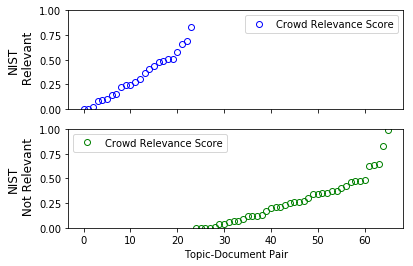

In [30]:
import matplotlib.pyplot as plt
%matplotlib inline

#dataset_hr = dataset[dataset["nist_rel_binary"] == 2].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_r = dataset[dataset["nist_rel_binary"] == 1].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_nr = dataset[dataset["nist_rel_binary"] == 0].sort_values(by=['relevance_score']).reset_index(drop=True)

#frames = [dataset_hr, dataset_r, dataset_nr]

frames = [dataset_r, dataset_nr]

result = pd.concat(frames)
result = result.reset_index(drop=True)

#dataset_hr = result[result["input.rel"] == 2]
dataset_r = result[result["nist_rel_binary"] == 1]
dataset_nr = result[result["nist_rel_binary"] == 0]

ax1 = plt.subplot(211)
plt.plot(dataset_r.index, dataset_r["relevance_score"], 'bo', markerfacecolor='None', label="Crowd Relevance Score")
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.set_ylabel('NIST\n Relevant', rotation=90, fontsize=12)
plt.ylim(0.0,1.0)
plt.legend()
# share x only
ax2 = plt.subplot(212, sharex=ax1)
plt.plot(dataset_nr.index, dataset_nr["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
ax2.set_ylabel('NIST\n Not Relevant', rotation=90, fontsize=12)
plt.setp(ax2.get_xticklabels(), visible=True)
plt.ylim(0.0,1.0)
plt.legend()

plt.xlabel("Topic-Document Pair")
#plt.savefig("crowd-vs-experts-2p-rndpar-nohigh.eps", format="eps", dpi=1000)
plt.show()

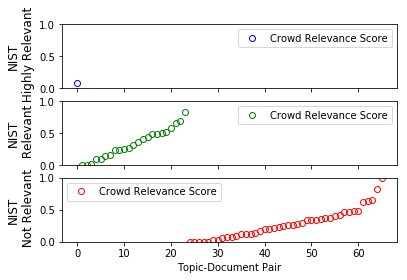

In [32]:
dataset_hr = dataset[dataset["nist_rel"] == 2].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_r = dataset[dataset["nist_rel"] == 1].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_nr = dataset[dataset["nist_rel"] == 0].sort_values(by=['relevance_score']).reset_index(drop=True)

frames = [dataset_hr, dataset_r, dataset_nr]

#frames = [dataset_r, dataset_nr]

result = pd.concat(frames)
result = result.reset_index(drop=True)

dataset_hr = result[result["nist_rel"] == 2]
dataset_r = result[result["nist_rel"] == 1]
dataset_nr = result[result["nist_rel"] == 0]

ax1 = plt.subplot(311)
plt.plot(dataset_hr.index, dataset_hr["relevance_score"], 'bo', markerfacecolor='None', label="Crowd Relevance Score")
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.set_ylabel('NIST\n Highly Relevant', rotation=90, fontsize=12)
plt.ylim(0.0,1.0)
plt.legend()
# share x only
ax2 = plt.subplot(312, sharex=ax1)
plt.plot(dataset_r.index, dataset_r["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
ax2.set_ylabel('NIST\n Relevant', rotation=90, fontsize=12)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.ylim(0.0,1.0)
plt.legend()
# share x and y
ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
plt.plot(dataset_nr.index, dataset_nr["relevance_score"], 'ro', markerfacecolor='None', label="Crowd Relevance Score")
plt.ylim(0.0,1.0)
ax3.set_ylabel('NIST\n Not Relevant', rotation=90, fontsize=12)
plt.legend()

plt.xlabel("Topic-Document Pair")
#plt.savefig("crowd-vs-experts-2p-rndpar-nohigh.eps", format="eps", dpi=1000)
plt.show()

In [19]:
subset = dataset[dataset["input.query_id"] == 350]

In [21]:
dataset = subset

In [51]:
dataset1 = pd.read_csv("Bin1-CFFiles/bin1_results_nist_only.csv")

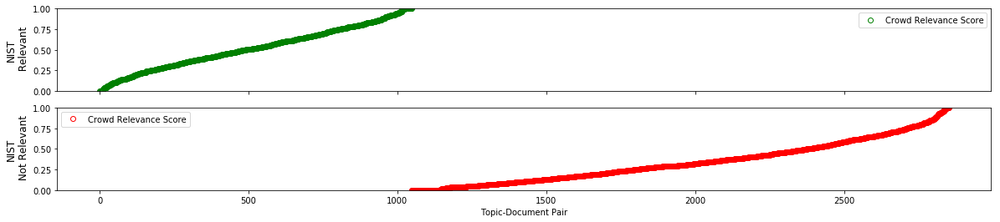

In [50]:
#dataset_hr = dataset[dataset["nist_rel_binary"] == 2].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_r = dataset[dataset["nist_rel_binary"] == 1].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_nr = dataset[dataset["nist_rel_binary"] == 0].sort_values(by=['relevance_score']).reset_index(drop=True)

#frames = [dataset_hr, dataset_r, dataset_nr]

frames = [dataset_r, dataset_nr]

result = pd.concat(frames)
result = result.reset_index(drop=True)

#dataset_hr = result[result["input.rel"] == 2]
dataset_r = result[result["nist_rel_binary"] == 1]
dataset_nr = result[result["nist_rel_binary"] == 0]
plt.rcParams['figure.figsize'] = 20, 4
ax1 = plt.subplot(211)
plt.plot(dataset_r.index, dataset_r["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.set_ylabel('NIST\n Relevant', rotation=90, fontsize=12)
plt.ylim(0.0,1.0)
plt.legend()
# share x only
ax2 = plt.subplot(212, sharex=ax1)
plt.plot(dataset_nr.index, dataset_nr["relevance_score"], 'ro', markerfacecolor='None', label="Crowd Relevance Score")
ax2.set_ylabel('NIST\n Not Relevant', rotation=90, fontsize=12)
plt.setp(ax2.get_xticklabels(), visible=True)
plt.ylim(0.0,1.0)
plt.legend()

plt.xlabel("Topic-Document Pair")
plt.savefig("crowd-vs-experts-binary.png", format="png", dpi=1000)
plt.show()

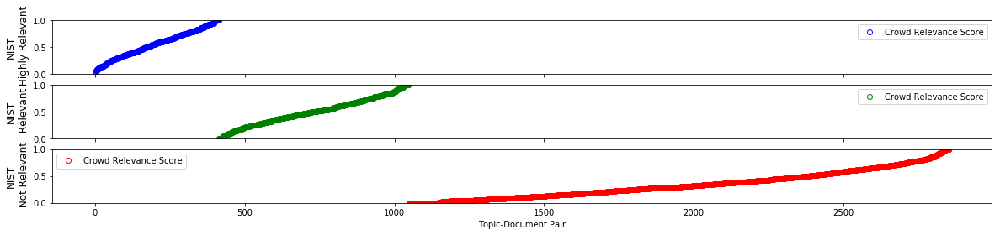

In [49]:
dataset_hr = dataset[dataset["nist_rel"] == 2].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_r = dataset[dataset["nist_rel"] == 1].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_nr = dataset[dataset["nist_rel"] == 0].sort_values(by=['relevance_score']).reset_index(drop=True)

frames = [dataset_hr, dataset_r, dataset_nr]

#frames = [dataset_r, dataset_nr]

result = pd.concat(frames)
result = result.reset_index(drop=True)

dataset_hr = result[result["nist_rel"] == 2]
dataset_r = result[result["nist_rel"] == 1]
dataset_nr = result[result["nist_rel"] == 0]

ax1 = plt.subplot(311)
plt.plot(dataset_hr.index, dataset_hr["relevance_score"], 'bo', markerfacecolor='None', label="Crowd Relevance Score")
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.set_ylabel('NIST\n Highly Relevant', rotation=90, fontsize=12)
plt.ylim(0.0,1.0)
plt.legend()
# share x only
ax2 = plt.subplot(312, sharex=ax1)
plt.plot(dataset_r.index, dataset_r["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
ax2.set_ylabel('NIST\n Relevant', rotation=90, fontsize=12)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.ylim(0.0,1.0)
plt.legend()
# share x and y
ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
plt.plot(dataset_nr.index, dataset_nr["relevance_score"], 'ro', markerfacecolor='None', label="Crowd Relevance Score")
plt.ylim(0.0,1.0)
ax3.set_ylabel('NIST\n Not Relevant', rotation=90, fontsize=12)
plt.legend()

plt.xlabel("Topic-Document Pair")
plt.savefig("crowd-vs-experts-ternary.png", format="png", dpi=1000)
plt.show()

In [52]:
#dataset = pd.read_csv("Bin1-CFFiles/bin1_results_nist_only.csv")
dataset = dataset1[dataset1["input.query_id"] == 375]

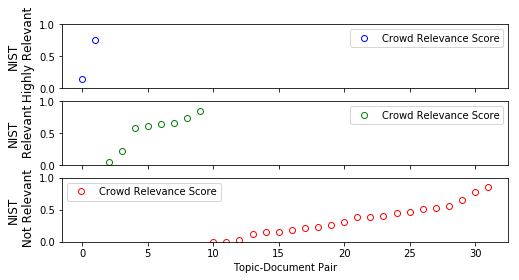

In [57]:
dataset_hr = dataset[dataset["nist_rel"] == 2].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_r = dataset[dataset["nist_rel"] == 1].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_nr = dataset[dataset["nist_rel"] == 0].sort_values(by=['relevance_score']).reset_index(drop=True)

frames = [dataset_hr, dataset_r, dataset_nr]

#frames = [dataset_r, dataset_nr]

result = pd.concat(frames)
result = result.reset_index(drop=True)

dataset_hr = result[result["nist_rel"] == 2]
dataset_r = result[result["nist_rel"] == 1]
dataset_nr = result[result["nist_rel"] == 0]

plt.rcParams['figure.figsize'] = 8, 4
ax1 = plt.subplot(311)
plt.plot(dataset_hr.index, dataset_hr["relevance_score"], 'bo', markerfacecolor='None', label="Crowd Relevance Score")
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.set_ylabel('NIST\n Highly Relevant', rotation=90, fontsize=12)
plt.ylim(0.0,1.0)
plt.legend()
# share x only
ax2 = plt.subplot(312, sharex=ax1)
plt.plot(dataset_r.index, dataset_r["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
ax2.set_ylabel('NIST\n Relevant', rotation=90, fontsize=12)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.ylim(0.0,1.0)
plt.legend()
# share x and y
ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
plt.plot(dataset_nr.index, dataset_nr["relevance_score"], 'ro', markerfacecolor='None', label="Crowd Relevance Score")
plt.ylim(0.0,1.0)
ax3.set_ylabel('NIST\n Not Relevant', rotation=90, fontsize=12)
plt.legend()

plt.xlabel("Topic-Document Pair")
#plt.savefig("crowd-vs-experts-2p-rndpar-nohigh.eps", format="eps", dpi=1000)
plt.show()

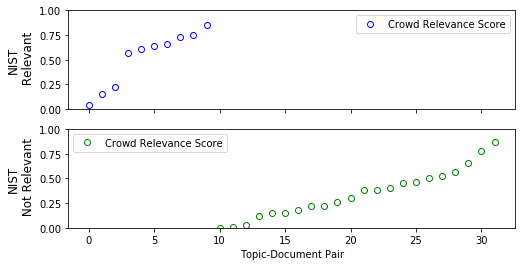

In [58]:
#dataset_hr = dataset[dataset["nist_rel_binary"] == 2].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_r = dataset[dataset["nist_rel_binary"] == 1].sort_values(by=['relevance_score']).reset_index(drop=True)
dataset_nr = dataset[dataset["nist_rel_binary"] == 0].sort_values(by=['relevance_score']).reset_index(drop=True)

#frames = [dataset_hr, dataset_r, dataset_nr]

frames = [dataset_r, dataset_nr]

result = pd.concat(frames)
result = result.reset_index(drop=True)

#dataset_hr = result[result["input.rel"] == 2]
dataset_r = result[result["nist_rel_binary"] == 1]
dataset_nr = result[result["nist_rel_binary"] == 0]

ax1 = plt.subplot(211)
plt.plot(dataset_r.index, dataset_r["relevance_score"], 'bo', markerfacecolor='None', label="Crowd Relevance Score")
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.set_ylabel('NIST\n Relevant', rotation=90, fontsize=12)
plt.ylim(0.0,1.0)
plt.legend()
# share x only
ax2 = plt.subplot(212, sharex=ax1)
plt.plot(dataset_nr.index, dataset_nr["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
ax2.set_ylabel('NIST\n Not Relevant', rotation=90, fontsize=12)
plt.setp(ax2.get_xticklabels(), visible=True)
plt.ylim(0.0,1.0)
plt.legend()

plt.xlabel("Topic-Document Pair")
#plt.savefig("crowd-vs-experts-2p-rndpar-nohigh.eps", format="eps", dpi=1000)
plt.show()

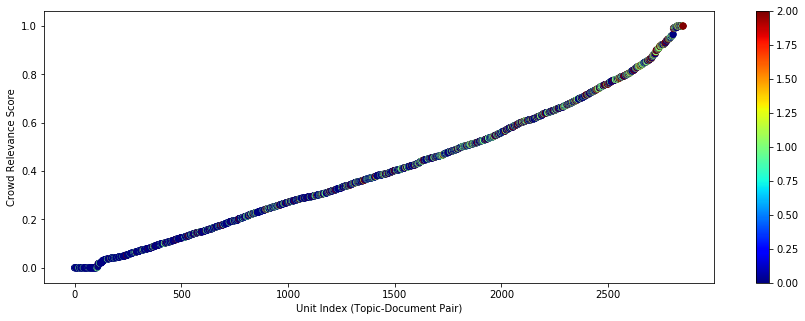

In [62]:
plt.rcParams['figure.figsize'] = 15, 5
sortedUnits = dataset1.sort_values(by=['relevance_score'])
plt.scatter(np.arange(sortedUnits.shape[0]), sortedUnits['relevance_score'], facecolors='none', c=sortedUnits['nist_rel'], cmap=plt.cm.jet)
plt.xlabel("Unit Index (Topic-Document Pair)")
plt.ylabel("Crowd Relevance Score")
plt.savefig("crowd-vs-experts_sameplot.png", format="png", dpi=1000)
plt.colorbar()

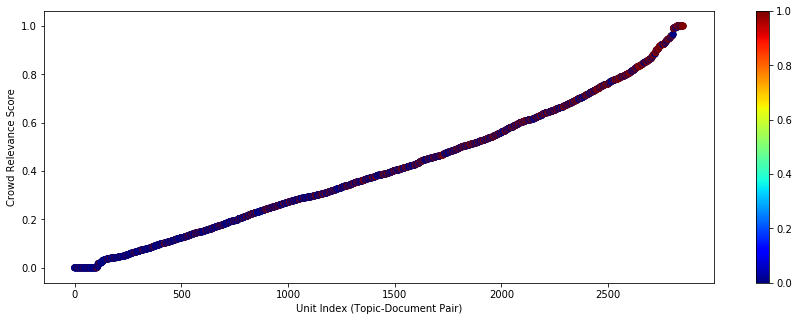

In [63]:
plt.rcParams['figure.figsize'] = 15, 5
sortedUnits = dataset1.sort_values(by=['relevance_score'])
plt.scatter(np.arange(sortedUnits.shape[0]), sortedUnits['relevance_score'], facecolors='none', c=sortedUnits['nist_rel_binary'], cmap=plt.cm.jet)
plt.xlabel("Unit Index (Topic-Document Pair)")
plt.ylabel("Crowd Relevance Score")
plt.savefig("crowd-vs-experts_sameplot_binary.png", format="png", dpi=1000)
plt.colorbar()

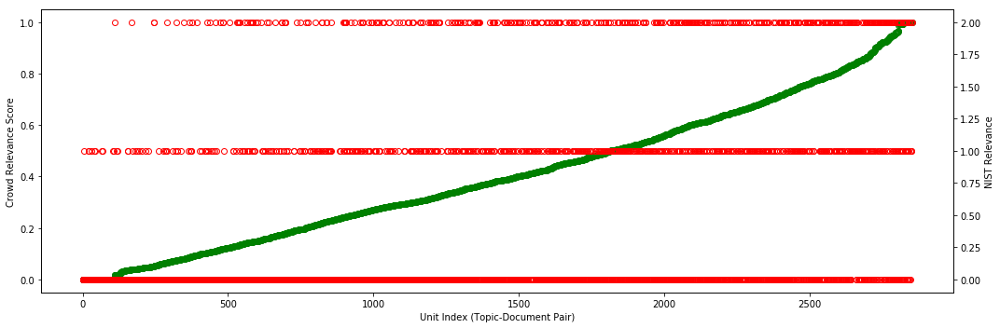

In [83]:
sortedUnits = dataset1.sort_values(by=['relevance_score'])
sortedUnits=sortedUnits.reset_index()

fig = plt.figure()
ax1 = fig.add_subplot(111)
ax2 = ax1.twinx()

ax1.plot(sortedUnits.index, sortedUnits["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")

ax1.set_xlabel("Unit Index (Topic-Document Pair)")
ax1.set_ylabel("Crowd Relevance Score")

ax2.plot(sortedUnits.index, sortedUnits["nist_rel"], 'ro', markerfacecolor='None', label="NIST Relevance Label")
ax2.set_ylabel('NIST Relevance')

fig.tight_layout()

plt.savefig("crowd-vs-experts_ternary.png", format="png", dpi=1000)
plt.show()

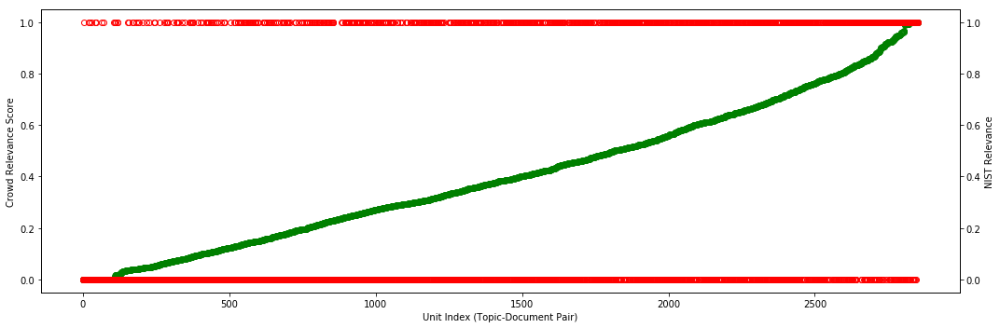

In [82]:
sortedUnits = dataset1.sort_values(by=['relevance_score'])
sortedUnits=sortedUnits.reset_index()

fig = plt.figure()
ax1 = fig.add_subplot(111)
ax2 = ax1.twinx()

ax1.plot(sortedUnits.index, sortedUnits["relevance_score"], 'go', markerfacecolor='None', label="Crowd Relevance Score")

ax1.set_xlabel("Unit Index (Topic-Document Pair)")
ax1.set_ylabel("Crowd Relevance Score")

ax2.plot(sortedUnits.index, sortedUnits["nist_rel_binary"], 'ro', markerfacecolor='None', label="NIST Relevance Label")
ax2.set_ylabel('NIST Relevance')

fig.tight_layout()

plt.savefig("crowd-vs-experts_binary.png", format="png", dpi=1000)
plt.show()

In [85]:
dataset1['nist_rel_norm'] = pd.Series(np.random.randn(len(dataset1)), index=dataset1.index)
dataset1['rel_dif'] = pd.Series(np.random.randn(len(dataset1)), index=dataset1.index)
for i in xrange(len(dataset1.index)):
    #subset = nist[(nist["Topic Id"] == dataset["input.query_id"].iloc[i]) & (nist["Document Id"] == dataset["input.document_id"].iloc[i])]
    if dataset1['nist_rel'].iloc[i] == 2:
        dataset1['nist_rel_norm'].iloc[i] = 1
    if dataset1['nist_rel'].iloc[i] == 1:
        dataset1['nist_rel_norm'].iloc[i] = 0.5
    if dataset1['nist_rel'].iloc[i] == 0:
        dataset1['nist_rel_norm'].iloc[i] = 0
        
    dataset1['rel_dif'].iloc[i] = dataset1['nist_rel_norm'].iloc[i] - dataset1['relevance_score'].iloc[i]

In [109]:
import math 

dataset1['rel_dif_mod'] = pd.Series(np.random.randn(len(dataset1)), index=dataset1.index)
dataset1['rel_dif_binary_mod'] = pd.Series(np.random.randn(len(dataset1)), index=dataset1.index)

for i in xrange(len(dataset1.index)):
    #subset = nist[(nist["Topic Id"] == dataset["input.query_id"].iloc[i]) & (nist["Document Id"] == dataset["input.document_id"].iloc[i])]
    dataset1['rel_dif_mod'].iloc[i] = math.fabs(dataset1['rel_dif'].iloc[i])
    dataset1['rel_dif_binary_mod'].iloc[i] = math.fabs(dataset1['rel_dif_binary'].iloc[i])

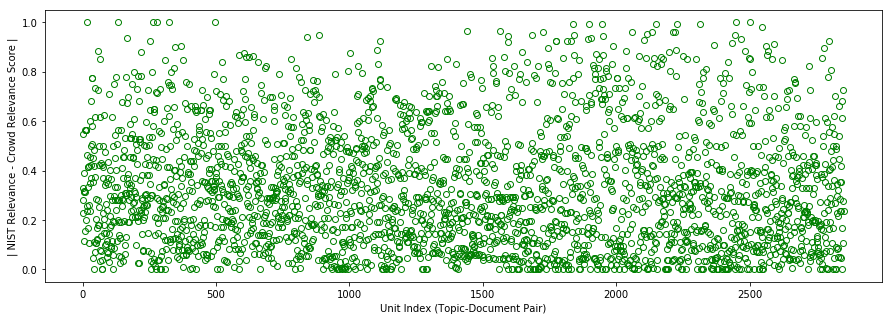

In [110]:
plt.plot(dataset1.index, dataset1["rel_dif_mod"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
plt.xlabel("Unit Index (Topic-Document Pair)")
plt.ylabel("| NIST Relevance - Crowd Relevance Score |")

plt.savefig("nist-crowd_sorted_ternary_mod.png", format="png", dpi=1000)
plt.show()

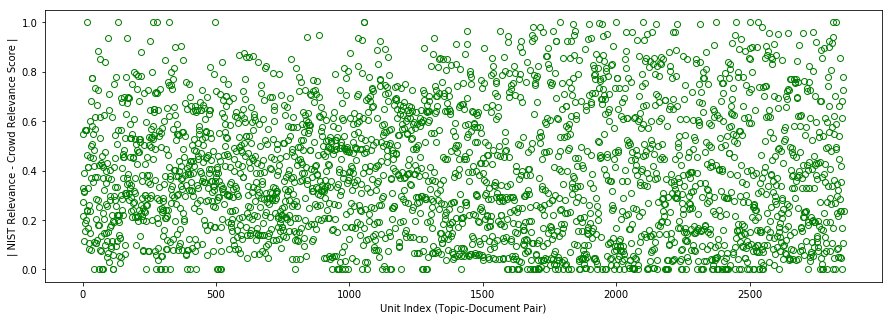

In [111]:
plt.plot(dataset1.index, dataset1["rel_dif_binary_mod"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
plt.xlabel("Unit Index (Topic-Document Pair)")
plt.ylabel("| NIST Relevance - Crowd Relevance Score |")

plt.savefig("nist-crowd_sorted_binary_mod.png", format="png", dpi=1000)
plt.show()

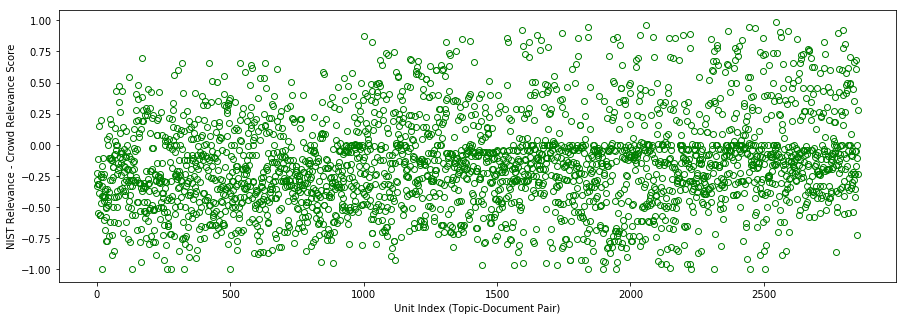

In [93]:
sortedUnits = dataset1.sort_values(by=['rel_dif'])
sortedUnits=sortedUnits.reset_index()

plt.plot(dataset1.index, dataset1["rel_dif"], 'go', markerfacecolor='None', label="Crowd Relevance Score")
plt.xlabel("Unit Index (Topic-Document Pair)")
plt.ylabel("NIST Relevance - Crowd Relevance Score")

plt.savefig("nist-crowd_sorted_ternary.png", format="png", dpi=1000)
plt.show()

In [86]:
dataset1

,duration,input.bin,input.doc_len,input.document_body,input.document_id,input.document_title,input.index,input.query_id,input.topic_description,input.topic_query,...,uqs,unit_annotation_score,uqs_initial,unit_annotation_score_initial,relevance_score,none_score,nist_rel,nist_rel_binary,nist_rel_norm,rel_dif
0,51.428571,1,118,<p>LEAD: The computers that keep track of this...,269,Tower of Pisa Leans A Little More in '86,2466,677,What efforts have been made to stabilize the L...,Leaning Tower of Pisa,...,0.359434,"Counter({'none': 0.5937571140189918, 's2': 0.3...",0.295615,"Counter({'s2': 0.42857142857142855, 'none': 0....",0.330841,0.593757,0.0,0.0,0.0,-0.330841
1,37.142857,1,148,<p>LEAD: Faculty members at the University of ...,553,PATENTS,3683,439,What new inventions or scientific discoveries ...,"inventions, scientific discoveries",...,0.534039,"Counter({'s1': 0.7828090635807071, 's3': 0.668...",0.451886,"Counter({'s1': 0.7142857142857143, 's3': 0.571...",0.782809,0.107414,1.0,1.0,0.5,-0.282809
2,31.000000,1,136,<p>LEAD: Guerrillas killed an engineer and two...,1375,3 Are Killed in Rebel Attack On Peru Hydroelec...,3214,307,Identify hydroelectric projects proposed or un...,New Hydroelectric Projects,...,0.426206,"Counter({'s3': 0.7270587857925759, 's1': 0.619...",0.417606,"Counter({'s3': 0.7142857142857143, 's2': 0.571...",0.727059,0.272941,1.0,1.0,0.5,-0.227059
3,34.428571,1,218,<p>LEAD: Five commuter buses were involved in ...,1401,10 Injured in Crash Of 5 Buses in Jersey,5603,363,What disasters have occurred in tunnels used f...,transportation tunnel disasters,...,0.330998,"Counter({'s1': 0.547036855617127, 'none': 0.45...",0.325227,"Counter({'s1': 0.5714285714285714, 'none': 0.4...",0.547037,0.452963,0.0,0.0,0.0,-0.547037
4,36.857143,1,207,<p>LEAD: Since William J. Casey's surgery for ...,2521,Search Begins for A New C.I.A. Chief,5393,310,Evidence that radio waves from radio towers or...,Radio Waves and Brain Cancer,...,0.439211,"Counter({'none': 0.6883381584603069, 's2': 0.3...",0.372157,"Counter({'none': 0.5714285714285714, 's2': 0.4...",0.311662,0.688338,0.0,0.0,0.0,-0.311662
5,83.714286,1,390,<p>LEAD: WHO in Iran supports the Ayatollah Ru...,2935,IRAN: ADRIFT IN A SEA OF BLOOD' ON 13,8821,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,0.755279,"Counter({'none': 0.8843787774192683, 's3': 0.1...",0.714286,"Counter({'none': 0.8571428571428571, 's3': 0.1...",0.115621,0.884379,0.0,0.0,0.0,-0.115621
6,35.142857,1,131,"<p>LEAD: Machine tool companies, which recentl...",3060,Ex-Im Tie to Tool Group,3004,414,How much sugar does Cuba export and which coun...,"Cuba, sugar, exports",...,0.388877,"Counter({'none': 0.6103080105119492, 's2': 0.3...",0.323224,"Counter({'s3': 0.42857142857142855, 's2': 0.42...",0.317362,0.610308,0.0,0.0,0.0,-0.317362
7,81.714286,1,197,<p>LEAD: Federal District Judge Robert R. Merh...,3551,Robins Deadline,5160,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,0.326017,"Counter({'none': 0.5243230642985985, 's1': 0.3...",0.325163,"Counter({'s2': 0.42857142857142855, 's1': 0.42...",0.389387,0.524323,0.0,0.0,0.0,-0.389387
8,83.428571,1,377,<p>LEAD: Audi of America agreed today to recal...,4050,"250,000 AUDI CARS WILL BE RECALLED",8553,397,Identify documents that discuss the reasons fo...,automobile recalls,...,0.484939,"Counter({'s3': 0.845836698788996, 's2': 0.7655...",0.347161,"Counter({'s3': 0.7142857142857143, 's2': 0.571...",0.845837,0.154163,2.0,1.0,1.0,0.154163
9,75.142857,1,439,"<p>LEAD: Zn his long-overdue visit to Africa, ...",4422,Only Another Footnote in Africa?,9772,443,What is the extent of U.S. (government and pri...,"U.S., investment, Africa",...,0.570992,"Counter({'s1': 0.8130998143698704, 's6': 0.813...",0.512706,"Counter({'s1': 0.7142857142857143, 's6': 0.714...",0.813100,0.107006,1.0,1.0,0.5,-0.313100


In [89]:
dataset1['nist_rel_binary_norm'] = pd.Series(np.random.randn(len(dataset1)), index=dataset1.index)
dataset1['rel_dif_binary'] = pd.Series(np.random.randn(len(dataset1)), index=dataset1.index)
for i in xrange(len(dataset1.index)):
    #subset = nist[(nist["Topic Id"] == dataset["input.query_id"].iloc[i]) & (nist["Document Id"] == dataset["input.document_id"].iloc[i])]
    if dataset1['nist_rel_binary'].iloc[i] == 1:
        dataset1['nist_rel_binary_norm'].iloc[i] = 1
    if dataset1['nist_rel_binary'].iloc[i] == 0:
        dataset1['nist_rel_binary_norm'].iloc[i] = 0
        
    dataset1['rel_dif_binary'].iloc[i] = dataset1['nist_rel_binary_norm'].iloc[i] - dataset1['relevance_score'].iloc[i]

In [104]:
dataset1

,duration,input.bin,input.doc_len,input.document_body,input.document_id,input.document_title,input.index,input.query_id,input.topic_description,input.topic_query,...,relevance_score,none_score,nist_rel,nist_rel_binary,nist_rel_norm,rel_dif,nist_rel_binary_norm,rel_dif_binary,rel_dif_mod,rel_dif_binary_mod
0,51.428571,1,118,<p>LEAD: The computers that keep track of this...,269,Tower of Pisa Leans A Little More in '86,2466,677,What efforts have been made to stabilize the L...,Leaning Tower of Pisa,...,0.330841,0.593757,0.0,0.0,0.0,-0.330841,0.0,-0.330841,0.330841,0.330841
1,37.142857,1,148,<p>LEAD: Faculty members at the University of ...,553,PATENTS,3683,439,What new inventions or scientific discoveries ...,"inventions, scientific discoveries",...,0.782809,0.107414,1.0,1.0,0.5,-0.282809,1.0,0.217191,0.282809,1.062258
2,31.000000,1,136,<p>LEAD: Guerrillas killed an engineer and two...,1375,3 Are Killed in Rebel Attack On Peru Hydroelec...,3214,307,Identify hydroelectric projects proposed or un...,New Hydroelectric Projects,...,0.727059,0.272941,1.0,1.0,0.5,-0.227059,1.0,0.272941,0.227059,-0.373934
3,34.428571,1,218,<p>LEAD: Five commuter buses were involved in ...,1401,10 Injured in Crash Of 5 Buses in Jersey,5603,363,What disasters have occurred in tunnels used f...,transportation tunnel disasters,...,0.547037,0.452963,0.0,0.0,0.0,-0.547037,0.0,-0.547037,0.547037,0.547037
4,36.857143,1,207,<p>LEAD: Since William J. Casey's surgery for ...,2521,Search Begins for A New C.I.A. Chief,5393,310,Evidence that radio waves from radio towers or...,Radio Waves and Brain Cancer,...,0.311662,0.688338,0.0,0.0,0.0,-0.311662,0.0,-0.311662,0.311662,0.311662
5,83.714286,1,390,<p>LEAD: WHO in Iran supports the Ayatollah Ru...,2935,IRAN: ADRIFT IN A SEA OF BLOOD' ON 13,8821,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,0.115621,0.884379,0.0,0.0,0.0,-0.115621,0.0,-0.115621,0.115621,0.115621
6,35.142857,1,131,"<p>LEAD: Machine tool companies, which recentl...",3060,Ex-Im Tie to Tool Group,3004,414,How much sugar does Cuba export and which coun...,"Cuba, sugar, exports",...,0.317362,0.610308,0.0,0.0,0.0,-0.317362,0.0,-0.317362,0.317362,0.317362
7,81.714286,1,197,<p>LEAD: Federal District Judge Robert R. Merh...,3551,Robins Deadline,5160,330,This query is looking for examples of cooperat...,Iran-Iraq Cooperation,...,0.389387,0.524323,0.0,0.0,0.0,-0.389387,0.0,-0.389387,0.389387,0.389387
8,83.428571,1,377,<p>LEAD: Audi of America agreed today to recal...,4050,"250,000 AUDI CARS WILL BE RECALLED",8553,397,Identify documents that discuss the reasons fo...,automobile recalls,...,0.845837,0.154163,2.0,1.0,1.0,0.154163,1.0,0.154163,-0.778153,0.701521
9,75.142857,1,439,"<p>LEAD: Zn his long-overdue visit to Africa, ...",4422,Only Another Footnote in Africa?,9772,443,What is the extent of U.S. (government and pri...,"U.S., investment, Africa",...,0.813100,0.107006,1.0,1.0,0.5,-0.313100,1.0,0.186900,0.313100,-0.459539


In [43]:
dataset.to_csv("bin1_results_absolut.csv")

In [1]:
def compute_F1_score_relevant(dataset):
    nyt_f1 = np.zeros(shape=(100, 2))
    for idx in range(0, 100):
        thresh = (idx + 1) / 100.0
        tp = 0
        fp = 0
        tn = 0
        fn = 0

        for gt_idx in range(0, len(dataset.index)):
            #print(gt_idx)
            #print(dataset['relevance_score'].iloc[gt_idx])
            if dataset['relevance_score'].iloc[gt_idx] >= thresh:
                if dataset["nist_rel_binary"].iloc[gt_idx] == 1:
                    tp = tp + 1.0
                else:
                    fp = fp + 1.0
            else:
                if dataset["nist_rel_binary"].iloc[gt_idx] == 1:
                    fn = fn + 1.0
                else:
                    tn = tn + 1.0

        nyt_f1[idx, 0] = thresh
        if tp != 0:
            nyt_f1[idx, 1] = 2.0 * tp / (2.0 * tp + fp + fn)
        else:
            nyt_f1[idx, 1] = 0
    return nyt_f1


def compute_F1_score_not_relevant(dataset):
    nyt_f1 = np.zeros(shape=(100, 2))
    for idx in range(0, 100):
        thresh = (idx + 1) / 100.0
        tp = 0
        fp = 0
        tn = 0
        fn = 0

        for gt_idx in range(0, len(dataset.index)):
            #print(gt_idx)
            #print(dataset['max_relevance_score'].iloc[gt_idx])
            if dataset['relevance_score'].iloc[gt_idx] < thresh:
                if dataset["nist_rel_binary"].iloc[gt_idx] == 0:
                    tp = tp + 1.0
                else:
                    fp = fp + 1.0
            else:
                if dataset["nist_rel_binary"].iloc[gt_idx] == 0:
                    fn = fn + 1.0
                else:
                    tn = tn + 1.0

        nyt_f1[idx, 0] = thresh
        if tp != 0:
            nyt_f1[idx, 1] = 2.0 * tp / (2.0 * tp + fp + fn)
        else:
            nyt_f1[idx, 1] = 0
    return nyt_f1

In [3]:
import pandas as pd

dataset = pd.read_csv("bin1_results_absolut.csv")

In [5]:
import numpy as np

notrel = compute_F1_score_not_relevant(dataset)
rel = compute_F1_score_relevant(dataset)

0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505

1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047
1.0
1048
0.796538815737
1049
0.0731507557325
1050
0.099399385346
1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412

0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.212224874694
1692
0.371597802679
1693
0.0
1694
0.25353410682
1695
0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.254575075042
1717
0.540432127434
1718
0.962486149964
1719
0.989303379693
1720
0.326277443598
1721
0.554499006809
1722
0.246106023708
1723
0.337127545343


2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.613059291183
2168
0.19118228634
2169
0.832070714504
2170
0.453933316989
2171
0.803300708593
2172
0.507973575134
2173
0.283229030887
2174
0.289501784922
2175
0.236258008508
2176
0.309034422529
2177
0.850856446127
2178
0.215740827724
2179
0.445070310934
2180
0.263809888337
2181
0.263059504176
2182
0.315582509677
2183
0.314579230696
2184
1.0
2185
0.0
2186
0.365177724488
2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.1

0.745660329427
332
0.797148842636
333
0.327571751331
334
0.664185960645
335
0.731576981616
336
0.302422724513
337
0.0789813274478
338
0.228772498198
339
0.122872870043
340
0.570301198297
341
0.291886860072
342
0.402927095836
343
0.659187675519
344
0.81666870401
345
0.373461389445
346
0.900731658969
347
0.805720085205
348
0.402927095836
349
0.37702631961
350
0.263064732111
351
0.524715151257
352
0.451240558931
353
0.69770572647
354
0.856474755428
355
0.589340265389
356
0.303390630745
357
0.0789813274478
358
0.623230395655
359
0.548831887765
360
0.603347444748
361
0.456562714052
362
0.437869399207
363
0.904249215521
364
0.2474870557
365
0.835005515622
366
0.893666687126
367
0.635122571173
368
0.582139305911
369
0.338301981704
370
0.905686834635
371
0.369000363238
372
0.672677560098
373
0.557810221061
374
0.08053014477
375
0.847908786138
376
0.770363970911
377
0.441851473526
378
0.511127347362
379
0.195832883489
380
0.79447552326
381
0.456463941934
382
0.674737255811
383
0.539737482605
38

0.511754478788
933
0.0
934
0.159564235592
935
0.0514710254261
936
0.0514710254261
937
0.16169319536
938
0.582178151612
939
0.386360035668
940
0.531544006776
941
0.0538881202946
942
0.515050101935
943
0.6388043577
944
0.265778169384
945
0.792696440509
946
0.523898098175
947
0.203353619636
948
0.511754478788
949
0.500224869228
950
0.523001716738
951
0.0538881202946
952
0.151979250322
953
0.333429253836
954
0.0
955
0.536868833935
956
0.261306195106
957
0.426792555569
958
0.0
959
0.345427876429
960
0.405207607861
961
0.604096501756
962
0.0
963
0.491927925441
964
0.301711335224
965
0.272878483577
966
0.0304327023515
967
0.495313069821
968
0.517402452737
969
0.448962790373
970
0.319461991748
971
0.0
972
0.387409718293
973
0.0690120899372
974
0.326431933894
975
0.368491351542
976
0.609429131242
977
0.396778405346
978
0.183517055649
979
0.541040259151
980
0.506720893519
981
0.0959019714891
982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
98

0.333828627501
1414
0.304166498426
1415
0.18898472115
1416
0.756154706942
1417
0.0864455299906
1418
0.0559549095489
1419
1.0
1420
0.207135910481
1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.2261

2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486

136
0.77908847405
137
0.947404760019
138
0.190713826878
139
0.0268359901412
140
0.126044947095
141
0.873660407163
142
0.30155481982
143
0.563045094052
144
0.0515465897453
145
0.308020161811
146
0.716573586441
147
0.590100714846
148
0.758621785738
149
0.67940093841
150
0.532292609402
151
0.45499787523
152
0.779337650295
153
0.630440392285
154
0.516434293479
155
0.302900670343
156
0.45499787523
157
0.903088007639
158
0.308020161811
159
0.936674241666
160
0.532328949678
161
0.777184878987
162
0.308020161811
163
0.302900670343
164
0.369634686352
165
0.937792933101
166
0.347324230057
167
0.675098010254
168
0.369634686352
169
0.308020161811
170
0.300218960071
171
0.614779630075
172
0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.45556844437

658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.14678272373
698
0.287400997731
699
0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.28740099

0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257

1724
0.0939708761297
1725
0.16715339091
1726
0.961095209945
1727
0.959834525744
1728
0.77996169187
1729
0.524367218289
1730
0.959834525744
1731
0.260758237976
1732
0.321177300633
1733
0.40385495224
1734
0.0478888844097
1735
0.137215089927
1736
0.475007563656
1737
0.588442952743
1738
0.0
1739
0.612091826828
1740
0.0416703137739
1741
0.108168419053
1742
0.134559831011
1743
0.692502930979
1744
0.103810320987
1745
0.830949112133
1746
0.145863840924
1747
0.478115188463
1748
0.814458573135
1749
0.270570896076
1750
0.604334685214
1751
0.174026203532
1752
0.0190195176106
1753
0.758077904992
1754
0.254204072974
1755
0.173689324798
1756
0.0464185374941
1757
0.159923663019
1758
0.279875726
1759
0.123647653447
1760
0.753390456617
1761
0.280764112913
1762
0.0363399235302
1763
0.778813988713
1764
0.956735508985
1765
0.0214576891004
1766
0.140674661158
1767
0.0609271670936
1768
0.412639362016
1769
0.0
1770
0.795020997404
1771
0.697826985723
1772
0.0752767097701
1773
0.923852540189
1774
0.019213337907

0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.

0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.090508

0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551

1558
0.621669551506
1559
0.277032777954
1560
0.501494358057
1561
0.0428547320393
1562
0.293114568845
1563
0.460732978484
1564
0.964394350631
1565
0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609

0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0.290835589544
2414
0.0673153190145
2415
0.0
2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.

20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143

527
0.770561215909
528
0.687350161365
529
0.383746291407
530
0.263215762541
531
0.538441814555
532
0.556833723918
533
0.587089809792
534
0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.415669019119
553
0.345473207648
554
0.415183234122
555
0.189156022955
556
0.352697698567
557
0.1709797629
558
0.188646985282
559
0.236349699893
560
0.84520821909
561
0.204718948455
562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0

0.601152477883
1074
0.803394510939
1075
0.225760440649
1076
0.314993869617
1077
0.418903379101
1078
0.682263801558
1079
0.700524822811
1080
0.516711413127
1081
0.529576109713
1082
0.253696871456
1083
0.26578771323
1084
0.634405060509
1085
0.65718958604
1086
0.728667138073
1087
0.501973786695
1088
0.661878812506
1089
0.863576245928
1090
0.279231090014
1091
0.907611870314
1092
0.750272675046
1093
0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364963
1103
0.192440719379
1104
0.612199535402
1105
0.349766962702
1106
0.0793221023968
1107
0.641877811777
1108
0.83055583621
1109
0.422550338915
1110
0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
112

1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144

0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.57255362023

2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761


732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
78

0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.71

0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.99274684539
2048
0.483757721642
2049
0.834852668732
2050
0.505683113372
2051
0.837468360743
2

2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.56356223154

645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.1467827

1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.608058292596
1395
0.593884543794
1396
0.510422780292
1397
0.540622303834
1398
0.0885052399096
1399
0.49469121493
1400
0.16858248313
1401
0.207135910481
1402
0.526697903402
1403
0.0857790035453
1404
0.258003201694
1405
0.0559549095489
1406
0.497958111003
1407
0.383718384314
1408
0.173461628765
1409
0.447453068972
1410
0.40597198105
1411
0.342172690939
1412
0.0639370430927
1413
0.333828627501
1414
0.304166498426
1415
0.18898472115
1416
0.756154706942


0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922

0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.465

0.847957715198
308
0.206901494985
309
0.620722490423
310
1.0
311
0.915326459214
312
0.238855705807
313
0.488864511789
314
0.790610813191
315
0.785377454591
316
0.87884163925
317
0.915326459214
318
0.345157745846
319
0.757678578698
320
0.536427670101
321
0.75845601655
322
0.584110221062
323
0.620242827861
324
0.74580628863
325
1.0
326
0.890415782551
327
0.623206739626
328
0.366459562015
329
1.0
330
0.73289394553
331
0.745660329427
332
0.797148842636
333
0.327571751331
334
0.664185960645
335
0.731576981616
336
0.302422724513
337
0.0789813274478
338
0.228772498198
339
0.122872870043
340
0.570301198297
341
0.291886860072
342
0.402927095836
343
0.659187675519
344
0.81666870401
345
0.373461389445
346
0.900731658969
347
0.805720085205
348
0.402927095836
349
0.37702631961
350
0.263064732111
351
0.524715151257
352
0.451240558931
353
0.69770572647
354
0.856474755428
355
0.589340265389
356
0.303390630745
357
0.0789813274478
358
0.623230395655
359
0.548831887765
360
0.603347444748
361
0.4565627140

0.227122974695
987
0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.7398

0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.254575075042
1717
0.540432127434
1718
0.962486149964
1719
0.989303379693
1720
0.326277443598
1721
0.554499006809
1722
0.246106023708
1723
0.337127545343
1724
0.0939708761297
1725
0.16715339091
1726
0.961095209945
1727
0.959834525744
1728
0.77996169187
1729
0.524367218289
1730
0.959834525744
1731
0.260758237976
1732
0.321177300633
1733
0.40385495224
1734
0.0478888844097
1735
0.137215089927
1736
0.475007563656
1737
0.588442952743
1738
0.0
1739
0.612091826828
1740
0.0416703137739
1741
0.108168419053
1742
0.134559831011
1743
0.692502930979
1744
0.103810320987
1745
0.830949112133
1746
0.145863840924
1747
0.478115188463
1748
0.814458573135
1749
0.2705708960

2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.73573554329

659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.14678272373
698
0.287400997731
699
0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.287400997731
711
0.69879895

0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285
1491
0.431043701111
1492
0.765321986049
1493
0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717


2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.613059291183
2168
0.19118228634
2169
0.832070714504
2170
0.453933316989
2171
0.803300708593
2172
0.507973575134
2173
0.283229030887
2174
0.289501784922
2175
0.236258008508
2176
0.309034422529
2177
0.850856446127
2178
0.215740827724
2179
0.445070310934
2180
0.263809888337
2181
0.263059504176
2182
0.315582509677
2183
0.314579230696
2184
1.0
2185
0.0
2186
0.365177724488
2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.103289742361
2198
0.0995089980349
2199
0.650995467234
2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.0361687592345
2209
0.225134132947
2210
0.309034422529
2211
0.6511234001

0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
131
1.0
132
0.199080107561
133
0.565654136884
134
0.77908847405
135
0.140298016702
136
0.77908847405
137
0.947404760019
138
0.190713826878
139
0.0268359901412
140
0.126044947095
141
0.873660407163
142
0.30155481982
143
0.563045094052
144
0.0515465897453
145
0.308020161811
146
0.716573586441
147
0.590100714846
148
0.758621785738
149
0.67940093841
150
0.532292609402
151
0.45499787523
152
0.779337650295
153
0.630440392285
154
0.516434293479
155
0.302900670343
156
0.45499787523
157
0.903088007639
158
0.308020161811
159
0.936674241666
160
0.532328949678
161
0.777184878987
162
0.308020161811
163
0.302900670343
164
0.369634686352
165
0.937792933101
166
0.3473242300

0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.

1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.212224874694
1692
0.371597802679
1693
0.0
1694
0.25353410682
1695
0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701

0.47619721645
2335
0.120196372427
2336
0.0355125316796
2337
0.513924375193
2338
0.811216347595
2339
0.270018423613
2340
0.324651657527
2341
0.426469648497
2342
0.916423263054
2343
0.250185773418
2344
0.322225280749
2345
0.149561359622
2346
0.591722664589
2347
0.277632487896
2348
0.505456796938
2349
0.302044534339
2350
0.0980832169923
2351
0.836395668669
2352
0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014

0.126044947095
141
0.873660407163
142
0.30155481982
143
0.563045094052
144
0.0515465897453
145
0.308020161811
146
0.716573586441
147
0.590100714846
148
0.758621785738
149
0.67940093841
150
0.532292609402
151
0.45499787523
152
0.779337650295
153
0.630440392285
154
0.516434293479
155
0.302900670343
156
0.45499787523
157
0.903088007639
158
0.308020161811
159
0.936674241666
160
0.532328949678
161
0.777184878987
162
0.308020161811
163
0.302900670343
164
0.369634686352
165
0.937792933101
166
0.347324230057
167
0.675098010254
168
0.369634686352
169
0.308020161811
170
0.300218960071
171
0.614779630075
172
0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.455568444377
189
0.73213450917
190
0.549217013059
191
0.316603570963
192
0.274519782413
193

0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.

1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.608058292596
1395
0.593884543794
139

1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047


2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2

0.614779630075
172
0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.455568444377
189
0.73213450917
190
0.549217013059
191
0.316603570963
192
0.274519782413
193
0.609286076306
194
0.798227419228
195
0.526467812169
196
0.371403250157
197
0.309056713882
198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0

699
0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.287400997731
711
0.6987989516
712
0.117977939912
713
0.204861820712
714
0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942


1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285

1964
0.544859283622
1965
0.0474724781317
1966
0.46712785211
1967
0.0532041488593
1968
0.362895796479
1969
0.101144035139
1970
0.784282394501
1971
0.639955563543
1972
0.710682508658
1973
0.600788904506
1974
0.649713552916
1975
0.043782351561
1976
0.10687010983
1977
0.356892957172
1978
0.110140579644
1979
0.0197299663362
1980
0.642813423144
1981
0.173986984285
1982
0.0443626210945
1983
0.741167108235
1984
0.317943379466
1985
0.830187627418
1986
0.759116262807
1987
0.749319916309
1988
0.903332662878
1989
0.12552704936
1990
0.0
1991
0.448721928161
1992
0.570782188288
1993
0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.0

0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973

0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.04200522697

0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717
1511
0.355262578226
1512
0.689631116123
1513
0.65575336113
1514
0.170087774489
1515
0.4629104369
1516
0.221764309488
1517
0.216134505577
1518
0.286439820325
1519
0.463453193192
1520
0.501783685424
1521
0.0485071179585
1522
0.113574338781
1523
0.0427765979655
1524
0.670317890225
1525
0.175458483244
1526
0.195031349174
1527
0.175458483244
1528
0.0842868548227
1529
0.218209137516
1530
0.213062970244
1531
0.636234364884
1532
0.286439820325
1533
0.664479668406
1534
0.425023145124
1535
0.137017426571
1536
0.145947563171
1537
0.0453293619454
1538
0.793961526106
1539
0.518214206082
1540
0.175458483244
1541
0.105432315896
1542
0.909212805144
15

2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925
2612
0.0
2613
0.129922023937
2614
0.188194219937
2615
0.0729582747619
2616
0.11174067886
2617
0.229711146089
2618
0.663447652142
2619
0.52218251038
2620
0.206207129858
2621
0.280567631446
2622
0.289932163181
2623
0.153701376539
2624
0.0423593458292
2625
0.431183201001
2626
0.0950774267515
2627
0.243512529475
2628
0.482055618244
2629
0.099024183489
2630
0.56551307297
2631
0.165171104802
2632
0.425078214992
2633
0.0645715278146
2634
0.526253965387
2635
0.2

236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
283
0.187434078874
284
0.353907632703
285
0.666120438611
286
0.461456808056
287
0.718444151415
288
0.440228756127
289
0.0
290
0.728444802488
291
0.244263

0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.287400997731
711
0.6987989516
712
0.117977939912
713
0.204861820712
714
0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0

1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.

2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.613059291183
2168
0.19118228634
2169
0.832070714504
2170
0.453933316989
2171
0.803300708593
2172
0.507973575134
2173
0.283229030887
2174
0.289501784922
2175
0.236258008508
2176
0.309034422529
2177
0.850856446127
2178
0.215740827724
2179
0.445070310934
2180
0.263809888337
2181
0.263059504176
2182
0.315582509677
2183
0.3145792

0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0

456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749
491
0.792908187623
492
0.677193657064
493
0.660963950481
494
0.82710177244
495
0.251136545286
496
0.64057018055
497
0.82710177244
498
1.0
499
0.389756589863
500
0.627594068932
501
0.722193508038
502
0.592289429896
503
1.0
504
0.413614771424
505
0.718141434805
506
1.0
507
0.458930490721
508
0.294123616792
509
0.611255086415
510
0.5517885

0.601608616482
1214
0.612437312569
1215
0.445815519496
1216
0.612437312569
1217
0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0

0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249313508
1875
0.410902116925
1876
0.281297628525
1877
0.0798399466058
1878
0.100243309092
1879
0.0632167460353
1880
0.0222189602409
1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165

0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512
1.0
2513
0.0765185478568
2514
0.250873620928
2515
0.0
2516
0.2640

0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
131
1.0
132
0.199080107561
133
0.565654136884
134
0.77908847405
135
0.140298016702
136
0.77908847405
137
0.947404760019
138
0.190713826878
139
0.0268359901412
140
0.126044947095
14

537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.415669019119
553
0.345473207648
554
0.415183234122
555
0.189156022955
556
0.352697698567
557
0.1709797629
558
0.188646985282
559
0.236349699893
560
0.84520821909
561
0.204718948455
562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.

1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.608058292596
1395
0.593884543794
1396
0.510422780292
1397
0.540622303834
139

2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.2689

2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0

568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948

0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
163

0.130926245036
2566
0.100643219884
2567
0.835869277544
2568
0.884209832077
2569
0.379130388449
2570
0.663309121657
2571
0.130903056896
2572
0.043615720099
2573
0.35506008564
2574
0.0307859905712
2575
0.443062230179
2576
0.615284204847
2577
0.194685507816
2578
0.150126416425
2579
0.382264243466
2580
0.138589256904
2581
0.387056103119
2582
0.250873620928
2583
0.8506724553
2584
0.443062230179
2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925
2612
0.0
2613
0.129922023937
2614
0.188194219937
2615
0.072958274

0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749
491
0.792908187623
492
0.677193657064
493
0.660963950481
494
0.82710177244
495
0.251136545286
496
0.64057018055
497
0.82710177244
498
1.0
499
0.389756589863
500
0.627594068932
501
0.722193508038
502
0.592289429896
503
1.0
504
0.413614771424
505
0.718141434805
506
1.0
507
0.458930490721
508
0.294123616792
509
0.611255086415
510
0.551788528726
511
0.294123616792
512
0.359751409962
513
0.882130125531
514
0.438376273124
515
1.0
516
0.709730516839
517
0.658716367273
518
1.0
519
0.927100167649
520
0.1709797629
521
0.204718948455
522
0.326823290231
523
0.368627899038
524
0.84134641924
525
0.312579010679
526
0.670509279813
527
0.770561215909
528
0.687350161365
529
0.383746291407
530
0.263215762541
531
0.538441814555
532
0.556833723918
533
0.587089809792
534
0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0

0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047
1.0
1048
0.796538815737
1049
0.0731507557325
1050
0.099399385346
1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.0304327023515
1061
0.120542280359
1062
0.523639921008
1063
0.314972334097
1064
0.489642445624
1065
0.0
1066
0.0304327023515
1067
0.328275808053
1068
0.695767693856
1069
0.3

1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.

0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0

587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948087
621
0.256445454193
622
0.433370494278
623
0.214230313474
624
0.859111637668
625
0.460646754168
626
0.411933233807
627
0.859329696667
628
0.749061664245
629
0.851692107094
630
0.842016763366
631
0.511527949609
632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.5654964255

0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285
1491
0.431043701111
1492
0.765321986049
1493
0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717
1511
0.355262578226
1512
0.689631116123
1513
0.65575336113
1514
0.170087774489
1515
0.4629104369
1516
0.221764309488
1517
0.216134505577
1518
0.286439820325
1519
0.463453193192
1520
0.501783685424
152

2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.61305929

2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0

735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548

0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761

0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2

0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.735735543297
2806
0.518776034546
2807
0.422026928154
2808
0.108217843202
2809
0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
2817
0.549705252975
2818
0.361033583864
2819
0.0
2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845

602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948087
621
0.256445454193
622
0.433370494278
623
0.214230313474
624
0.859111637668
625
0.460646754168
626
0.411933233807
627
0.859329696667
628
0.749061664245
629
0.851692107094
630
0.842016763366
631
0.511527949609
632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.8316338

1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.528223070533
1174
0.534037871949
1175
0.307215291203
1176
0.316127429844
1177
0.350549265277
1178
0.258225706507
1179
0.386261582874
1180
0.503126518663
1181
0.386261582874
1182
0.382933621656
1183
0.456764246624
1184
0.111822572565
1185
0.0897657272132
1186
0.457322668

1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.9624861

0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378


0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.735735543297
2806
0.518776034546
2807
0.422026928154
2808
0.108217843202
2809
0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
281

0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.14678272373
698
0.287400997731
699
0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.287400997731
711
0.6987989516
712
0.117977939912
713
0.204861820712
714
0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739

1213
0.601608616482
1214
0.612437312569
1215
0.445815519496
1216
0.612437312569
1217
0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1

1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.212224874694
1692
0.371597802679
1693
0.0
1694
0.25353410682
1695
0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.254575075042
1717
0.540432127434
1718
0.962486149964
1719
0.989303379693
1720
0.326277443598
1721
0.554499006809
1722
0.246106023708
1723
0.337127545343
1724
0.0939708761297
1725
0.16715339091
1726
0.961095209945
1727
0.959834525744
1728
0.77996169187
1729
0.524367218289
1730
0.959834525744
1731
0.260758237976
1732
0.321177300633
1733
0.40385495224
1734
0.0478888844097
1735
0.137215089927
1736
0.475007563656
1737
0.588442952743
1738
0.0
1739
0.61209182

0.591722664589
2347
0.277632487896
2348
0.505456796938
2349
0.302044534339
2350
0.0980832169923
2351
0.836395668669
2352
0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4

83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
131
1.0
132
0.199080107561
133
0.565654136884
134
0.77908847405
135
0.140298016702
136
0.77908847405
137
0.947404760019
138


750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586

1329
0.311235693736
1330
0.663104657591
1331
0.0725725593348
1332
0.280213730628
1333
0.820232869036
1334
0.148376701042
1335
0.715442290975
1336
0.754735057072
1337
0.434622035612
1338
0.148376701042
1339
0.344417670062
1340
0.677998027484
1341
0.143590701548
1342
0.148376701042
1343
0.0626628527145
1344
0.12335502598
1345
0.270741963521
1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
137

1981
0.173986984285
1982
0.0443626210945
1983
0.741167108235
1984
0.317943379466
1985
0.830187627418
1986
0.759116262807
1987
0.749319916309
1988
0.903332662878
1989
0.12552704936
1990
0.0
1991
0.448721928161
1992
0.570782188288
1993
0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153

0.884209832077
2569
0.379130388449
2570
0.663309121657
2571
0.130903056896
2572
0.043615720099
2573
0.35506008564
2574
0.0307859905712
2575
0.443062230179
2576
0.615284204847
2577
0.194685507816
2578
0.150126416425
2579
0.382264243466
2580
0.138589256904
2581
0.387056103119
2582
0.250873620928
2583
0.8506724553
2584
0.443062230179
2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925
2612
0.0
2613
0.129922023937
2614
0.188194219937
2615
0.0729582747619
2616
0.11174067886
2617
0.229711146089
2618
0.663447652

378
0.511127347362
379
0.195832883489
380
0.79447552326
381
0.456463941934
382
0.674737255811
383
0.539737482605
384
0.616017420766
385
0.295398428069
386
0.658859201477
387
0.75845601655
388
0.0590412715195
389
0.939156920403
390
0.0806382292591
391
0.650565429935
392
1.0
393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688

0.426792555569
958
0.0
959
0.345427876429
960
0.405207607861
961
0.604096501756
962
0.0
963
0.491927925441
964
0.301711335224
965
0.272878483577
966
0.0304327023515
967
0.495313069821
968
0.517402452737
969
0.448962790373
970
0.319461991748
971
0.0
972
0.387409718293
973
0.0690120899372
974
0.326431933894
975
0.368491351542
976
0.609429131242
977
0.396778405346
978
0.183517055649
979
0.541040259151
980
0.506720893519
981
0.0959019714891
982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713

1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273

2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.775423895977
2424
0.528790004464
2425
0.189320165289
2426
0.167123867758
2427
0.386898014753
2428
0.0169368410218
2429
0.418767102522
2430
0.313957587873
2431
0.366985916591
2432
0.662758341399
2433
0.630647471446
2434
0.312131130762
2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.070222342659
2439
0.451801857685
2440
0.278634710009
2441
0.375362203657
2442
0.546833713079
2443
0.481345895085
2444
0.0517248705114
2445
0.0
2446
0.214889857772
2447
0.0915720552793
2448
0.454613330819
2449
1.0
2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717

0.316603570963
192
0.274519782413
193
0.609286076306
194
0.798227419228
195
0.526467812169
196
0.371403250157
197
0.309056713882
198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.9234945

1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.

0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.99274684539
2048
0.483757721642
2049
0.834852668732
2050
0.505683113372
2051
0.837468360743
2052
0.0401007250268
2053
0.0401007250268
2054
0.759116262807
2055
0.310751182442
2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991


0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
2817
0.549705252975
2818
0.361033583864
2819
0.0
2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.5643368

0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047
1.0
1048
0.796538815737
1049
0.0731507557325
1050
0.099399385346
1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.0304327023515
1061
0.120542280359
1062
0.523639921008
1063
0.314972334097
1064
0.489642445624
1065
0.0
1066
0.0304327023515
1067
0.328275808053
1068
0.695767693856
1069
0.361836538591
1070
0.603960630291
1071
0.124733831717
1072
0.220564037241
1073
0.601152477883
1074
0.803394510939
1075
0.225760440649
1076
0.314993869617
1077
0.418903379101
1078
0.682263801558
1079
0.700524822811
1080
0.516711413127
1081
0.529576109713
1082
0.253696871456
1083
0.26578771323
1084
0.634405060509
1085
0.65718958604
1086
0.728667138073
1087
0.501973786695
1088
0.661878812506
1089
0.863576245928
1090
0.279231090014
1091
0.907611870314
1092
0.750272675046
1093
0.816444004892
1094
0.07

1800
0.345089599313
1801
0.165714549392
1802
0.142779914182
1803
0.288227565238
1804
0.534927733271
1805
0.0376968605308
1806
0.184450227956
1807
0.228018319469
1808
0.280570957217
1809
0.0172347644857
1810
0.580863107841
1811
0.339868907135
1812
0.338319580011
1813
0.0232987687335
1814
0.923852540189
1815
0.539331621901
1816
0.227818075577
1817
0.39892104498
1818
0.0
1819
0.0
1820
0.573964920396
1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.7

2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248

165
0.937792933101
166
0.347324230057
167
0.675098010254
168
0.369634686352
169
0.308020161811
170
0.300218960071
171
0.614779630075
172
0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.455568444377
189
0.73213450917
190
0.549217013059
191
0.316603570963
192
0.274519782413
193
0.609286076306
194
0.798227419228
195
0.526467812169
196
0.371403250157
197
0.309056713882
198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365


632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.8166492

0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0

0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249


2562
0.615284204847
2563
0.306708521847
2564
0.227144155272
2565
0.130926245036
2566
0.100643219884
2567
0.835869277544
2568
0.884209832077
2569
0.379130388449
2570
0.663309121657
2571
0.130903056896
2572
0.043615720099
2573
0.35506008564
2574
0.0307859905712
2575
0.443062230179
2576
0.615284204847
2577
0.194685507816
2578
0.150126416425
2579
0.382264243466
2580
0.138589256904
2581
0.387056103119
2582
0.250873620928
2583
0.8506724553
2584
0.443062230179
2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925


0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
283
0.187434078874
284
0.353907632703
285
0.666120438611
286
0.461456808056
287
0.718444151415
288
0.440228756127
289
0.0
290
0.728444802488
291
0.244263236041
292
0.497526010961
293
0.552561944463
294
0.0550362941777
295
1.0
296
0.751982173906
297
0.427369745342
298
0.230761743072
299
0.947095240147
300
0.275291909008
301
0.863520153349
302
0.70884392954
303
0.75845601655
304
0.399953510305
305
0.34699274609
306
0.839804126653
307
0.847957715198
308
0.206901494985
309
0.620722490423
310
1.0
311
0.915326459214
312
0.238855705807
313
0.488864511789
314
0.790610813191
315
0.785377454591
316
0.87884163925
317
0.915326459214
318
0.345157745846
319
0.757678578698
320
0.536427670101
321
0.75845601655
322
0.584110221062
323
0.62024282786

0.111822572565
1185
0.0897657272132
1186
0.45732266831
1187
0.0950385745373
1188
0.627185083053
1189
0.666116404599
1190
0.192276638887
1191
0.370916316944
1192
0.266195072028
1193
1.0
1194
0.297526216495
1195
0.355227433716
1196
0.431475606544
1197
0.393934773408
1198
0.411179081093
1199
0.37372373186
1200
0.283730096089
1201
0.803087012195
1202
0.662166453711
1203
0.320917804496
1204
0.429407532499
1205
0.323033204138
1206
0.370916316944
1207
0.274774283156
1208
0.249106982075
1209
0.627185083053
1210
0.149345720442
1211
0.131076677279
1212
0.159218728736
1213
0.601608616482
1214
0.612437312569
1215
0.445815519496
1216
0.612437312569
1217
0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.2738324227

2186
0.365177724488
2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.103289742361
2198
0.0995089980349
2199
0.650995467234
2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.0361687592345
2209
0.225134132947
2210
0.309034422529
2211
0.651123400113
2212
0.958985386083
2213
0.309034422529
2214
0.0372302476411
2215
0.0411813303085
2216
0.659968359212
2217
0.642172974326
2218
0.112655393545
2219
0.447335466851
2220
0.293404664055
2221
0.675663065241
2222
0.958985386083
2223
0.218716222808
2224
0.111747460743
2225
0.28750422208
2226
0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814

0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.6173205

0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.415669019119
553
0.345473207648
554
0.415183234122
555
0.189156022955
556
0.352697698567
557
0.1709797629
558
0.188646985282
559
0.236349699893
560
0.84520821909
561
0.204718948455
562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.464

1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257
1289
0.806285472553
1290
0.0
1291
0.362756713385
1292
0.332944611677
1293

0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0

13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.56

0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948087
621
0.256445454193
622
0.433370494278
623
0.214230313474
624
0.859111637668
625
0.460646754168
626
0.411933233807
627
0.859329696667
628
0.749061664245
629
0.851692107094
630
0.842016763366
631
0.511527949609
632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.88060061204

0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
148

2518
0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2546
0.0
2547
0.0167912389969
2548
0.630433196675
2549
0.0172680587406
2550
0.260159037459
2551
0.0
2552
0.0705402500163
2553
0.702571779301
2554
0.605117122796
2555
0.100643219884
2556
0.41272824941
2557
0.255702538533
2558
0.143390759701
2559
0.519363079675
2560
0.258975905658
2561
0.0943627678806
2562
0.615284204847
2563
0.306708521847
2564
0.227144155272
2565
0.130926245036
2566
0.100643219884
2567
0.835869277544
2568
0.884209832077
2569
0.379130388449
2570
0.

438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749


0.712516371339
908
0.335181009242
909
0.6388043577
910
0.54204433831
911
0.0477023283225
912
0.481129782836
913
0.605399426041
914
0.39836979414
915
0.338289261081
916
0.241802943774
917
0.478377220355
918
0.207407594483
919
0.496337825133
920
0.524221084897
921
0.573261128211
922
0.269891969745
923
0.424211631634
924
0.791310434843
925
0.0538881202946
926
0.464667228366
927
0.489575805158
928
0.335181009242
929
0.0421428526232
930
0.641160309354
931
0.519525634289
932
0.511754478788
933
0.0
934
0.159564235592
935
0.0514710254261
936
0.0514710254261
937
0.16169319536
938
0.582178151612
939
0.386360035668
940
0.531544006776
941
0.0538881202946
942
0.515050101935
943
0.6388043577
944
0.265778169384
945
0.792696440509
946
0.523898098175
947
0.203353619636
948
0.511754478788
949
0.500224869228
950
0.523001716738
951
0.0538881202946
952
0.151979250322
953
0.333429253836
954
0.0
955
0.536868833935
956
0.261306195106
957
0.426792555569
958
0.0
959
0.345427876429
960
0.405207607861
961
0.60409

0.174026203532
1752
0.0190195176106
1753
0.758077904992
1754
0.254204072974
1755
0.173689324798
1756
0.0464185374941
1757
0.159923663019
1758
0.279875726
1759
0.123647653447
1760
0.753390456617
1761
0.280764112913
1762
0.0363399235302
1763
0.778813988713
1764
0.956735508985
1765
0.0214576891004
1766
0.140674661158
1767
0.0609271670936
1768
0.412639362016
1769
0.0
1770
0.795020997404
1771
0.697826985723
1772
0.0752767097701
1773
0.923852540189
1774
0.0192133379075
1775
0.923852540189
1776
0.306113473373
1777
0.154964334641
1778
0.612091826828
1779
0.0382460354643
1780
0.94830032019
1781
0.39117395087
1782
0.0
1783
0.539331621901
1784
0.405253214243
1785
0.287513075384
1786
0.135008161261
1787
0.0382460354643
1788
0.534927733271
1789
0.479223024614
1790
0.241345069721
1791
0.0
1792
0.245180265556
1793
0.399985664252
1794
0.184450227956
1795
0.028836380318
1796
0.146216101506
1797
0.350358785648
1798
0.753390456617
1799
0.0
1800
0.345089599313
1801
0.165714549392
1802
0.142779914182
1803


2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.775423895977
2424
0.528790004464
2425
0.189320165289
2426
0.167123867758
2427
0.386898014753
2428
0.0169368410218
2429
0.418767102522
2430
0.313957587873
2431
0.366985916591
2432
0.662758341399
2433
0.630647471446
2434
0.312131130762
2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.070222342659
2439
0.451801857685
2440
0.278634710009
2441
0.375362203657
2442
0.546833713079
2443
0.481345895085
2444
0.0517248705114
2445
0.0
2446
0.214889857772
2447
0.0915720552793
2448
0.454613330819
2449
1.0
2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141

334
0.664185960645
335
0.731576981616
336
0.302422724513
337
0.0789813274478
338
0.228772498198
339
0.122872870043
340
0.570301198297
341
0.291886860072
342
0.402927095836
343
0.659187675519
344
0.81666870401
345
0.373461389445
346
0.900731658969
347
0.805720085205
348
0.402927095836
349
0.37702631961
350
0.263064732111
351
0.524715151257
352
0.451240558931
353
0.69770572647
354
0.856474755428
355
0.589340265389
356
0.303390630745
357
0.0789813274478
358
0.623230395655
359
0.548831887765
360
0.603347444748
361
0.456562714052
362
0.437869399207
363
0.904249215521
364
0.2474870557
365
0.835005515622
366
0.893666687126
367
0.635122571173
368
0.582139305911
369
0.338301981704
370
0.905686834635
371
0.369000363238
372
0.672677560098
373
0.557810221061
374
0.08053014477
375
0.847908786138
376
0.770363970911
377
0.441851473526
378
0.511127347362
379
0.195832883489
380
0.79447552326
381
0.456463941934
382
0.674737255811
383
0.539737482605
384
0.616017420766
385
0.295398428069
386
0.65885920147

893
0.560509969333
894
0.800311871957
895
0.340656349205
896
0.319304709643
897
0.574624014233
898
0.459990749075
899
0.340398546965
900
0.627138232143
901
0.501986566685
902
0.534111424927
903
0.207407594483
904
0.3158279482
905
0.67362319885
906
0.0477023283225
907
0.712516371339
908
0.335181009242
909
0.6388043577
910
0.54204433831
911
0.0477023283225
912
0.481129782836
913
0.605399426041
914
0.39836979414
915
0.338289261081
916
0.241802943774
917
0.478377220355
918
0.207407594483
919
0.496337825133
920
0.524221084897
921
0.573261128211
922
0.269891969745
923
0.424211631634
924
0.791310434843
925
0.0538881202946
926
0.464667228366
927
0.489575805158
928
0.335181009242
929
0.0421428526232
930
0.641160309354
931
0.519525634289
932
0.511754478788
933
0.0
934
0.159564235592
935
0.0514710254261
936
0.0514710254261
937
0.16169319536
938
0.582178151612
939
0.386360035668
940
0.531544006776
941
0.0538881202946
942
0.515050101935
943
0.6388043577
944
0.265778169384
945
0.792696440509
946
0.5

0.194811110203
1558
0.621669551506
1559
0.277032777954
1560
0.501494358057
1561
0.0428547320393
1562
0.293114568845
1563
0.460732978484
1564
0.964394350631
1565
0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.29

2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0.290835589544
2414
0.0673153190145
2415
0.0
2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.775423895977
2424
0.528790004464
2425
0.189320165289
2426
0.167123867758
2427
0.386898014753
2428
0.0169368410218
2429
0.418767102522
2430
0.313957587873
2431
0.366985916591
2432
0.662758341399
2433
0.630647471446
2434
0.312131130762
2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.070222342659
2439
0.451801857685
2440
0.278634710009
2441
0.375362203657
2442
0.546833713079
2443
0.481345895085
2444
0.0517248705114
2445
0.0
2446
0.214889857772
2447
0.0915720552793
2448
0.454613330819
2449
1.0
2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.18424

0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
283
0

0.881641714557
803
0.424586727396
804
0.258188068371
805
0.421761115274
806
0.883460952777
807
0.497101137871
808
0.208844880073
809
0.555277407847
810
0.77713144547
811
0.848961425341
812
0.27592294271
813
0.504718934536
814
0.55322044545
815
0.0420052269732
816
0.358347390506
817
0.757292830308
818
0.169119674805
819
0.564968832895
820
0.525350183463
821
0.588108913128
822
0.428438917671
823
0.638105446218
824
0.38889144579
825
0.52416032932
826
0.485005831053
827
0.639097028099
828
0.608529469024
829
0.906464642708
830
0.127047121614
831
0.556546650129
832
0.726977412883
833
0.290713963392
834
0.626300194912
835
0.198143532793
836
0.416310134327
837
0.60594201619
838
0.944970948034
839
0.41687192697
840
0.939655008436
841
0.361535175033
842
0.655544640686
843
0.403510784004
844
0.824953414313
845
0.446719409807
846
0.631504462254
847
0.414806406167
848
0.750313351236
849
0.414806406167
850
0.434627779798
851
0.485128842875
852
0.485128842875
853
0.71056219302
854
0.414806406167
855


0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.608058292596
1395
0.593884543794
1396
0.510422780292
1397
0.540622303834
1398
0.0885052399096
1399
0.49469121493
1400
0.16858248313
1401
0.207135910481
1402
0.5

0.145344200661
1927
0.0
1928
0.0222189602409
1929
0.741491483716
1930
0.481227493111
1931
0.798834969681
1932
0.816405195191
1933
0.773033954027
1934
0.147057644717
1935
0.735307597151
1936
0.485395985643
1937
0.00360959169534
1938
0.772358676755
1939
0.537743796363
1940
0.237161641378
1941
0.550066969308
1942
0.689159026494
1943
0.453164880274
1944
0.13161813488
1945
0.689295366438
1946
0.669577171701
1947
0.993049221457
1948
0.0
1949
0.943217074912
1950
0.728639299877
1951
0.133194848863
1952
0.775218822001
1953
0.405674687694
1954
0.705342954908
1955
0.546590454961
1956
0.15499574001
1957
0.370473683479
1958
0.689159026494
1959
0.0033386067258
1960
0.382963431689
1961
0.194852283052
1962
0.0
1963
0.816405195191
1964
0.544859283622
1965
0.0474724781317
1966
0.46712785211
1967
0.0532041488593
1968
0.362895796479
1969
0.101144035139
1970
0.784282394501
1971
0.639955563543
1972
0.710682508658
1973
0.600788904506
1974
0.649713552916
1975
0.043782351561
1976
0.10687010983
1977
0.356892957

0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.4301

497
0.82710177244
498
1.0
499
0.389756589863
500
0.627594068932
501
0.722193508038
502
0.592289429896
503
1.0
504
0.413614771424
505
0.718141434805
506
1.0
507
0.458930490721
508
0.294123616792
509
0.611255086415
510
0.551788528726
511
0.294123616792
512
0.359751409962
513
0.882130125531
514
0.438376273124
515
1.0
516
0.709730516839
517
0.658716367273
518
1.0
519
0.927100167649
520
0.1709797629
521
0.204718948455
522
0.326823290231
523
0.368627899038
524
0.84134641924
525
0.312579010679
526
0.670509279813
527
0.770561215909
528
0.687350161365
529
0.383746291407
530
0.263215762541
531
0.538441814555
532
0.556833723918
533
0.587089809792
534
0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.4156690191

1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.0304327023515
1061
0.120542280359
1062
0.523639921008
1063
0.314972334097
1064
0.489642445624
1065
0.0
1066
0.0304327023515
1067
0.328275808053
1068
0.695767693856
1069
0.361836538591
1070
0.603960630291
1071
0.124733831717
1072
0.220564037241
1073
0.601152477883
1074
0.803394510939
1075
0.225760440649
1076
0.314993869617
1077
0.418903379101
1078
0.682263801558
1079
0.700524822811
1080
0.516711413127
1081
0.529576109713
1082
0.253696871456
1083
0.26578771323
1084
0.634405060509
1085
0.65718958604
1086
0.728667138073
1087
0.501973786695
1088
0.661878812506
1089
0.863576245928
1090
0.279231090014
1091
0.907611870314
1092
0.750272675046
1093
0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364

1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195191
1916
0.0457228781253
1917
0.0413408549001
1918
0.214359770763
1919
0.0469207026474
1920
0.283928008595
1921
0.772358676755
1922
0.79103588744
1923
0.28866898736
1924
0.870582160654
1925
0.0347915261223
1926
0.145344200661
1927
0.0
1928
0.0222189602409
1929
0.741491483716
1930
0.481227493111
1931
0.798834969681
1932
0.816405195191
1933
0.773033954027
1934
0.147057644717
1935
0.735307597151
1936
0.485395985643
1937
0.00360959169534
1938
0.772358676755
1939
0.537743796363
1940
0.237161641378
1941
0.550066969308
1942
0.689159026494
1943


2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.070222342659
2439
0.451801857685
2440
0.278634710009
2441
0.375362203657
2442
0.546833713079
2443
0.481345895085
2444
0.0517248705114
2445
0.0
2446
0.214889857772
2447
0.0915720552793
2448
0.454613330819
2449
1.0
2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185

0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270


0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047
1.0
1048
0.796538815737
1049
0.0731507557325
1050
0.099399385346
1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.0304327023515
1061
0.120542280359
1062
0.523639921008
1063
0.314972334097
1064
0.489642445624
1065
0.0
1066
0.0304327023515
1067
0.328275808053
1068
0.695767693856
1069
0.361836538591
1070
0.603960630291
1071
0.124733831717
1072
0.220564037241
1073
0.601152477883
1074
0.803394510939
1075
0.225760440649
1076
0.314993869617
1077
0.418903379101
1078
0.682263801558
1079
0.700524822811
1080
0.516711413127
1081
0.529576109713
1082
0.253696871456
1083
0.26578771323
1084
0.6

1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.

0.0673153190145
2415
0.0
2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.775423895977
2424
0.528790004464
2425
0.189320165289
2426
0.167123867758
2427
0.386898014753
2428
0.0169368410218
2429
0.418767102522
2430
0.313957587873
2431
0.366985916591
2432
0.662758341399
2433
0.630647471446
2434
0.312131130762
2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.070222342659
2439
0.451801857685
2440
0.278634710009
2441
0.375362203657
2442
0.546833713079
2443
0.481345895085
2444
0.0517248705114
2445
0.0
2446
0.214889857772
2447
0.0915720552793
2448
0.454613330819
2449
1.0
2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.06603280

120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
131
1.0
132
0.199080107561
133
0.565654136884
134
0.77908847405
135
0.140298016702
136
0.77908847405
137
0.947404760019
138
0.190713826878
139
0.0268359901412
140
0.126044947095
141
0.873660407163
142
0.30155481982
143
0.563045094052
144
0.0515465897453
145
0.308020161811
146
0.716573586441
147
0.590100714846
148
0.758621785738
149
0.67940093841
150
0.532292609402
151
0.45499787523
152
0.779337650295
153
0.630440392285
154
0.516434293479
155
0.302900670343
156
0.45499787523
157
0.903088007639
158
0.308020161811
159
0.936674241666
160
0.532328949678
161
0.777184878987
162
0.308020161811
163
0.302900670343
164
0.369634686352
165
0.937792933101
166
0.347324230057
167
0.675098010254
168
0.369634686352
169
0.308020161811
170
0.300218960071
171
0.614779630075
172
0.308020161811
173
0.7173

0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586727396
804
0.258188068371
805
0.421761115274
806
0.8834609527

0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285


0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249313508
1875
0.410902116925
1876
0.281297628525
1877
0.0798399466058
1878
0.100243309092
1879
0.0632167460353
1880
0.0222189602409
1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195

2634
0.526253965387
2635
0.299555333793
2636
0.342425504605
2637
0.120383095983
2638
0.0620868683039
2639
0.312059735688
2640
0.266159997656
2641
0.278184227074
2642
0.227301766914
2643
0.174435944346
2644
0.27135377173
2645
0.041881596133
2646
0.257689350853
2647
0.273052974361
2648
0.0377420864525
2649
0.0463252169302
2650
0.139984102865
2651
0.227347099122
2652
0.0409669114418
2653
0.495602813671
2654
0.0815155673155
2655
0.401733689892
2656
0.228994425901
2657
0.474425935797
2658
0.506492796304
2659
0.622027265282
2660
0.327803987951
2661
0.0768476705223
2662
0.462420154592
2663
0.0409669114418
2664
0.381645087039
2665
0.228994425901
2666
0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.24149366

0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.14678272373
698
0.287400997731

1742
0.134559831011
1743
0.692502930979
1744
0.103810320987
1745
0.830949112133
1746
0.145863840924
1747
0.478115188463
1748
0.814458573135
1749
0.270570896076
1750
0.604334685214
1751
0.174026203532
1752
0.0190195176106
1753
0.758077904992
1754
0.254204072974
1755
0.173689324798
1756
0.0464185374941
1757
0.159923663019
1758
0.279875726
1759
0.123647653447
1760
0.753390456617
1761
0.280764112913
1762
0.0363399235302
1763
0.778813988713
1764
0.956735508985
1765
0.0214576891004
1766
0.140674661158
1767
0.0609271670936
1768
0.412639362016
1769
0.0
1770
0.795020997404
1771
0.697826985723
1772
0.0752767097701
1773
0.923852540189
1774
0.0192133379075
1775
0.923852540189
1776
0.306113473373
1777
0.154964334641
1778
0.612091826828
1779
0.0382460354643
1780
0.94830032019
1781
0.39117395087
1782
0.0
1783
0.539331621901
1784
0.405253214243
1785
0.287513075384
1786
0.135008161261
1787
0.0382460354643
1788
0.534927733271
1789
0.479223024614
1790
0.241345069721
1791
0.0
1792
0.245180265556
1793
0.39

2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2326
0.201473918384
2

0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142

719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
77

1313
0.275134331906
1314
0.127461775724
1315
0.0931792460965
1316
0.553056701165
1317
0.604607116646
1318
0.0639892437341
1319
0.365601180457
1320
0.641659366257
1321
0.259343365337
1322
0.0676575911845
1323
0.275134331906
1324
0.70146843621
1325
0.641659366257
1326
0.517781093942
1327
0.0768483266069
1328
0.70146843621
1329
0.311235693736
1330
0.663104657591
1331
0.0725725593348
1332
0.280213730628
1333
0.820232869036
1334
0.148376701042
1335
0.715442290975
1336
0.754735057072
1337
0.434622035612
1338
0.148376701042
1339
0.344417670062
1340
0.677998027484
1341
0.143590701548
1342
0.148376701042
1343
0.0626628527145
1344
0.12335502598
1345
0.270741963521
1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589

1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249313508
1875
0.410902116925
1876
0.281297628525
1877
0.0798399466058
1878
0.100243309092
1879
0.0632167460353
1880
0.0222189602409
1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.66957

2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.

0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586727396
804
0.258188068371
805
0.421761115274
806
0.883460952777
807
0.497101137871
808
0.208844880073
809
0.555277407847
810
0.77713144547
811
0.848961425341
812
0.27592294271
813
0.504718934536
814
0.55322044545
815
0.0420052269732
816
0.358347390506
817
0.757292830308
818
0.169119674805
819
0.564968832895
820
0.525350183463
821
0.588108913128
822
0.428438917671
823
0.638105446218
824
0.38889144579
825
0.52416032932
826
0.485005831053
827
0.639097028099
828
0.608529469024
829
0.906464642708
830
0.127047121614
831
0.556546650129
832
0.726977412883
833
0.290713963392
834
0.626300194912
835
0.198143532793
836
0.416310134327
837
0.60594201619
838
0.94497094803

1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257
1289
0.806285472553
1290
0.0
1291
0.362756713385
1292
0.332944611677
1293
0.948449584519
1294
0.402409534403
1295
0.641659366257
1296
0.641659366257
1297
0.641659366257
1298
0.320063734645
1299
0.393882699423
1300
0.70146843621
1301
0.326225108239
1302
0.415640280451
1303
0.195840960821
1304
0.446582553146
1305
0.715442290975
1306
0.775251360928
1307
0

0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922

2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.19138761244

439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749
491
0.79290818762

1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257
1289
0.806285472553
1290
0.0
1291
0.362756713385
1292
0.332944611677
1293
0.948449584519
1294
0.402409534403
1295
0.641659366257
1296
0.641659366257
1297
0.641659366257
1298
0.320063734645
1299
0.393882699423
1300
0.70146843621
1301
0.326225108239
1302
0.415640280451
1303
0.195840960821
1304
0.446582553146
1305
0.715442290975
1306
0.775251360928
1307
0.178077195136
1308
0.63965369667
1309
0.745752988864
1310
0.0681303269601
1311
0.1668179248
1312
0.0654403361178
1313
0.275134331906
1314
0.127461775724
1315
0.0931792460965
1316
0.553056701165
1317
0.604607116646
1318
0.0639892437341
1319
0.365601180457
1320
0.641659366257
1321
0.259343365337
1322
0.0676575911845
1323
0.275134331906
1324
0.70146843621
1325
0.641659366257
1326
0.517781093942
1327
0.0768483266069
1328
0.70146843621
1329
0.311235693736
1330
0.663104657591
1331
0.0725725593348
1332
0.280213730628
1333
0.820232869036
1

0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.254575075042
1717
0.540432127434
1718
0.962486149964
1719
0.989303379693
1720
0.326277443598
1721
0.554499006809
1722
0.246106023708
1723
0.337127545343
1724
0.0939708761297
1725
0.16715339091
1726
0.961095209945
1727
0.959834525744
1728
0.77996169187
1729
0.524367218289
1730
0.959834525744
1731
0.260758237976
1732
0.321177300633
1733
0.40385495224
1734
0.0478888844097
1735
0.137215089927
1736
0.475007563656
1737
0.588442952743
1738
0.0
1739
0.612091826828
1740
0.0416703137739
1741
0.108168419053
1742
0.134559831011
1743
0.692502930979
1744
0.103810320987
1745
0.830949112133
1746
0.145863840924
1747
0.478115188463
1748
0.814458573135
1749
0.270570896076
1750
0.604334685214
1751
0.1740262035

2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.1

493
0.660963950481
494
0.82710177244
495
0.251136545286
496
0.64057018055
497
0.82710177244
498
1.0
499
0.389756589863
500
0.627594068932
501
0.722193508038
502
0.592289429896
503
1.0
504
0.413614771424
505
0.718141434805
506
1.0
507
0.458930490721
508
0.294123616792
509
0.611255086415
510
0.551788528726
511
0.294123616792
512
0.359751409962
513
0.882130125531
514
0.438376273124
515
1.0
516
0.709730516839
517
0.658716367273
518
1.0
519
0.927100167649
520
0.1709797629
521
0.204718948455
522
0.326823290231
523
0.368627899038
524
0.84134641924
525
0.312579010679
526
0.670509279813
527
0.770561215909
528
0.687350161365
529
0.383746291407
530
0.263215762541
531
0.538441814555
532
0.556833723918
533
0.587089809792
534
0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361

0.258003201694
1405
0.0559549095489
1406
0.497958111003
1407
0.383718384314
1408
0.173461628765
1409
0.447453068972
1410
0.40597198105
1411
0.342172690939
1412
0.0639370430927
1413
0.333828627501
1414
0.304166498426
1415
0.18898472115
1416
0.756154706942
1417
0.0864455299906
1418
0.0559549095489
1419
1.0
1420
0.207135910481
1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.43

2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.613059291183
2168
0.19118228634
2169
0.832070714504
2170
0.453933316989
2171
0.803300708593
2172
0.507973575134
2173
0.283229030887
2174
0.289501784922
2175
0.236258008508
2176
0.309034422529
2177
0.850856446127
2178
0.215740827724
2179
0.445070310934
2180
0.263809888337
2181
0.263059504176
2182
0.315582509677
2183
0.314579230696
2184
1.0
2185
0.0
2186
0.365177724488
2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.103289742361
2198
0.0995089980349
2199
0.650995467234
2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.036168759234

54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
11

751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586727396
804
0.258188

0.113574338781
1523
0.0427765979655
1524
0.670317890225
1525
0.175458483244
1526
0.195031349174
1527
0.175458483244
1528
0.0842868548227
1529
0.218209137516
1530
0.213062970244
1531
0.636234364884
1532
0.286439820325
1533
0.664479668406
1534
0.425023145124
1535
0.137017426571
1536
0.145947563171
1537
0.0453293619454
1538
0.793961526106
1539
0.518214206082
1540
0.175458483244
1541
0.105432315896
1542
0.909212805144
1543
0.34191776058
1544
0.663202171396
1545
0.0428547320393
1546
0.286439820325
1547
0.355262578226
1548
0.389243129418
1549
0.752924231188
1550
0.293114568845
1551
0.762501317962
1552
0.120553936648
1553
0.298362371128
1554
0.464214980397
1555
0.308011331153
1556
0.655531281013
1557
0.194811110203
1558
0.621669551506
1559
0.277032777954
1560
0.501494358057
1561
0.0428547320393
1562
0.293114568845
1563
0.460732978484
1564
0.964394350631
1565
0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
157

2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.103289742361
2198
0.0995089980349
2199
0.650995467234
2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.0361687592345
2209
0.225134132947
2210
0.309034422529
2211
0.651123400113
2212
0.958985386083
2213
0.309034422529
2214
0.0372302476411
2215
0.0411813303085
2216
0.659968359212
2217
0.642172974326
2218
0.112655393545
2219
0.447335466851
2220
0.293404664055
2221
0.675663065241
2222
0.958985386083
2223
0.218716222808
2224
0.111747460743
2225
0.28750422208
2226
0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440

0.174435944346
2644
0.27135377173
2645
0.041881596133
2646
0.257689350853
2647
0.273052974361
2648
0.0377420864525
2649
0.0463252169302
2650
0.139984102865
2651
0.227347099122
2652
0.0409669114418
2653
0.495602813671
2654
0.0815155673155
2655
0.401733689892
2656
0.228994425901
2657
0.474425935797
2658
0.506492796304
2659
0.622027265282
2660
0.327803987951
2661
0.0768476705223
2662
0.462420154592
2663
0.0409669114418
2664
0.381645087039
2665
0.228994425901
2666
0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854


0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.6091037352

0.641877811777
1108
0.83055583621
1109
0.422550338915
1110
0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015

0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.23976

0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82

2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.1811

629
0.851692107094
630
0.842016763366
631
0.511527949609
632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.6861407

0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
148

2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.613059291183
2168
0.19118228634
2169


0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.40397330

0.6987989516
712
0.117977939912
713
0.204861820712
714
0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.

1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.608058292596
1395
0.593884543794
139

2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991
2060
0.0387999745632
2061
0.99274684539
2062
0.0537594879836
2063
0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
21

422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.5924

0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043

0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285
1491
0.431043701111
1492
0.765321986049
1493
0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1

0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.1

0.0409669114418
2653
0.495602813671
2654
0.0815155673155
2655
0.401733689892
2656
0.228994425901
2657
0.474425935797
2658
0.506492796304
2659
0.622027265282
2660
0.327803987951
2661
0.0768476705223
2662
0.462420154592
2663
0.0409669114418
2664
0.381645087039
2665
0.228994425901
2666
0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124

445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749
491
0.792908187623
492
0.677193657064
493
0.660963950481
494
0.82710177244
495
0.251136545286
496
0.64057018055
497
0.82710177244
4

0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047
1.0
1048
0.796538815737
1049
0.0731507557325
1050
0.099399385346
1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.0304327023515
1061
0.120542280359
1062
0.523639921008
1063
0.314972334097
1064
0.489642445624
1065
0.0
1066
0.0304327023515
1067
0.328275808053
1068
0.695767693856
1069
0.361836538591
1070
0.603960630291
1071
0.1

0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672

2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899

2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.735735543297
2806
0.518776034546
2807
0.422026928154
2808
0.108217843202
2809
0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
2817
0.549705252975
2818
0.361033583864
2819
0.0
2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.22277

0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.

0.756154706942
1417
0.0864455299906
1418
0.0559549095489
1419
1.0
1420
0.207135910481
1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405

2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.3899

0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.71251496

0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.0304327023515
1061
0.120542280359
1062
0.523639921008
1063
0.314972334097
1064
0.489642445624
1065
0.0
1066
0.0304327023515
1067
0.328275808053
1068
0.695767693856
1069
0.361836538591
1070
0.603960630291
1071
0.124733831717
1072
0.220564037241
1073
0.601152477883
1074
0.803394510939
1075
0.225760440649
1076
0.314993869617
1077
0.418903379101
1078
0.682263801558
1079
0.700524822811
1080
0.516711413127
1081
0.529576109713
1082
0.253696871456
1083
0.26578771323
1084
0.634405060509
1085
0.65718958604
1086
0.728667138073
1087
0.501973786695
1088
0.661878812506
1089
0.863576245928
1090
0.279231090014
1091
0.907611870314
1092
0.750272675046
1093
0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364963
1103
0.192440719379
1104
0.612199535402
1105
0.349766962702
1106
0.0793221023968
1107
0.64

0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.212224874694
1692
0.371597802679
1693
0.0
1694
0.25353410682
1695
0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.2545

0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2546
0.0
2547
0.0167912389969
2548
0.630433196675
2549
0.0172680587406
2550
0.260159037459
2551
0.0
2552
0.0705402500163
2553
0.702571779301
2554
0.605117122796
2555
0.100643219884
2556
0.41272824941
2557
0.255702538533
2558
0.143390759701
2559
0.519363079675
2560
0.258975905658
2561
0.0943627678806
2562
0.615284204847
2563
0.306708521847
2564
0.227144155272
2565
0.130926245036
2566
0.100643219884
2567
0.835869277544
2568
0.884209832077
2569
0.379130388449
2570
0.66330

0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
283
0.187434078874
284
0.353907632703
285
0.666120438611
286
0.461456808056
287
0.718444151415
288
0.440228756127
289
0.0
290
0.728444802488
291
0.244263236041
292
0.497526010961
293
0.552561944463
294
0.0550362941777
295
1.0
296
0.751982173906
297
0.427369745342
298
0.230761743072
299
0.947095240147
300
0.275291909008
301
0.863520153349
302
0.70884392954
303
0.75845601655
304
0.399953510305
305
0.34699274609
306
0.83980412665

1092
0.750272675046
1093
0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364963
1103
0.192440719379
1104
0.612199535402
1105
0.349766962702
1106
0.0793221023968
1107
0.641877811777
1108
0.83055583621
1109
0.422550338915
1110
0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.

1.0
2185
0.0
2186
0.365177724488
2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.103289742361
2198
0.0995089980349
2199
0.650995467234
2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.0361687592345
2209
0.225134132947
2210
0.309034422529
2211
0.651123400113
2212
0.958985386083
2213
0.309034422529
2214
0.0372302476411
2215
0.0411813303085
2216
0.659968359212
2217
0.642172974326
2218
0.112655393545
2219
0.447335466851
2220
0.293404664055
2221
0.675663065241
2222
0.958985386083
2223
0.218716222808
2224
0.111747460743
2225
0.28750422208
2226
0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005


2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0

353
0.69770572647
354
0.856474755428
355
0.589340265389
356
0.303390630745
357
0.0789813274478
358
0.623230395655
359
0.548831887765
360
0.603347444748
361
0.456562714052
362
0.437869399207
363
0.904249215521
364
0.2474870557
365
0.835005515622
366
0.893666687126
367
0.635122571173
368
0.582139305911
369
0.338301981704
370
0.905686834635
371
0.369000363238
372
0.672677560098
373
0.557810221061
374
0.08053014477
375
0.847908786138
376
0.770363970911
377
0.441851473526
378
0.511127347362
379
0.195832883489
380
0.79447552326
381
0.456463941934
382
0.674737255811
383
0.539737482605
384
0.616017420766
385
0.295398428069
386
0.658859201477
387
0.75845601655
388
0.0590412715195
389
0.939156920403
390
0.0806382292591
391
0.650565429935
392
1.0
393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577


0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.528223070533
1

1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195191
1916
0.0457228781253
1917
0.0413408549001
1918
0.214359770763
1919
0.0469207026474
1920
0.283928008595
1921
0.772358676755
1922
0.79103588744
1923
0.28866898736
1924
0.870582160654
1925
0.0347915261223
1926
0.145344200661
1927
0.0
1928
0.0222189602409
1929
0.741491483716
1930
0.481227493111
1931
0.798834969681
1932
0.816405195191
1933
0.773033954027
1934
0

2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2546
0.0
2547
0.0167912389969
2548
0.630433196675
2549
0.0172680587406
2550
0.260159037459
2551
0.0
2552
0.0705402500163
2553
0.702571779301
2554
0.605117122796
2555
0.100643219884
2556
0.41272824941
2557
0.255702538533
2558
0.143390759701
2559
0.519363079675
2560
0.258975905658
2561
0.0943627678806
2562
0.615284204847
2563
0.306708521847
2564
0.227144155272
2565
0.130926245036
2566
0.100643219884
2567
0.835869277544
2568
0.884209832077
2569
0.379130388449
2570
0.663309121657
2571
0.130903056896
2572
0.043615720099
2573
0.35506008564
2574
0.0307859905712
2575
0.443062230179
2576
0.615284204847
2577
0.194685507816
2578
0.15

0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.43797940502

912
0.481129782836
913
0.605399426041
914
0.39836979414
915
0.338289261081
916
0.241802943774
917
0.478377220355
918
0.207407594483
919
0.496337825133
920
0.524221084897
921
0.573261128211
922
0.269891969745
923
0.424211631634
924
0.791310434843
925
0.0538881202946
926
0.464667228366
927
0.489575805158
928
0.335181009242
929
0.0421428526232
930
0.641160309354
931
0.519525634289
932
0.511754478788
933
0.0
934
0.159564235592
935
0.0514710254261
936
0.0514710254261
937
0.16169319536
938
0.582178151612
939
0.386360035668
940
0.531544006776
941
0.0538881202946
942
0.515050101935
943
0.6388043577
944
0.265778169384
945
0.792696440509
946
0.523898098175
947
0.203353619636
948
0.511754478788
949
0.500224869228
950
0.523001716738
951
0.0538881202946
952
0.151979250322
953
0.333429253836
954
0.0
955
0.536868833935
956
0.261306195106
957
0.426792555569
958
0.0
959
0.345427876429
960
0.405207607861
961
0.604096501756
962
0.0
963
0.491927925441
964
0.301711335224
965
0.272878483577
966
0.0304327023

1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195191
1916
0.0457228781253
1917
0.0413408549001
1918
0.214359770763
1919
0.0469207026474
1920
0.283928008595
1921
0.772358676755
1922
0.79103588744
1923
0.28866898736
1924
0.870582160654
1925
0.0347915261223
1926
0.145344200661
1927
0.0
1928
0.0222189602409
1929
0.741491483716
1930
0.481227493111
1931


0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925
2612
0.0
2613
0.129922023937
2614
0.188194219937
2615
0.0729582747619
2616
0.11174067886
2617
0.229711146089
2618
0.663447652142
2619
0.52218251038
2620
0.206207129858
2621
0.280567631446
2622
0.289932163181
2623
0.153701376539
2624
0.0423593458292
2625
0.431183201001
2626
0.0950774267515
2627
0.243512529475
2628
0.482055618244
2629
0.099024183489
2630
0.56551307297
2631
0.165171104802
2632
0.425078214992
2633
0.0645715278146
2634
0.526253965387
2635
0.299555

0.890415782551
327
0.623206739626
328
0.366459562015
329
1.0
330
0.73289394553
331
0.745660329427
332
0.797148842636
333
0.327571751331
334
0.664185960645
335
0.731576981616
336
0.302422724513
337
0.0789813274478
338
0.228772498198
339
0.122872870043
340
0.570301198297
341
0.291886860072
342
0.402927095836
343
0.659187675519
344
0.81666870401
345
0.373461389445
346
0.900731658969
347
0.805720085205
348
0.402927095836
349
0.37702631961
350
0.263064732111
351
0.524715151257
352
0.451240558931
353
0.69770572647
354
0.856474755428
355
0.589340265389
356
0.303390630745
357
0.0789813274478
358
0.623230395655
359
0.548831887765
360
0.603347444748
361
0.456562714052
362
0.437869399207
363
0.904249215521
364
0.2474870557
365
0.835005515622
366
0.893666687126
367
0.635122571173
368
0.582139305911
369
0.338301981704
370
0.905686834635
371
0.369000363238
372
0.672677560098
373
0.557810221061
374
0.08053014477
375
0.847908786138
376
0.770363970911
377
0.441851473526
378
0.511127347362
379
0.1958328

1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717
1511
0.355262578226
1512
0.689631116123
1513
0.65575336113
1514
0.170087774489
1515
0.4629104369
1516
0.221764309488
1517
0.216134505577
1518
0.286439820325
1519
0.463453193192
1520
0.501783685424
1521
0.0485071179585
1522
0.113574338781
1523
0.0427765979655
1524
0.670317890225
1525
0.175458483244
1526
0.195031349174
1527
0.175458483244
1528
0.0842868548227
1529
0.218209137516
1530
0.213062970244
1531
0.636234364884
1532
0.286439820325
1533
0.664479668406
1534
0.425023145124
1535
0.137017426571
1536
0.145947563171
1537
0.0453293619454
1538
0.793961526106
1539
0.518214206082
1540
0.175458483244
1541
0.105432315896
1542
0.909212805144
1543
0.34191776058
1544
0.663202171396
1545
0.0428547320393
1546
0.286439820325
1547
0.355262578226
1548
0.38924312941

2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.2732035

0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.048859

747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.148493

0.277032777954
1560
0.501494358057
1561
0.0428547320393
1562
0.293114568845
1563
0.460732978484
1564
0.964394350631
1565
0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.9468

0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.

0.174435944346
2644
0.27135377173
2645
0.041881596133
2646
0.257689350853
2647
0.273052974361
2648
0.0377420864525
2649
0.0463252169302
2650
0.139984102865
2651
0.227347099122
2652
0.0409669114418
2653
0.495602813671
2654
0.0815155673155
2655
0.401733689892
2656
0.228994425901
2657
0.474425935797
2658
0.506492796304
2659
0.622027265282
2660
0.327803987951
2661
0.0768476705223
2662
0.462420154592
2663
0.0409669114418
2664
0.381645087039
2665
0.228994425901
2666
0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854


388
0.0590412715195
389
0.939156920403
390
0.0806382292591
391
0.650565429935
392
1.0
393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264

0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.40975

1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623
0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.19236

0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
24

228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
2

1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
127

1774
0.0192133379075
1775
0.923852540189
1776
0.306113473373
1777
0.154964334641
1778
0.612091826828
1779
0.0382460354643
1780
0.94830032019
1781
0.39117395087
1782
0.0
1783
0.539331621901
1784
0.405253214243
1785
0.287513075384
1786
0.135008161261
1787
0.0382460354643
1788
0.534927733271
1789
0.479223024614
1790
0.241345069721
1791
0.0
1792
0.245180265556
1793
0.399985664252
1794
0.184450227956
1795
0.028836380318
1796
0.146216101506
1797
0.350358785648
1798
0.753390456617
1799
0.0
1800
0.345089599313
1801
0.165714549392
1802
0.142779914182
1803
0.288227565238
1804
0.534927733271
1805
0.0376968605308
1806
0.184450227956
1807
0.228018319469
1808
0.280570957217
1809
0.0172347644857
1810
0.580863107841
1811
0.339868907135
1812
0.338319580011
1813
0.0232987687335
1814
0.923852540189
1815
0.539331621901
1816
0.227818075577
1817
0.39892104498
1818
0.0
1819
0.0
1820
0.573964920396
1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.2332

2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.735735543297
2806
0.518776034546
2807
0.422026928154
2808
0.108217843202
2809
0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
2817
0.549705252975
2818
0.361033583864
2819
0.0
2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745

0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480

0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.262

0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2326
0.201473918384
2327
0.363015381864
2328
0.0348297550398
2329
0.223710150413
2330
0.165003873102
2331
0.347871860627
2332
0.178722973243
2333
0.176025305632
2334
0.47619721645
2335
0.120196372427
2336
0.0355125316796
2337
0.513924375193
2338
0.811216347595
2339
0.270018423613
2340
0.324651657527
2341
0.426469648497
2342
0.916423263054
2343
0.250185773418
2344
0.322225280749
2345
0.149561359622
2346
0.591722664589
2347
0.277632487896
2348
0.505456796938
2349
0.302044534339
2350
0.0980832169923
2351
0.836395668669
2352
0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359

2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.19138761244

0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749
491
0.792908187623
492
0.677193657064
493
0.660963950481
494
0.82710177244
495
0.251136545286
496
0.64057018055
497
0.82710177244
498
1.0
499
0.389756589863
500
0.627594068932
501
0.722193508038
502
0.592289429896
503
1.0
504
0.413614771424
505
0.718141434805
506
1.0
507
0.458930490721
508
0.294123616792
509
0.611255086415
510
0.551788528726
511
0.294123616792
512
0.359751409962
513
0.882130125531
514
0.438376273124
515
1.0
516
0.709730516839
517
0.658716367273
518
1.0
519
0.927100167649
520
0.1709797629
521
0.204718948455
522
0.326823290231
523
0.368627899038
524
0.84134641924
525
0.312579010679
52

1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.608058292596
1395
0.593884543794
1396
0.510422780292
1397
0.540622303834
1398
0.0885052399096
1399
0.49469121493
1400
0.16858248313
1401
0.207135910481
1402
0.526697903402
1403
0.0857790035453
1404
0.258003201694
1405
0.0559549095489
1406
0.497958111003
1407
0.383718384314
1

0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368

0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
13

568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948

1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257
1289
0.806285472553
1290
0.0
1291
0.362756713385
1292
0.332944611677
1293
0.948449584519
1294
0.402409534403
1295
0.641659366257
1296
0.641659366257
1297
0.641659366257
1298
0.320063734645
1299
0.393882699423
1300
0.70146843621
1301
0.326225108239
1302
0.415640280451
1303
0.195840960821
1304
0.446582553146
1305
0.715442290975
1306
0.775251360928
1307
0.178077195136
1308
0.63965369667
1309
0.745752988864
1310
0.0681303269601
1311
0.1668179248
1312
0.0654403361178
1313
0.275134331906
1314
0.127461775724
1315
0.0931792460965
1316
0.553056701165
1317
0.604607116646
1318
0.0639892437341
1319
0.365601180457
1320
0.641659366257
1321
0.259343365337
1322
0.0676575911845
1323
0.275134331906
1324
0.70146843621
1325
0.641659366257
1326
0.517781093942
1327
0.0768483266069
1328
0.70146843621
1329
0.311235693736
1330
0.663104657591
133

0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.992

0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
2717
0.190294215931
2718
0.0
2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.9372

832
0.726977412883
833
0.290713963392
834
0.626300194912
835
0.198143532793
836
0.416310134327
837
0.60594201619
838
0.944970948034
839
0.41687192697
840
0.939655008436
841
0.361535175033
842
0.655544640686
843
0.403510784004
844
0.824953414313
845
0.446719409807
846
0.631504462254
847
0.414806406167
848
0.750313351236
849
0.414806406167
850
0.434627779798
851
0.485128842875
852
0.485128842875
853
0.71056219302
854
0.414806406167
855
0.184200716365
856
0.405411471452
857
0.293234134297
858
0.116855204806
859
0.331578832638
860
0.372700716564
861
0.681890911928
862
0.123327015387
863
0.765591244986
864
0.722692184618
865
0.681890911928
866
0.517303567689
867
0.184200716365
868
0.677105486499
869
0.403510784004
870
0.726977412883
871
0.419779325179
872
0.265778169384
873
0.708368456324
874
0.668308228615
875
0.161826478782
876
0.422446366414
877
0.257192415373
878
0.38363082665
879
0.763871729326
880
0.61290964847
881
0.328782690969
882
0.797759692558
883
0.304960146088
884
0.53673330053

0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195191
1916
0.0457228781253
1917
0.0413408549001
1918
0.214359770763
1919
0.0469207026474
1920
0.283928008595
1921
0.772358676755
1922
0.79103588744
1923
0.28866898736
1924
0.870582160654
1925
0.0347915261223
1926
0.145344200661
1927
0.0
1928
0.0222189602409
1929
0.741491483716
1930
0.481227493111
1931
0.798834969681
1932
0.816

2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.8006482

562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615

0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047
1.0
1048
0.796538815737
1049
0.0731507557325
1050
0.099399385346
1051
0.608897642183
1052
0.612862455151
1053
0.833784774469
1054
0.472699495515
1055
0.0
1056
0.0
1057
0.523412436653
1058
0.414140534277
1059
0.754610875048
1060
0.03043270235

0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195191
1916
0.0457228781253
1917
0.0413408549001
1918
0.214359770763
1919
0.0469207026474
1920
0.283928008595
1921
0.772358676755
1922
0.79103588744
1923
0.28866898736
1924
0.870582160654
1925
0.0347915261223
1926
0.145344200661
1927
0.0
1928
0.0222189602409
1929
0.741491483716
1930
0.481227493111
1931
0.798834969681
1932
0.816405195191
1933
0.773033954027
1934
0.147057644717
1935
0.735307597151
1936
0.485395985643
1937
0.00360959169534
1938
0.772358676755
1939
0.537743796363
1940
0.237161641378
1941
0.550066969308
1942
0.689159026494
1943
0.453164880274
1944
0.13161813488
1945
0.689295366438
1946
0.669577171701
1947
0.993049221457
1948
0.0
1949
0.943217074912
1950
0.728639299877
1951
0.133194848863
1952
0.775218822001
1953
0.405674687694
1954
0.705342954908
1955
0.546590454961
1956

0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512
1.0
2513
0.0765185478568
2514
0.250873620928
2515
0.0
2516
0.264096993409
2517
0.250873620928
2518
0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493

526
0.670509279813
527
0.770561215909
528
0.687350161365
529
0.383746291407
530
0.263215762541
531
0.538441814555
532
0.556833723918
533
0.587089809792
534
0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.415669019119
553
0.345473207648
554
0.415183234122
555
0.189156022955
556
0.352697698567
557
0.1709797629
558
0.188646985282
559
0.236349699893
560
0.84520821909
561
0.204718948455
562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0

0.447453068972
1410
0.40597198105
1411
0.342172690939
1412
0.0639370430927
1413
0.333828627501
1414
0.304166498426
1415
0.18898472115
1416
0.756154706942
1417
0.0864455299906
1418
0.0559549095489
1419
1.0
1420
0.207135910481
1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.1030

2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.99274684539
2048
0.483757721642
2049
0.834852668732
2050
0.505683113372
2051
0.837468360743
2052
0.0401007250268
2053
0.0401007250268
2054
0.759116262807
2055
0.310751182442
2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991
2060
0.0387999745632
2061
0.99274684539
2062
0.0537594879836
2063
0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.4

0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
2716
0.276624094146
271

0.859329696667
628
0.749061664245
629
0.851692107094
630
0.842016763366
631
0.511527949609
632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.7132023534

1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.528223070533
1174
0.534037871949
1175
0.307215291203
1176
0.316127429844
1177
0.350549265277
1178
0.258225706507
1179
0.386261582874
1180
0.503126518663
1181
0.386261582874
1182
0.382933621656
1183
0.456764246624
1184
0.111822572565
1185
0.0897657272132
1186
0.45732266831
1187
0.0950385745373
1188
0.627185083053
1189
0.666116404599
1190
0.192276638887
1191
0.370916316944
1192
0.266195072028
1193
1.0
1194
0.297526216495
1195
0.355227433716
1196
0.431475606544
1197
0.393934773408
1198
0.411179081093
1199
0.37372373186
1200
0.283730096089
1201
0.803087012195
1202
0.662166453711
1203
0.320917804496
1204
0.429407532499
1205
0.323033204138
1206

1808
0.280570957217
1809
0.0172347644857
1810
0.580863107841
1811
0.339868907135
1812
0.338319580011
1813
0.0232987687335
1814
0.923852540189
1815
0.539331621901
1816
0.227818075577
1817
0.39892104498
1818
0.0
1819
0.0
1820
0.573964920396
1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.726065615741
1852
0.337371966906
1853
0.581465903664
1854
0.100243309092
1855
0.15499574001
1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.8484

0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2326
0.201473918384
2327
0.363015381864
2328
0.0348297550398
2329
0.223710150413
2330
0.165003873102
2331


44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.71756127

0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.8219273019

1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285
1491
0.431043701111
1492
0.765321986049
1493
0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.24493137

0.317943379466
1985
0.830187627418
1986
0.759116262807
1987
0.749319916309
1988
0.903332662878
1989
0.12552704936
1990
0.0
1991
0.448721928161
1992
0.570782188288
1993
0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
20

0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132

982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661


0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.21222487

2719
0.402973903487
2720
0.180559120575
2721
0.242644085078
2722
0.327717791226
2723
0.566515227003
2724
0.174980427331
2725
0.0349913126467
2726
0.386282484448
2727
0.0488597896191
2728
0.273850356267
2729
0.069909855142
2730
0.937208167017
2731
0.21261791124
2732
0.522933321929
2733
0.406578598655
2734
0.109556118138
2735
0.196505688803
2736
0.196505688803
2737
0.0532863023271
2738
0.201237655632
2739
0.0394652442268
2740
0.457503967696
2741
0.0894063619406
2742
0.193777655911
2743
0.327717791226
2744
0.299090581456
2745
0.192506746389
2746
0.422874434664
2747
0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.

435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447
0.528875354976
448
0.727493084677
449
0.357221372278
450
0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229


0.750272675046
1093
0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364963
1103
0.192440719379
1104
0.612199535402
1105
0.349766962702
1106
0.0793221023968
1107
0.641877811777
1108
0.83055583621
1109
0.422550338915
1110
0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.31930

1556
0.655531281013
1557
0.194811110203
1558
0.621669551506
1559
0.277032777954
1560
0.501494358057
1561
0.0428547320393
1562
0.293114568845
1563
0.460732978484
1564
0.964394350631
1565
0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
160

0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.0341804200246
2269
0.454854409807
2270
0.388079370424
2271
0.47619721645
2272
0.270018423613
2273
0.245707231664
2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.2642840391

0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25


632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.8166492

1215
0.445815519496
1216
0.612437312569
1217
0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1

1879
0.0632167460353
1880
0.0222189602409
1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.387658972149
1910
0.128797165175
1911
0.283928008595
1912
0.669577171701
1913
0.82553726871
1914
0.168097075516
1915
0.816405195191
1916
0.0457228781253
1917
0.0413408549001
1918
0.214359770763
1919
0.0469207026474
1920
0.283928008595
1921
0.772358676755
1922
0.79103588744
1923
0.28866898736
1924
0.870582160654
1925
0.0347915261223
1926
0.145344200661
1927
0.0
1928
0.0222189602409
192

0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512
1.0
2513
0.0765185478568
2514
0.250873620928
2515
0.0
2516
0.264096993409
2517
0.250873620928
2518
0.260039937905
2519
0.3559

0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272


0.588108913128
822
0.428438917671
823
0.638105446218
824
0.38889144579
825
0.52416032932
826
0.485005831053
827
0.639097028099
828
0.608529469024
829
0.906464642708
830
0.127047121614
831
0.556546650129
832
0.726977412883
833
0.290713963392
834
0.626300194912
835
0.198143532793
836
0.416310134327
837
0.60594201619
838
0.944970948034
839
0.41687192697
840
0.939655008436
841
0.361535175033
842
0.655544640686
843
0.403510784004
844
0.824953414313
845
0.446719409807
846
0.631504462254
847
0.414806406167
848
0.750313351236
849
0.414806406167
850
0.434627779798
851
0.485128842875
852
0.485128842875
853
0.71056219302
854
0.414806406167
855
0.184200716365
856
0.405411471452
857
0.293234134297
858
0.116855204806
859
0.331578832638
860
0.372700716564
861
0.681890911928
862
0.123327015387
863
0.765591244986
864
0.722692184618
865
0.681890911928
866
0.517303567689
867
0.184200716365
868
0.677105486499
869
0.403510784004
870
0.726977412883
871
0.419779325179
872
0.265778169384
873
0.708368456324
87

1409
0.447453068972
1410
0.40597198105
1411
0.342172690939
1412
0.0639370430927
1413
0.333828627501
1414
0.304166498426
1415
0.18898472115
1416
0.756154706942
1417
0.0864455299906
1418
0.0559549095489
1419
1.0
1420
0.207135910481
1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0

2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.99274684539
2048
0.483757721642
2049
0.834852668732
2050
0.505683113372
2051
0.837468360743
2052
0.0401007250268
2053
0.0401007250268
2054
0.759116262807
2055
0.310751182442
2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991
2060
0.0387999745632
2061
0.99274684539
2062
0.0537594879836
2063
0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.

0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358742
2711
0.327717791226
2712
0.422426690472
2713
0.113459077628
2714
0.265786713113
2715
0.422874434664
271

577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948087
621
0.256445454193
622
0.433370494278
623
0.214230313474
624
0.859111637668
625
0.460646754168
626
0.411933233807
627
0.859329696667
628
0.749061664245
629
0.851692107

1420
0.207135910481
1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817

0.043782351561
1976
0.10687010983
1977
0.356892957172
1978
0.110140579644
1979
0.0197299663362
1980
0.642813423144
1981
0.173986984285
1982
0.0443626210945
1983
0.741167108235
1984
0.317943379466
1985
0.830187627418
1986
0.759116262807
1987
0.749319916309
1988
0.903332662878
1989
0.12552704936
1990
0.0
1991
0.448721928161
1992
0.570782188288
1993
0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.07652

0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512
1.0
2513
0.0765185478568
2514
0.250873620928
2515
0.0
2516
0.264096993409
2517
0.250873620928
2518
0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2

393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.5462813969
439
0.599770741172
440
0.321924725189
441
0.281151606551
442
0.647264704384
443
0.609103735269
444
0.470690878993
445
0.647264704384
446
0.899016692516
447

1084
0.634405060509
1085
0.65718958604
1086
0.728667138073
1087
0.501973786695
1088
0.661878812506
1089
0.863576245928
1090
0.279231090014
1091
0.907611870314
1092
0.750272675046
1093
0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364963
1103
0.192440719379
1104
0.612199535402
1105
0.349766962702
1106
0.0793221023968
1107
0.641877811777
1108
0.83055583621
1109
0.422550338915
1110
0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024

0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.254575075042
1717
0.540432127434
1718
0.962486149964
1719
0.989303379693
1720
0.326277443598
1721
0.554499006809
1722
0.246106023708
1723
0.337127545343
1724
0.0939708761297
1725
0.16715339091
1726
0.961095209945
1727
0.959834525744
1728
0.77996169187
1729
0.524367218289
1730
0.959834525744
1731
0.260758237976
1732
0.321177300633
1733
0.40385495224
1734
0.0478888844097
1735
0.137215089927
1736
0.475007563656
1737
0.588442952743
1738
0.0
1739
0.612091826828
1740
0.0416703137739
1741
0.108168419053
1742
0.134559831011
1743
0.692502930979
1744
0.103810320987
1745
0.830949112133
1746
0.145863840924
1747
0.478115188463

2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.5

2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.735735543297
2806
0.518776034546
2807
0.422026928154
2808
0.108217843202
2809
0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
2817
0.549705252975
2818
0.361033583864
2819
0.0
2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252


0.4961985496
451
0.564255814085
452
0.629483346268
453
0.664625130446
454
0.200228217161
455
0.647264704384
456
0.347697043813
457
0.609103735269
458
0.820258584422
459
0.463215973776
460
0.35287893384
461
0.277150848449
462
0.555703736507
463
0.437979405027
464
0.452033841891
465
0.942882883707
466
0.838387000611
467
0.699462607844
468
0.544913199038
469
0.46172231259
470
0.282313790811
471
0.328542279208
472
0.646966838695
473
0.628550076067
474
0.391421437102
475
0.592413260296
476
0.445928824793
477
0.179431542911
478
0.645097530662
479
0.179431542911
480
0.404997538324
481
0.530266876032
482
0.357154214954
483
0.555703736507
484
0.357654167278
485
0.684848923898
486
0.72197260889
487
0.743217344229
488
0.335811686353
489
0.926752439343
490
0.481251283749
491
0.792908187623
492
0.677193657064
493
0.660963950481
494
0.82710177244
495
0.251136545286
496
0.64057018055
497
0.82710177244
498
1.0
499
0.389756589863
500
0.627594068932
501
0.722193508038
502
0.592289429896
503
1.0
504
0.41

981
0.0959019714891
982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1

0.0960453517959
1624
0.040604146398
1625
0.603085467975
1626
0.419091527107
1627
0.233950775675
1628
0.14621229109
1629
0.0
1630
0.185450065867
1631
0.0
1632
0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675


2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2326
0.201473918384
2

19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085

0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510

1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.212224874694
1692
0.371597802679
1693
0.0
1694
0.25353410682
1695
0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0

0.176025305632
2334
0.47619721645
2335
0.120196372427
2336
0.0355125316796
2337
0.513924375193
2338
0.811216347595
2339
0.270018423613
2340
0.324651657527
2341
0.426469648497
2342
0.916423263054
2343
0.250185773418
2344
0.322225280749
2345
0.149561359622
2346
0.591722664589
2347
0.277632487896
2348
0.505456796938
2349
0.302044534339
2350
0.0980832169923
2351
0.836395668669
2352
0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150

26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879

0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.287400997731
711
0.6987989516
712
0.117977939912
713
0.204861820712
714
0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752


0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257
1289
0.806285472553
1290
0.0
1291
0.362756713385
1292
0.332944611677
1293
0.948449584519
1294
0.402409534403
1295
0.641659366257
1296
0.641659366257
1297
0.641659366257
1298
0.320063734645
1299
0.393882699423
1300
0.70146843621
1301
0.326225108239
1302
0.415640280451
1303
0.195840960821
1304
0.446582553146
1305
0.715442290975
1306
0.775251360928
1307
0.178077195136
1308
0.63965369667
1309
0.745752988864
1310
0.0681303269601
1311
0.1668179248
1312
0.0654403

1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.726065615741
1852
0.337371966906
1853
0.581465903664
1854
0.100243309092
1855
0.15499574001
1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249313508
1875
0.410902116925
1876
0.281297628525
1877
0.0798399466058
1878
0.100243309092
1879
0.0632167460353
1880
0.0222189602409
1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.1002433

2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2454
0.155390957582
2455
0.200134424059
2456
0.0409591646907
2457
0.222833852059
2458
0.184243460907
2459
0.0
2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2

264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
283
0.187434078874
284
0.353907632703
285
0.666120438611
286
0.461456808056
287
0.718444151415
288
0.440228756127
289
0.0
290
0.728444802488
291
0.244263236041
292
0.497526010961
293
0.552561944463
294
0.0550362941777
295
1.0
296
0.751982173906
297
0.427369745342
298
0.230761743072
299
0.947095240147
300
0.275291909008
301
0.863520153349
302
0.70884392954
303
0.75845601655
304
0.399953510305
305
0.34699274609
306
0.839804126653
307
0.847957715198
308
0.206901494985
309
0.620722490423
310
1.0
311
0.915326459214
312
0.238855705807
313
0.488864511789
314
0.790610813191
315
0.785377454591
316
0.87884163925
317
0.915326459214
318
0.345157745846
319
0.7576785

717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
77

0.12335502598
1345
0.270741963521
1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
1377
0.182106230121
1378
0.372384636865
1379
0.13680485583
1380
0.172971237973
1381
0.519914304493
1382
0.267348368062
1383
0.0725456578586
1384
0.191235711454
1385
0.148376701042
1386
0.191235711454
1387
0.0639370430927
1388
0.271485048889
1389
0.041196782836
1390
0.559387659151
1391
0.0515329782298
1392
0.62562466984
1393
0.728542811624
1394
0.60

0.309034422529
2214
0.0372302476411
2215
0.0411813303085
2216
0.659968359212
2217
0.642172974326
2218
0.112655393545
2219
0.447335466851
2220
0.293404664055
2221
0.675663065241
2222
0.958985386083
2223
0.218716222808
2224
0.111747460743
2225
0.28750422208
2226
0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315

0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
131
1.0
132
0.199080107561
133
0.565654136884
134
0.77908847405
135
0.140298016702
136
0.77908847405
137
0.947404760019
138
0.190713826878
139
0.0268359901412
140
0.126044947095
14

934
0.159564235592
935
0.0514710254261
936
0.0514710254261
937
0.16169319536
938
0.582178151612
939
0.386360035668
940
0.531544006776
941
0.0538881202946
942
0.515050101935
943
0.6388043577
944
0.265778169384
945
0.792696440509
946
0.523898098175
947
0.203353619636
948
0.511754478788
949
0.500224869228
950
0.523001716738
951
0.0538881202946
952
0.151979250322
953
0.333429253836
954
0.0
955
0.536868833935
956
0.261306195106
957
0.426792555569
958
0.0
959
0.345427876429
960
0.405207607861
961
0.604096501756
962
0.0
963
0.491927925441
964
0.301711335224
965
0.272878483577
966
0.0304327023515
967
0.495313069821
968
0.517402452737
969
0.448962790373
970
0.319461991748
971
0.0
972
0.387409718293
973
0.0690120899372
974
0.326431933894
975
0.368491351542
976
0.609429131242
977
0.396778405346
978
0.183517055649
979
0.541040259151
980
0.506720893519
981
0.0959019714891
982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
988
0.225760440649
989
0.

0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343
1689
0.0
1690
0.0630351610709
1691
0.212224874694
1692
0.371597802679
1693
0.0
1694
0.25353410682
1695
0.0
1696
0.0
1697
0.246918775501
1698
0.77648076964
1699
0.0594132842854
1700
0.0645326940014
1701
0.740988026081
1702
0.105416687717
1703
0.215442273907
1704
0.676292506623
1705
0.0
1706
0.0391196608867
1707
0.825120182874
1708
0.00433642162759
1709
0.465331646946
1710
0.0
1711
0.370421797
1712
0.120067145452
1713
0.0194227420795
1714
0.48681058484
1715
0.445013069773
1716
0.254575075042
1717
0.540432127434
1718
0.962486149964
1719
0.989303379693
1720
0.326277443598
1721
0.554499006809
1722
0.246106023708
1723
0.337127545343
1724
0.0939708761297
1725
0.16715339091
1

2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.0361687592345
2209
0.225134132947
2210
0.309034422529
2211
0.651123400113
2212
0.958985386083
2213
0.309034422529
2214
0.0372302476411
2215
0.0411813303085
2216
0.659968359212
2217
0.642172974326
2218
0.112655393545
2219
0.447335466851
2220
0.293404664055
2221
0.675663065241
2222
0.958985386083
2223
0.218716222808
2224
0.111747460743
2225
0.28750422208
2226
0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2

0.516434293479
155
0.302900670343
156
0.45499787523
157
0.903088007639
158
0.308020161811
159
0.936674241666
160
0.532328949678
161
0.777184878987
162
0.308020161811
163
0.302900670343
164
0.369634686352
165
0.937792933101
166
0.347324230057
167
0.675098010254
168
0.369634686352
169
0.308020161811
170
0.300218960071
171
0.614779630075
172
0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.455568444377
189
0.73213450917
190
0.549217013059
191
0.316603570963
192
0.274519782413
193
0.609286076306
194
0.798227419228
195
0.526467812169
196
0.371403250157
197
0.309056713882
198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207


714
0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213


0.0485071179585
1522
0.113574338781
1523
0.0427765979655
1524
0.670317890225
1525
0.175458483244
1526
0.195031349174
1527
0.175458483244
1528
0.0842868548227
1529
0.218209137516
1530
0.213062970244
1531
0.636234364884
1532
0.286439820325
1533
0.664479668406
1534
0.425023145124
1535
0.137017426571
1536
0.145947563171
1537
0.0453293619454
1538
0.793961526106
1539
0.518214206082
1540
0.175458483244
1541
0.105432315896
1542
0.909212805144
1543
0.34191776058
1544
0.663202171396
1545
0.0428547320393
1546
0.286439820325
1547
0.355262578226
1548
0.389243129418
1549
0.752924231188
1550
0.293114568845
1551
0.762501317962
1552
0.120553936648
1553
0.298362371128
1554
0.464214980397
1555
0.308011331153
1556
0.655531281013
1557
0.194811110203
1558
0.621669551506
1559
0.277032777954
1560
0.501494358057
1561
0.0428547320393
1562
0.293114568845
1563
0.460732978484
1564
0.964394350631
1565
0.184225948571
1566
0.293114568845
1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
15

0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.1

0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512
1.0
2513
0.0765185478568
2514
0.250873620928
2515
0.0
2516
0.264096993409
2517
0.250873620928
2518
0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2546
0.0
2547
0.0167912389969
2548
0.630433196675
2549
0.0172680587406
2550
0.260159037459
2551
0.0
2552
0.0705402500163
2553
0.702571779301
2554
0.605117122796
2555
0.100643219884
2556
0.41272824941
2557
0.255702538533
2558
0.143390759

0.616017420766
385
0.295398428069
386
0.658859201477
387
0.75845601655
388
0.0590412715195
389
0.939156920403
390
0.0806382292591
391
0.650565429935
392
1.0
393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.562657354388
437
0.764170891908
438
0.546281396

865
0.681890911928
866
0.517303567689
867
0.184200716365
868
0.677105486499
869
0.403510784004
870
0.726977412883
871
0.419779325179
872
0.265778169384
873
0.708368456324
874
0.668308228615
875
0.161826478782
876
0.422446366414
877
0.257192415373
878
0.38363082665
879
0.763871729326
880
0.61290964847
881
0.328782690969
882
0.797759692558
883
0.304960146088
884
0.536733300535
885
0.620758928549
886
0.950714807253
887
0.697968873076
888
0.697968873076
889
0.261752658446
890
0.617158649096
891
0.357386463792
892
0.683558258625
893
0.560509969333
894
0.800311871957
895
0.340656349205
896
0.319304709643
897
0.574624014233
898
0.459990749075
899
0.340398546965
900
0.627138232143
901
0.501986566685
902
0.534111424927
903
0.207407594483
904
0.3158279482
905
0.67362319885
906
0.0477023283225
907
0.712516371339
908
0.335181009242
909
0.6388043577
910
0.54204433831
911
0.0477023283225
912
0.481129782836
913
0.605399426041
914
0.39836979414
915
0.338289261081
916
0.241802943774
917
0.478377220355


1567
0.218512682013
1568
0.185892555282
1569
0.221764309488
1570
0.6567971267
1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.

76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526

633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.9317201

1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.528223070533
1174
0.534037871949
1175
0.307215291203
1176
0.316127429844
1177
0.350549265277
1178
0.258225706507
1179
0.386261582874
1180
0.503126518663
1181
0.386261582874
1182
0.382933621656
1183
0.456764246624
1184
0.111822572565
1185
0.0897657272132
1186
0.45732266831
1187
0.0950385745373
1188
0.627185083053
1189
0.666116404599
1190
0.192276638887
1191
0.370916316944
1192
0.266195072028
1193
1.0
1194
0.297526216495
1195
0.355227433716
1196
0.431475606544
1197
0.393934773408
1198
0.411179081093
1199
0.37372373186
1200
0.283730096089
1201
0.803087012195
1202
0.662166453711
1203
0.320917804496
1204
0.429407532499
1205
0.323033204138
1206
0.370916316944
1207
0.274774283156
1208
0.249106982075
1209
0.627185083053
1210
0.149345720442
1211
0.131076677279
1212
0.159218728736
1213
0.601608616482
1214
0.612437312569
1215
0.445815519496
1216
0.612437312569
1217
0.453599

0.923852540189
1815
0.539331621901
1816
0.227818075577
1817
0.39892104498
1818
0.0
1819
0.0
1820
0.573964920396
1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.726065615741
1852
0.337371966906
1853
0.581465903664
1854
0.100243309092
1855
0.15499574001
1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929

2553
0.702571779301
2554
0.605117122796
2555
0.100643219884
2556
0.41272824941
2557
0.255702538533
2558
0.143390759701
2559
0.519363079675
2560
0.258975905658
2561
0.0943627678806
2562
0.615284204847
2563
0.306708521847
2564
0.227144155272
2565
0.130926245036
2566
0.100643219884
2567
0.835869277544
2568
0.884209832077
2569
0.379130388449
2570
0.663309121657
2571
0.130903056896
2572
0.043615720099
2573
0.35506008564
2574
0.0307859905712
2575
0.443062230179
2576
0.615284204847
2577
0.194685507816
2578
0.150126416425
2579
0.382264243466
2580
0.138589256904
2581
0.387056103119
2582
0.250873620928
2583
0.8506724553
2584
0.443062230179
2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207


169
0.308020161811
170
0.300218960071
171
0.614779630075
172
0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.455568444377
189
0.73213450917
190
0.549217013059
191
0.316603570963
192
0.274519782413
193
0.609286076306
194
0.798227419228
195
0.526467812169
196
0.371403250157
197
0.309056713882
198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
2

1210
0.149345720442
1211
0.131076677279
1212
0.159218728736
1213
0.601608616482
1214
0.612437312569
1215
0.445815519496
1216
0.612437312569
1217
0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1

1985
0.830187627418
1986
0.759116262807
1987
0.749319916309
1988
0.903332662878
1989
0.12552704936
1990
0.0
1991
0.448721928161
1992
0.570782188288
1993
0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.8137889582

2661
0.0768476705223
2662
0.462420154592
2663
0.0409669114418
2664
0.381645087039
2665
0.228994425901
2666
0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488597957
2670
0.289743162101
2671
0.241420839017
2672
0.229108667101
2673
0.359278481923
2674
0.546371924036
2675
0.0377420864525
2676
0.155098560603
2677
0.30207265096
2678
0.305121854327
2679
0.373959241534
2680
0.377792051332
2681
0.041881596133
2682
0.250265162614
2683
0.241493662541
2684
0.0896536740999
2685
0.38083776718
2686
0.398863436475
2687
0.377740695369
2688
0.581484149778
2689
0.526253965387
2690
0.0733221670511
2691
0.166363321397
2692
0.172888415854
2693
0.0935746598286
2694
0.374711928607
2695
0.155122992015
2696
0.327717791226
2697
0.369907520966
2698
0.0788990125594
2699
0.0414072901571
2700
0.422874434664
2701
0.21261791124
2702
0.0567255196827
2703
0.210859207164
2704
0.231686091791
2705
0.237832006369
2706
0.231686091791
2707
0.386282484448
2708
0.231686091791
2709
0.54455118667
2710
0.238004358

0.687350161365
529
0.383746291407
530
0.263215762541
531
0.538441814555
532
0.556833723918
533
0.587089809792
534
0.499443753595
535
0.420594059658
536
0.339718434814
537
0.298923590641
538
0.464547397906
539
0.702835854062
540
0.304943251
541
0.469848263447
542
0.465290064159
543
0.696992984776
544
0.250576270219
545
0.459943359717
546
0.191068157814
547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.415669019119
553
0.345473207648
554
0.415183234122
555
0.189156022955
556
0.352697698567
557
0.1709797629
558
0.188646985282
559
0.236349699893
560
0.84520821909
561
0.204718948455
562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592

1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367523
1684
0.947249240807
1685
0.512412674825
1686
0.0752767097701
1687
0.0192133379075
1688
0.108302746343

0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0.290835589544
2414
0.06731531

266
0.648792189807
267
0.648792189807
268
0.638654506043
269
0.456712654564
270
0.923494557289
271
0.285831693005
272
0.513596250639
273
0.638044671344
274
0.719099546355
275
0.0
276
0.942875704447
277
0.289707918536
278
0.712514966791
279
1.0
280
0.793203815991
281
0.913306736421
282
0.0368162048024
283
0.187434078874
284
0.353907632703
285
0.666120438611
286
0.461456808056
287
0.718444151415
288
0.440228756127
289
0.0
290
0.728444802488
291
0.244263236041
292
0.497526010961
293
0.552561944463
294
0.0550362941777
295
1.0
296
0.751982173906
297
0.427369745342
298
0.230761743072
299
0.947095240147
300
0.275291909008
301
0.863520153349
302
0.70884392954
303
0.75845601655
304
0.399953510305
305
0.34699274609
306
0.839804126653
307
0.847957715198
308
0.206901494985
309
0.620722490423
310
1.0
311
0.915326459214
312
0.238855705807
313
0.488864511789
314
0.790610813191
315
0.785377454591
316
0.87884163925
317
0.915326459214
318
0.345157745846
319
0.757678578698
320
0.536427670101
321
0.758456

0.333860079095
715
0.473058824195
716
0.601660550331
717
0.448450744905
718
0.646559474662
719
0.661290238395
720
0.229255598136
721
0.282602276913
722
0.328874937724
723
0.117977939912
724
0.287400997731
725
0.691030737669
726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767


1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.726065615741
1852
0.337371966906
1853
0.581465903664
1854
0.100243309092
1855
0.15499574001
1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807

2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0.290835589544
2414
0.0673153190145
2415
0.0
2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.775423895977
2424
0.528790004464
2425
0.189320165289
2426
0.167123867758
2427
0.386898014753
2428
0.0169368410218
2429
0.418767102522
2430
0.313957587873
2431
0.366985916591
2432
0.662758341399
2433
0.630647471446
2434
0.312131130762
2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.

0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.49

762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586727396
804
0.258188068371
805
0.421761115274
806
0.883460952777
807
0.497101137871
808
0.208844880073
809
0.555277407847
810
0.77713144547
811
0.848961425341
812
0.27592294271
813
0.504718934536
814
0.55322044545
815
0.04200522

0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.504918043353
1257
0.292374038689
1258
0.292374038689
1259
0.0651261060001
1260
0.376860415495
1261
0.274648540358
1262
0.124348961845
1263
0.545183675955
1264
0.614724174901
1265
0.580921739033
1266
0.230233630868
1267
0.354247064102
1268
0.412352441758
1269
0.70146843621
1270
0.402374905121
1271
0.70146843621
1272
0.402524132803
1273
0.0
1274
0.275134331906
1275
0.0760667776906
1276
0.0
1277
0.393882699423
1278
0.715442290975
1279
0.102160313298
1280
0.122319597302
1281
0.31417576379
1282
0.715442290975
1283
0.295097113844
1284
0.383055126694
1285
0.516070682367
1286
0.715442290975
1287
0.0
1288
0.641659366257
1289
0.806285472553
1290
0.0
1291
0.36

0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.726065615741
1852
0.337371966906
1853
0.581465903664
1854
0.100243309092
1855
0.15499574001
1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249

2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512
1.0
2513
0.0765185478568
2514
0.250873620928
2515
0.0
2516
0.264096993409
2517
0.250873620928
2518
0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2546
0.0
2547
0.0167912389969
2548
0.630433196675
2549
0.0172680587406
2550
0.260159037459
2551

198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.2878

0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586727396
804
0.258188068371
805
0.421761115274
806
0.883460952777
807
0.497101137871
808
0.208844880073
809
0.555277407847
810
0.77713144547
811
0.848961425341
812
0.27592294271
813
0.504718934536
814
0.55322044545
815
0.0420052269732
816
0.358347390506
817
0.757292830308
818
0.169119674805
819
0.564968832895
820
0.525350183463
821
0.588108913128
822
0.428438917671
823
0.638105446218
824
0.38889144579
825
0.52416032932
826
0.485005831053
827
0.639097028099
828
0.608529469024
829
0.906464642708
830
0.1270471216

1421
0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977

1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249313508
1875
0.410902116925
1876
0.281297628525
1877
0.0798399466058
1878
0.100243309092
1879
0.0632167460353
1880
0.0222189602409
1881
0.212560425727
1882
0.109556412945
1883
0.0415420017008
1884
0.992765197075
1885
0.992463170385
1886
0.663020848619
1887
0.64330310453
1888
0.0632167460353
1889
0.478747479431
1890
0.840011474789
1891
0.145939612399
1892
0.0489383613362
1893
0.141836102956
1894
0.100243309092
1895
0.170979947184
1896
0.931779935796
1897
0.706883254769
1898
0.992765197075
1899
0.739897785657
1900
0.00350809770501
1901
0.227902457034
1902
0.649713552916
1903
0.812013175295
1904
0.938071116589
1905
0.678252880148
1906
0.669577171701
1907
0.461567276511
1908
0.155523693211
1909
0.3876

0.250185773418
2344
0.322225280749
2345
0.149561359622
2346
0.591722664589
2347
0.277632487896
2348
0.505456796938
2349
0.302044534339
2350
0.0980832169923
2351
0.836395668669
2352
0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.4

2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.48368651

644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.431237

0.816444004892
1094
0.0783769038482
1095
0.590946098264
1096
0.878868001725
1097
0.144882000531
1098
0.919982000248
1099
0.321479892673
1100
0.41897170897
1101
0.516258683008
1102
0.889364963
1103
0.192440719379
1104
0.612199535402
1105
0.349766962702
1106
0.0793221023968
1107
0.641877811777
1108
0.83055583621
1109
0.422550338915
1110
0.808949186503
1111
0.7403925596
1112
0.949634469652
1113
0.767731640701
1114
0.257881895534
1115
0.771954202998
1116
0.924193066279
1117
0.739241304583
1118
0.559437043283
1119
0.144218213987
1120
0.483863586471
1121
0.0
1122
0.414160029198
1123
0.290440278819
1124
0.295465773362
1125
0.501086054754
1126
0.382063753002
1127
0.456389513735
1128
0.444068820775
1129
0.409482188356
1130
0.0158007083072
1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.07586

0.493106677821
1633
0.248028424322
1634
0.770647810735
1635
0.365593323453
1636
0.0
1637
0.0354555183887
1638
0.303885178489
1639
0.0995210596684
1640
0.789745300641
1641
0.497967385021
1642
0.0294070927734
1643
0.38310144914
1644
0.0752767097701
1645
0.678903258229
1646
0.603360351439
1647
0.250394533364
1648
0.118454261982
1649
0.10382234017
1650
0.46388248761
1651
0.158967726263
1652
0.825120182874
1653
0.118454261982
1654
0.297028453058
1655
0.0984273379564
1656
0.160664867489
1657
0.0684666537062
1658
0.297879481323
1659
0.192369982878
1660
0.242394922398
1661
0.693118904588
1662
0.38310144914
1663
0.125005985373
1664
0.0752767097701
1665
0.118259489261
1666
0.160664867489
1667
0.0
1668
0.593117464497
1669
0.320193244493
1670
0.0752767097701
1671
0.526654636728
1672
0.405565161267
1673
0.194153614064
1674
0.306266693877
1675
0.0
1676
0.19431145711
1677
0.38310144914
1678
0.252470464486
1679
0.512135029814
1680
0.962486149964
1681
0.195958040941
1682
0.149650866296
1683
0.108197367

2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313
2139
0.579808397249
2140
0.916666677051
2141
0.531696324249
2142
0.993087123493
2143
0.145512365938
2144
0.365177724488
2145
0.664409785594
2146
0.112655393545
2147
0.208727021348
2148
0.992185629123
2149
0.291018212115
2150
0.608925077836
2151
0.0
2152
0.0401383691448
2153
0.82238853681
2154
0.371932247963
2155
0.180683730812
2156
0.27320351405
2157
0.497944739169
2158
0.299645747469
2159
0.601997076378
2160
0.675663065241
2161
0.218716222808
2162
0.143652400896
2163
0.17603160657
2164
0.165158096942
2165
0.447335466851
2166
0.140043522969
2167
0.613059291183
2168
0.19118228634
2169
0.832070714504
2170
0.453933316989
2171
0.803300708593
2172
0.507973575134
2173
0.2832290

215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644061804135
254
0.347031259569
255
0.503154688157
256
0.433222046505
257
0.467342161783
258
0.302030710402
259
0.800609614699
260
0.800609614699
261
0.53589660902
262
0.446021321617
263
1.0
264
0.471971625373
265
0.58096833255
266
0.648792189807
267
0.648792189807
268
0.638654506043


817
0.757292830308
818
0.169119674805
819
0.564968832895
820
0.525350183463
821
0.588108913128
822
0.428438917671
823
0.638105446218
824
0.38889144579
825
0.52416032932
826
0.485005831053
827
0.639097028099
828
0.608529469024
829
0.906464642708
830
0.127047121614
831
0.556546650129
832
0.726977412883
833
0.290713963392
834
0.626300194912
835
0.198143532793
836
0.416310134327
837
0.60594201619
838
0.944970948034
839
0.41687192697
840
0.939655008436
841
0.361535175033
842
0.655544640686
843
0.403510784004
844
0.824953414313
845
0.446719409807
846
0.631504462254
847
0.414806406167
848
0.750313351236
849
0.414806406167
850
0.434627779798
851
0.485128842875
852
0.485128842875
853
0.71056219302
854
0.414806406167
855
0.184200716365
856
0.405411471452
857
0.293234134297
858
0.116855204806
859
0.331578832638
860
0.372700716564
861
0.681890911928
862
0.123327015387
863
0.765591244986
864
0.722692184618
865
0.681890911928
866
0.517303567689
867
0.184200716365
868
0.677105486499
869
0.40351078400

0.475007563656
1737
0.588442952743
1738
0.0
1739
0.612091826828
1740
0.0416703137739
1741
0.108168419053
1742
0.134559831011
1743
0.692502930979
1744
0.103810320987
1745
0.830949112133
1746
0.145863840924
1747
0.478115188463
1748
0.814458573135
1749
0.270570896076
1750
0.604334685214
1751
0.174026203532
1752
0.0190195176106
1753
0.758077904992
1754
0.254204072974
1755
0.173689324798
1756
0.0464185374941
1757
0.159923663019
1758
0.279875726
1759
0.123647653447
1760
0.753390456617
1761
0.280764112913
1762
0.0363399235302
1763
0.778813988713
1764
0.956735508985
1765
0.0214576891004
1766
0.140674661158
1767
0.0609271670936
1768
0.412639362016
1769
0.0
1770
0.795020997404
1771
0.697826985723
1772
0.0752767097701
1773
0.923852540189
1774
0.0192133379075
1775
0.923852540189
1776
0.306113473373
1777
0.154964334641
1778
0.612091826828
1779
0.0382460354643
1780
0.94830032019
1781
0.39117395087
1782
0.0
1783
0.539331621901
1784
0.405253214243
1785
0.287513075384
1786
0.135008161261
1787
0.0382460

0.140043522969
2167
0.613059291183
2168
0.19118228634
2169
0.832070714504
2170
0.453933316989
2171
0.803300708593
2172
0.507973575134
2173
0.283229030887
2174
0.289501784922
2175
0.236258008508
2176
0.309034422529
2177
0.850856446127
2178
0.215740827724
2179
0.445070310934
2180
0.263809888337
2181
0.263059504176
2182
0.315582509677
2183
0.314579230696
2184
1.0
2185
0.0
2186
0.365177724488
2187
0.0
2188
0.143652400896
2189
0.0372302476411
2190
0.0
2191
0.41763777026
2192
0.808853711525
2193
0.0400997684464
2194
0.0
2195
0.294246960661
2196
0.119567259887
2197
0.103289742361
2198
0.0995089980349
2199
0.650995467234
2200
0.802093493913
2201
0.233572271629
2202
0.17603160657
2203
0.659968359212
2204
0.613059291183
2205
0.35402744302
2206
0.14761208549
2207
0.122556180039
2208
0.0361687592345
2209
0.225134132947
2210
0.309034422529
2211
0.651123400113
2212
0.958985386083
2213
0.309034422529
2214
0.0372302476411
2215
0.0411813303085
2216
0.659968359212
2217
0.642172974326
2218
0.112655393545

0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804

382
0.674737255811
383
0.539737482605
384
0.616017420766
385
0.295398428069
386
0.658859201477
387
0.75845601655
388
0.0590412715195
389
0.939156920403
390
0.0806382292591
391
0.650565429935
392
1.0
393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250213196
435
0.582163771561
436
0.56265

966
0.0304327023515
967
0.495313069821
968
0.517402452737
969
0.448962790373
970
0.319461991748
971
0.0
972
0.387409718293
973
0.0690120899372
974
0.326431933894
975
0.368491351542
976
0.609429131242
977
0.396778405346
978
0.183517055649
979
0.541040259151
980
0.506720893519
981
0.0959019714891
982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019

0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.99274684539
2048
0.483757721642
2049
0.834852668732
2050
0.505683113372
2051
0.837468360743
2052
0.0401007250268
2053
0.0401007250268
2054
0.759116262807
2055
0.310751182442
2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991
2060
0.0387999745632
2061
0.99274684539
2062
0.0537594879836
2063
0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.4487

0.402973903487
2748
0.0778731988534
2749
0.430175876644
2750
0.383158566353
2751
0.366945578927
2752
0.11029637352
2753
0.137145421896
2754
0.125374122592
2755
0.196505688803
2756
0.567976834792
2757
0.0905087238407
2758
0.0730087497783
2759
0.441760302192
2760
0.177617220156
2761
0.4653865548
2762
0.725045055183
2763
0.319811408369
2764
0.0
2765
0.563562231542
2766
0.047014839857
2767
0.316295559961
2768
0.112628173747
2769
0.162934551484
2770
0.372426876328
2771
0.856346264894
2772
0.0
2773
0.0208169345639
2774
1.0
2775
0.538422956164
2776
0.161419089341
2777
0.0680693363205
2778
0.105584208907
2779
0.385312568931
2780
0.229414447897
2781
0.131953663382
2782
0.388812732196
2783
0.575135235221
2784
0.353846570403
2785
0.107828527688
2786
0.0730204477398
2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799

997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
1040
0.137435730425
1041
0.241268123442
1042
0.652456783082
1043
0.531220384571
1044
0.311129346322
1045
0.23484095524
1046
0.513888741832
1047


0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717
1511
0.355262578226
1512
0.689631116123
1513
0.65575336113
1514
0.170087774489
1515
0.4629104369
1516
0.221764309488
1517
0.216134505577
1518
0.286439820325
1519
0.463453193192
1520
0.501783685424
1521
0.0485071179585
1522
0.113574338781
1523
0.0427765979655
1524
0.670317890225
1525
0.175458483244
1526
0.195031349174
1527
0.175458483244
1528
0.0842868548227
1529
0.218209137516
1530
0.213062970244
1531
0.636234364884
1532
0.286439820325
1533
0.664479668406
1534
0.425023145124
1535
0.137017426571
1536
0.145947563171
1537
0.0453293619454
1538
0.793961526106
1539
0.518214206082
1540
0.175458483244
1541
0.105432315896
1542
0.909212805144
15

0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.775218822001
2045
0.501706647098
2046
0.0197299663362
2047
0.99274684539
2048
0.483757721642
2049
0.834852668732
2050
0.505683113372
2051
0.837468360743
2052
0.0401007250268
2053
0.0401007250268
2054
0.759116262807
2055
0.310751182442
2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991
2060
0.0387999745632
2061
0.99274684539
2062
0.0537594879836
2063
0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684

2460
0.105865842714
2461
0.159160761407
2462
0.440395902478
2463
0.112735218132
2464
0.297794862391
2465
0.561740272715
2466
0.0660328073808
2467
0.423432619717
2468
0.0
2469
0.141396868422
2470
0.353294196191
2471
0.0928908164238
2472
0.542594677688
2473
0.184243460907
2474
0.662758341399
2475
0.0900917335784
2476
0.274748591184
2477
0.2229080406
2478
0.176641190957
2479
0.147628447178
2480
0.38668371941
2481
0.0453124955452
2482
0.145211811605
2483
0.0453124955452
2484
0.884209832077
2485
0.347793184039
2486
0.252221737185
2487
0.0859445280766
2488
0.301358886677
2489
0.884209832077
2490
0.0
2491
0.0309884545506
2492
0.39775960851
2493
0.274343523586
2494
0.100643219884
2495
0.615284204847
2496
0.145211811605
2497
0.406408279832
2498
0.280018414167
2499
0.0
2500
0.153297673159
2501
0.103890872119
2502
0.8506724553
2503
1.0
2504
0.269039652475
2505
0.40413559861
2506
0.103890872119
2507
0.594618765682
2508
0.800648270822
2509
0.789723215154
2510
0.10129277753
2511
0.382264243466
2512


200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0.798450602135
226
0.923494557289
227
0.919816676661
228
0.752176550092
229
0.287869615142
230
0.503154688157
231
0.762245080965
232
0.573106972106
233
0.302030710402
234
0.302030710402
235
0.233853065282
236
0.260602672693
237
0.597384452887
238
0.804611753177
239
1.0
240
0.456712654564
241
0.287869615142
242
0.739985435444
243
0.384012453848
244
0.923494557289
245
0.647030889646
246
0.725297632519
247
0.503154688157
248
0.382958514255
249
0.923494557289
250
0.53589660902
251
0.287869615142
252
0.923494557289
253
0.644

726
0.318319785221
727
0.492671578911
728
0.318319785221
729
0.513612739628
730
0.384195085889
731
0.170573018714
732
0.78484087281
733
0.59957347234
734
0.79346667635
735
0.124528505049
736
0.424571351459
737
0.789455326443
738
0.812640967871
739
0.449187558768
740
0.846021875966
741
0.236345853014
742
0.778773311717
743
0.91339467086
744
0.706264567439
745
0.203920041737
746
0.172367727826
747
0.221416273576
748
0.172367727826
749
0.75257925753
750
0.842048472336
751
0.510328842942
752
0.865900145295
753
0.35850385753
754
0.665771946504
755
0.512485595581
756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
77

1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285
1491
0.431043701111
1492
0.765321986049
1493
0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717
1511
0.355262578226
1512
0.689631116123
1513
0.65575336113
1514
0.170087774489
1515
0.4629104369
1516
0.221764309488
1517
0.21613450557

1931
0.798834969681
1932
0.816405195191
1933
0.773033954027
1934
0.147057644717
1935
0.735307597151
1936
0.485395985643
1937
0.00360959169534
1938
0.772358676755
1939
0.537743796363
1940
0.237161641378
1941
0.550066969308
1942
0.689159026494
1943
0.453164880274
1944
0.13161813488
1945
0.689295366438
1946
0.669577171701
1947
0.993049221457
1948
0.0
1949
0.943217074912
1950
0.728639299877
1951
0.133194848863
1952
0.775218822001
1953
0.405674687694
1954
0.705342954908
1955
0.546590454961
1956
0.15499574001
1957
0.370473683479
1958
0.689159026494
1959
0.0033386067258
1960
0.382963431689
1961
0.194852283052
1962
0.0
1963
0.816405195191
1964
0.544859283622
1965
0.0474724781317
1966
0.46712785211
1967
0.0532041488593
1968
0.362895796479
1969
0.101144035139
1970
0.784282394501
1971
0.639955563543
1972
0.710682508658
1973
0.600788904506
1974
0.649713552916
1975
0.043782351561
1976
0.10687010983
1977
0.356892957172
1978
0.110140579644
1979
0.0197299663362
1980
0.642813423144
1981
0.173986984285


0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0.290835589544
2414
0.0673153190145
2415
0.0
2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
2423
0.775423895977
2424
0.528790004464
2425
0.189320165289
2426
0.167123867758
2427
0.386898014753
2428
0.0169368410218
2429
0.418767102522
2430
0.313957587873
2431
0.366985916591
2432
0.662758341399
2433
0.630647471446
2434
0.312131130762
2435
0.917205368751
2436
0.0619406754743
2437
0.266966201071
2438
0.070222342659
2439
0.451801857685
2440
0.278634710009
2441
0.375362203657
2442
0.546833713079
2443
0.481345895085
2444
0.0517248705114
2445
0.0
2446
0.214889857772
2447
0.0915720552793
2448
0.454613330819
2449
1.0
2450
0.127199033095
2451
0.49022106133
2452
0.617037909508
2453
0.160072176664
2

632
0.341423234012
633
0.686024196738
634
0.405280333975
635
0.547453464907
636
0.204027844601
637
0.44342532842
638
0.666653720745
639
0.565496425527
640
0.864209306431
641
0.616249454587
642
0.0620498331042
643
0.627680758321
644
0.781004167548
645
0.394512509712
646
0.277138899903
647
0.460444983698
648
0.880600612045
649
0.352486743339
650
0.851692107094
651
0.608036492293
652
0.784894577148
653
0.429808702788
654
0.831633832955
655
0.673825156075
656
0.840993507822
657
0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.8166492

1317
0.604607116646
1318
0.0639892437341
1319
0.365601180457
1320
0.641659366257
1321
0.259343365337
1322
0.0676575911845
1323
0.275134331906
1324
0.70146843621
1325
0.641659366257
1326
0.517781093942
1327
0.0768483266069
1328
0.70146843621
1329
0.311235693736
1330
0.663104657591
1331
0.0725725593348
1332
0.280213730628
1333
0.820232869036
1334
0.148376701042
1335
0.715442290975
1336
0.754735057072
1337
0.434622035612
1338
0.148376701042
1339
0.344417670062
1340
0.677998027484
1341
0.143590701548
1342
0.148376701042
1343
0.0626628527145
1344
0.12335502598
1345
0.270741963521
1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1

0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922

2620
0.206207129858
2621
0.280567631446
2622
0.289932163181
2623
0.153701376539
2624
0.0423593458292
2625
0.431183201001
2626
0.0950774267515
2627
0.243512529475
2628
0.482055618244
2629
0.099024183489
2630
0.56551307297
2631
0.165171104802
2632
0.425078214992
2633
0.0645715278146
2634
0.526253965387
2635
0.299555333793
2636
0.342425504605
2637
0.120383095983
2638
0.0620868683039
2639
0.312059735688
2640
0.266159997656
2641
0.278184227074
2642
0.227301766914
2643
0.174435944346
2644
0.27135377173
2645
0.041881596133
2646
0.257689350853
2647
0.273052974361
2648
0.0377420864525
2649
0.0463252169302
2650
0.139984102865
2651
0.227347099122
2652
0.0409669114418
2653
0.495602813671
2654
0.0815155673155
2655
0.401733689892
2656
0.228994425901
2657
0.474425935797
2658
0.506492796304
2659
0.622027265282
2660
0.327803987951
2661
0.0768476705223
2662
0.462420154592
2663
0.0409669114418
2664
0.381645087039
2665
0.228994425901
2666
0.671671020311
2667
0.15215463303
2668
0.579158157444
2669
0.244488

570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948087
621
0.256445454193
622
0.433370494

0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.244931374295
1504
0.360989204021
1505
0.103059176909
1506
0.128903953103
1507
0.202669523364
1508
0.515449233089
1509
0.43172881557
1510
0.300261421717
1511
0.355262578226
1512
0.689631116123
1513
0.65575336113
1514
0.170087774489
1515
0.4629104369
1516
0.221764309488
1517
0.216134505577
1518
0.286439820325
1519
0.463453193192
1520
0.501783685424
1521
0.0485071179585
1522
0.113574338781
1523
0.0427765979655
1524
0.670317890225
1525
0.175458483244
1526
0.195031349174
1527
0.175458483244
1528
0.0842868548227
1529
0.218209137516
1530
0.213062970244
1531
0.636234364884
1532
0.286439820325
1533
0.664479668406
1534
0.425023145124
1535
0.137017426571
1536
0.145947563171
1537
0.0453293619454
1538
0.793961526106
1539
0.518214206082
1540
0.175458483244
1541
0.105432315896
1542
0.909212805144
1543
0.34191776058
1544
0.663202171396
1545
0.0428547320393
1546
0.286439820325
1547
0.355262578226
1548
0.389243129418
154

0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2326
0.201473918384
2327
0.363015381864
2328
0.0348297550398
2329
0.223710150413
2330
0.165003873102
2331
0.347871860627
2332
0.178722973243
2333
0.176025305632
2334
0.47619721645
2335
0.120196372427
2336
0.0355125316796
2337
0.513924375193
2338
0.811216347595
2339
0.270018423613
2340
0.324651657527
2341
0.426469648497
2342
0.916423263054
2343

2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.237772159568
2840
0.0488164857344
2841
0.418728677517
2842
0.355816938446
2843
0.23495647252
2844
0.0467419111013
2845
0.388695427446
2846
0.168478695502
2847
0.319811408369
2848
0.0
2849
0.107275140913
2850
0.725045055183
2851
0.222778868299
2852
0.23495647252
0
0.330840745987
1
0.782809063581
2
0.727058785793
3
0.547036855617
4
0.31166184154
5
0.115621222581
6
0.317361836863
7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.4133

659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.14678272373
698
0.287400997731
699
0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995
710
0.287400997731
711
0.69879895

1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232
1474
0.601734552937
1475
0.301189714968
1476
0.306803905217
1477
0.623764086318
1478
0.515449233089
1479
0.577726480025
1480
0.299227777703
1481
0.195140185326
1482
0.362545834293
1483
0.0599267815366
1484
0.193145992239
1485
0.0642420391368
1486
0.116704085504
1487
0.383144703431
1488
0.577726480025
1489
0.103059176909
1490
0.245906975285
1491
0.431043701111
1492
0.765321986049
1493
0.251277514901
1494
0.553275211892
1495
0.431043701111
1496
0.0595881016029
1497
0.237855226351
1498
0.733804666579
1499
0.0377069752768
1500
0.0489590237865
1501
0.609044843784
1502
0.449946003389
1503
0.24493137

2573
0.35506008564
2574
0.0307859905712
2575
0.443062230179
2576
0.615284204847
2577
0.194685507816
2578
0.150126416425
2579
0.382264243466
2580
0.138589256904
2581
0.387056103119
2582
0.250873620928
2583
0.8506724553
2584
0.443062230179
2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925
2612
0.0
2613
0.129922023937
2614
0.188194219937
2615
0.0729582747619
2616
0.11174067886
2617
0.229711146089
2618
0.663447652142
2619
0.52218251038
2620
0.206207129858
2621
0.280567631446
2622
0.289932163181
2623
0.15370

0.308020161811
173
0.717311976183
174
0.34974758273
175
0.308020161811
176
0.329079110012
177
0.532328949678
178
0.45499787523
179
0.586626568507
180
0.340233031507
181
0.761720888737
182
0.531424260441
183
0.704897005962
184
0.213571176761
185
0.750158561729
186
0.549217013059
187
0.758252217063
188
0.455568444377
189
0.73213450917
190
0.549217013059
191
0.316603570963
192
0.274519782413
193
0.609286076306
194
0.798227419228
195
0.526467812169
196
0.371403250157
197
0.309056713882
198
0.21104362647
199
0.902017200315
200
0.207433182041
201
0.50669065884
202
0.728325811611
203
0.21104362647
204
0.572994503767
205
0.482769938224
206
0.526467812169
207
0.195355629636
208
0.785410074493
209
0.782596095198
210
0.526467812169
211
0.760072130036
212
0.526467812169
213
0.68299741505
214
0.863503957402
215
0.526467812169
216
0.517654741258
217
0.230257763365
218
0.738701023079
219
0.782596095198
220
0.88044098118
221
0.287858735263
222
0.783046627722
223
0.384012453848
224
0.644061804135
225
0

0.304960146088
884
0.536733300535
885
0.620758928549
886
0.950714807253
887
0.697968873076
888
0.697968873076
889
0.261752658446
890
0.617158649096
891
0.357386463792
892
0.683558258625
893
0.560509969333
894
0.800311871957
895
0.340656349205
896
0.319304709643
897
0.574624014233
898
0.459990749075
899
0.340398546965
900
0.627138232143
901
0.501986566685
902
0.534111424927
903
0.207407594483
904
0.3158279482
905
0.67362319885
906
0.0477023283225
907
0.712516371339
908
0.335181009242
909
0.6388043577
910
0.54204433831
911
0.0477023283225
912
0.481129782836
913
0.605399426041
914
0.39836979414
915
0.338289261081
916
0.241802943774
917
0.478377220355
918
0.207407594483
919
0.496337825133
920
0.524221084897
921
0.573261128211
922
0.269891969745
923
0.424211631634
924
0.791310434843
925
0.0538881202946
926
0.464667228366
927
0.489575805158
928
0.335181009242
929
0.0421428526232
930
0.641160309354
931
0.519525634289
932
0.511754478788
933
0.0
934
0.159564235592
935
0.0514710254261
936
0.0514

0.670465994873
1422
0.210044654217
1423
0.186252847145
1424
0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1

0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766
2103
0.929440640227
2104
0.142459060295
2105
0.490360607957
2106
0.658029422888
2107
0.536513373115
2108
0.244028772113
2109
0.158201992613
2110
0.856772147566
2111
0.481010107908
2112
0.130485490765
2113
0.664409785594
2114
0.953636752486
2115
0.33726983651
2116
0.389181135693
2117
0.0
2118
0.572553620239
2119
0.992198287909
2120
0.268959950817
2121
0.0
2122
0.368082065492
2123
0.180195455935
2124
0.158678078161
2125
0.0332636011521
2126
0.136278636101
2127
0.490360607957
2128
0.155310224729
2129
0.601997076378
2130
0.47606896466
2131
0.136789391192
2132
0.929440640227
2133
0.922699438988
2134
0.508046958971
2135
0.958985386083
2136
0.993087123493
2137
0.142120380585
2138
0.833014902313


7
0.38938726077
8
0.845836698789
9
0.81309981437
10
0.564336875015
11
0.564336875015
12
0.564336875015
13
0.564336875015
14
0.800542282399
15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.079385156

883
0.304960146088
884
0.536733300535
885
0.620758928549
886
0.950714807253
887
0.697968873076
888
0.697968873076
889
0.261752658446
890
0.617158649096
891
0.357386463792
892
0.683558258625
893
0.560509969333
894
0.800311871957
895
0.340656349205
896
0.319304709643
897
0.574624014233
898
0.459990749075
899
0.340398546965
900
0.627138232143
901
0.501986566685
902
0.534111424927
903
0.207407594483
904
0.3158279482
905
0.67362319885
906
0.0477023283225
907
0.712516371339
908
0.335181009242
909
0.6388043577
910
0.54204433831
911
0.0477023283225
912
0.481129782836
913
0.605399426041
914
0.39836979414
915
0.338289261081
916
0.241802943774
917
0.478377220355
918
0.207407594483
919
0.496337825133
920
0.524221084897
921
0.573261128211
922
0.269891969745
923
0.424211631634
924
0.791310434843
925
0.0538881202946
926
0.464667228366
927
0.489575805158
928
0.335181009242
929
0.0421428526232
930
0.641160309354
931
0.519525634289
932
0.511754478788
933
0.0
934
0.159564235592
935
0.0514710254261
936
0.

0.756154706942
1425
0.670465994873
1426
0.212739125719
1427
0.0864455299906
1428
0.349227126325
1429
0.447453068972
1430
0.0844429369842
1431
0.0559549095489
1432
0.271485048889
1433
0.127385700294
1434
0.540622303834
1435
0.417422058847
1436
0.271485048889
1437
0.26199113981
1438
0.447164815473
1439
0.305756040413
1440
0.465183834572
1441
0.0885052399096
1442
0.966160803811
1443
0.392494340889
1444
0.452338739824
1445
0.0571623477786
1446
0.587409100058
1447
0.0559549095489
1448
0.475036380428
1449
0.222343194379
1450
0.357350058921
1451
0.0610989415299
1452
0.78971337637
1453
0.195140185326
1454
0.439846799271
1455
0.77924230505
1456
0.24746314189
1457
0.0610989415299
1458
0.133636053281
1459
0.103059176909
1460
0.604784112609
1461
0.357568329151
1462
0.362459085622
1463
0.226178274351
1464
0.579980374695
1465
0.128671376696
1466
0.405927417091
1467
0.409816021815
1468
0.577726480025
1469
0.483502817409
1470
0.059166977509
1471
0.777796557317
1472
0.0684750758993
1473
0.631221790232


2051
0.837468360743
2052
0.0401007250268
2053
0.0401007250268
2054
0.759116262807
2055
0.310751182442
2056
0.558555457938
2057
0.10687010983
2058
0.474873483657
2059
0.183548797991
2060
0.0387999745632
2061
0.99274684539
2062
0.0537594879836
2063
0.992837599074
2064
0.751675846349
2065
0.61204529041
2066
0.992688151379
2067
0.0
2068
0.0
2069
0.618641304093
2070
0.0474168383523
2071
0.448721928161
2072
0.402505398003
2073
0.0425071043405
2074
0.424710510939
2075
0.48252331935
2076
0.757079711393
2077
0.0721554504229
2078
0.380684944861
2079
0.462791772056
2080
0.0197299663362
2081
0.0
2082
0.0730633129107
2083
0.599847302161
2084
0.610857399774
2085
0.783788641625
2086
0.134480629142
2087
0.296417398592
2088
0.109462022528
2089
0.340043171428
2090
0.635133451139
2091
0.35523112096
2092
0.134480629142
2093
0.570782188288
2094
0.398841542817
2095
0.741167108235
2096
0.407826288569
2097
0.232057156058
2098
0.210842693546
2099
0.460714779537
2100
0.409900267452
2101
0.0
2102
0.339461175766


2787
0.507585781097
2788
0.193616944492
2789
0.726912442857
2790
0.0
2791
0.401654171189
2792
0.503695756508
2793
0.257601815969
2794
0.338179629772
2795
0.220615728718
2796
0.0981168825411
2797
0.0750151991251
2798
0.338309573775
2799
0.554764154576
2800
0.407525390308
2801
0.289770476643
2802
0.0750151991251
2803
0.193084816427
2804
0.191387612444
2805
0.735735543297
2806
0.518776034546
2807
0.422026928154
2808
0.108217843202
2809
0.0849395830485
2810
0.338179629772
2811
0.168478695502
2812
0.0
2813
0.0576858660759
2814
0.0
2815
0.0467419111013
2816
0.38034508353
2817
0.549705252975
2818
0.361033583864
2819
0.0
2820
0.268432970711
2821
0.296170265839
2822
0.502452259289
2823
0.0
2824
0.512392541998
2825
0.409366686909
2826
0.23022097911
2827
0.08278939541
2828
0.344099316386
2829
0.296937746314
2830
0.0519265042101
2831
0.0857437579958
2832
0.32294468884
2833
0.218117149542
2834
0.538422956164
2835
0.554764154576
2836
0.337599772789
2837
0.285526404137
2838
0.144505599945
2839
0.2377

0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600
0.373320454615
601
0.721891249687
602
0.649739146059
603
0.625017012136
604
0.87577860915
605
0.386910304473
606
0.512215387445
607
0.460646754168
608
0.594881399096
609
0.769820493261
610
0.691800947832
611
0.859111637668
612
0.460646754168
613
0.460646754168
614
0.826532332595
615
0.769820493261
616
0.860294945575
617
0.953423316112
618
0.338914618715
619
0.301753541168
620
0.472739948087
621
0.256445454193
622
0.433370494278
623
0.214230313474
624
0.859111637668
625
0.460646754168
626
0.411933233807
627
0.859329696667
628
0.749061664245
629
0.851692107094
630
0.842016763366
631
0.511527949609
632
0.341423234012
633
0.686024196738
634
0.405280333975


1131
0.349156296019
1132
0.251878005427
1133
0.290011698179
1134
0.125963024941
1135
0.107965023542
1136
0.444068820775
1137
0.0
1138
0.493568490374
1139
0.483484963437
1140
0.737298720779
1141
0.541883398847
1142
0.56584815533
1143
0.319305697614
1144
0.0758673998493
1145
0.139834378883
1146
0.285958518865
1147
0.50386088842
1148
0.21414725492
1149
0.564331569281
1150
0.151583926379
1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.528223070533
1174
0.534037871949
1175
0.307215291203
1176
0.316127429844
1177
0.350549265277
1178
0.258225706507
1179
0.386261582874
1180
0.503126518663
1181
0.386261582874
1182
0.3829336216

0.245180265556
1793
0.399985664252
1794
0.184450227956
1795
0.028836380318
1796
0.146216101506
1797
0.350358785648
1798
0.753390456617
1799
0.0
1800
0.345089599313
1801
0.165714549392
1802
0.142779914182
1803
0.288227565238
1804
0.534927733271
1805
0.0376968605308
1806
0.184450227956
1807
0.228018319469
1808
0.280570957217
1809
0.0172347644857
1810
0.580863107841
1811
0.339868907135
1812
0.338319580011
1813
0.0232987687335
1814
0.923852540189
1815
0.539331621901
1816
0.227818075577
1817
0.39892104498
1818
0.0
1819
0.0
1820
0.573964920396
1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844


2338
0.811216347595
2339
0.270018423613
2340
0.324651657527
2341
0.426469648497
2342
0.916423263054
2343
0.250185773418
2344
0.322225280749
2345
0.149561359622
2346
0.591722664589
2347
0.277632487896
2348
0.505456796938
2349
0.302044534339
2350
0.0980832169923
2351
0.836395668669
2352
0.587322072909
2353
0.142320801535
2354
0.435473793375
2355
0.416166551194
2356
0.0433203144052
2357
0.504097233974
2358
0.0
2359
0.581426029335
2360
0.0374292192211
2361
0.236846404828
2362
0.0
2363
0.351779660202
2364
0.0183906127173
2365
0.29517924394
2366
0.0896825864225
2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.31792

76
0.370080587048
77
0.230085852449
78
0.413143205354
79
0.20344018504
80
0.148397487448
81
0.624582010319
82
0.679949192581
83
0.159940261253
84
0.525879934857
85
0.90276823272
86
0.736176997556
87
0.852304833967
88
0.601141702265
89
0.648964142477
90
0.569067734623
91
0.0515465897453
92
0.741356084813
93
0.116952798183
94
0.0652522892467
95
0.0683268628511
96
0.847703280298
97
0.369501833185
98
0.354681154295
99
0.708439820633
100
0.0313174061312
101
0.717561276941
102
0.173446252978
103
0.297445182499
104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526

989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015
0.485264559894
1016
0.354725002563
1017
0.450918561279
1018
0.368491351542
1019
0.256372072259
1020
0.340269499574
1021
0.503044550819
1022
0.833784774469
1023
0.441735014027
1024
0.0337482835723
1025
0.489642445624
1026
0.510620777489
1027
0.190369479106
1028
0.636894861502
1029
0.59293375369
1030
0.703500749599
1031
0.17809021049
1032
0.708504660385
1033
0.0651861560661
1034
0.557054781658
1035
0.59879764714
1036
0.378577302285
1037
0.739835640891
1038
0.510620777489
1039
0.817497287014
104

1571
0.293114568845
1572
0.213062970244
1573
0.282628802436
1574
0.275744792219
1575
0.0457208473145
1576
0.040604146398
1577
0.128997918058
1578
0.174751425603
1579
0.114093416939
1580
0.861377033353
1581
0.453911852516
1582
0.479589932136
1583
0.442776207555
1584
0.805009811628
1585
0.520919048286
1586
0.130362149607
1587
0.516840943211
1588
0.293114568845
1589
0.338241614984
1590
1.0
1591
0.71510150038
1592
0.205877776782
1593
0.953002141817
1594
0.0798603941686
1595
0.0
1596
0.94583078683
1597
0.698063109329
1598
0.545680959478
1599
0.203822884092
1600
0.282628802436
1601
0.231544392228
1602
0.293114568845
1603
0.345780431826
1604
0.124641526479
1605
0.269594778299
1606
0.114093416939
1607
0.25492667981
1608
0.293114568845
1609
0.0
1610
0.0
1611
0.946806490482
1612
0.293114568845
1613
0.186778428307
1614
0.040604146398
1615
0.244885678247
1616
0.282628802436
1617
0.239764047504
1618
0.177469437072
1619
0.205877776782
1620
0.293114568845
1621
0.0526084214643
1622
0.152703354254
1623

0.642172974326
2218
0.112655393545
2219
0.447335466851
2220
0.293404664055
2221
0.675663065241
2222
0.958985386083
2223
0.218716222808
2224
0.111747460743
2225
0.28750422208
2226
0.33726983651
2227
0.690574509331
2228
0.993644882816
2229
0.288760450087
2230
0.493800166283
2231
0.371932247963
2232
0.489442609039
2233
0.166402852039
2234
0.803882241714
2235
0.353578045192
2236
0.539188469005
2237
0.536814072764
2238
0.035440993238
2239
0.833014902313
2240
0.389981929169
2241
0.0
2242
0.0805923051204
2243
0.0402724285083
2244
0.421123739643
2245
0.269831929189
2246
0.0830752924246
2247
0.303747315537
2248
0.0
2249
0.245707231664
2250
0.380593048962
2251
0.223013495006
2252
0.864025572261
2253
0.68819720855
2254
0.33936726626
2255
0.149561359622
2256
0.252238533785
2257
0.120453051666
2258
0.454854409807
2259
0.833880547907
2260
0.115103562477
2261
0.389981929169
2262
0.0
2263
0.153140881053
2264
0.0485774315871
2265
0.850925596035
2266
0.145063715245
2267
0.115009251107
2268
0.03418042002

0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026
73
0.422078424651
74
1.0
75
1.0
76
0.370080587048
77
0.230085852449
78
0.413143205

547
0.0843234286737
548
0.681204378361
549
0.702835854062
550
0.303129452976
551
0.236349699893
552
0.415669019119
553
0.345473207648
554
0.415183234122
555
0.189156022955
556
0.352697698567
557
0.1709797629
558
0.188646985282
559
0.236349699893
560
0.84520821909
561
0.204718948455
562
0.3273714604
563
0.304943251
564
0.120914405457
565
0.29194359521
566
0.90230575801
567
0.509873571556
568
0.446128698138
569
0.399339125113
570
0.620550649604
571
0.662616466615
572
0.0818872574868
573
0.758605447524
574
0.331113727207
575
0.51927101747
576
0.362383607927
577
0.839541011106
578
0.868675271369
579
0.693600640376
580
0.383051902172
581
0.592394918688
582
0.0820990347221
583
0.428085409742
584
0.296404550462
585
0.50268888074
586
0.790214118683
587
0.46444962121
588
0.867637402358
589
0.819816577047
590
0.934084714043
591
0.392063125927
592
0.48158053244
593
0.504208870603
594
0.625017012136
595
0.859111637668
596
0.581060157554
597
0.789692530878
598
0.874960802936
599
0.475193852161
600


0.370916316944
1207
0.274774283156
1208
0.249106982075
1209
0.627185083053
1210
0.149345720442
1211
0.131076677279
1212
0.159218728736
1213
0.601608616482
1214
0.612437312569
1215
0.445815519496
1216
0.612437312569
1217
0.453599723034
1218
0.424043309726
1219
0.267430686907
1220
0.612184409495
1221
0.355703780503
1222
0.553054367012
1223
0.610103502138
1224
0.659739152944
1225
0.632837345018
1226
0.612184409495
1227
0.65545748543
1228
0.130390166472
1229
0.658038289934
1230
0.564300988909
1231
0.655468271222
1232
0.470543750416
1233
0.467532295384
1234
0.273832422709
1235
0.359671880644
1236
0.23924351977
1237
0.13138566795
1238
0.410684097338
1239
0.253231928578
1240
0.488087837378
1241
0.404100838677
1242
0.0664742481137
1243
0.614626965909
1244
0.612437312569
1245
0.426845507383
1246
0.42104521989
1247
0.196688857647
1248
0.506399497044
1249
0.364520511772
1250
0.487857881064
1251
0.292374038689
1252
0.410684097338
1253
0.0664742481137
1254
0.267430686907
1255
0.596447980309
1256
0.

1796
0.146216101506
1797
0.350358785648
1798
0.753390456617
1799
0.0
1800
0.345089599313
1801
0.165714549392
1802
0.142779914182
1803
0.288227565238
1804
0.534927733271
1805
0.0376968605308
1806
0.184450227956
1807
0.228018319469
1808
0.280570957217
1809
0.0172347644857
1810
0.580863107841
1811
0.339868907135
1812
0.338319580011
1813
0.0232987687335
1814
0.923852540189
1815
0.539331621901
1816
0.227818075577
1817
0.39892104498
1818
0.0
1819
0.0
1820
0.573964920396
1821
0.516012223382
1822
0.758077904992
1823
0.588442952743
1824
0.491633760083
1825
0.0686621156094
1826
0.233255069505
1827
0.146144149763
1828
0.450845018647
1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395

2367
0.359755141557
2368
0.383615891966
2369
0.0900917335784
2370
0.0387277275172
2371
0.22433798437
2372
0.0446448622838
2373
0.575753956606
2374
0.0452750326774
2375
0.0
2376
0.373693863069
2377
0.0517248705114
2378
0.0
2379
0.0
2380
0.0
2381
0.0
2382
0.10050654249
2383
0.12481966897
2384
0.240211056678
2385
0.401597357507
2386
0.405907150951
2387
0.386898014753
2388
0.784514296718
2389
0.469359216517
2390
0.22433798437
2391
0.317926414546
2392
0.0673153190145
2393
0.315817523611
2394
0.50273090548
2395
0.244613166123
2396
0.0
2397
0.405528990071
2398
0.397046362373
2399
0.243640573745
2400
0.4006312269
2401
0.159614667776
2402
0.285526404137
2403
0.29417782582
2404
0.098087564391
2405
0.0342049240602
2406
0.0
2407
0.203747341882
2408
0.0
2409
0.50273090548
2410
0.22431319206
2411
0.0463689173033
2412
0.0
2413
0.290835589544
2414
0.0673153190145
2415
0.0
2416
0.459628509585
2417
0.288771003739
2418
0.0
2419
0.159394743833
2420
0.290835589544
2421
0.423953018539
2422
0.529800020987
24

104
0.403973301576
105
0.0869488589453
106
0.367279866884
107
0.179202762587
108
0.0944055660647
109
0.617437156015
110
0.77908847405
111
0.885043682124
112
0.0589906917631
113
1.0
114
0.195132793767
115
1.0
116
0.193109765154
117
0.296200542847
118
0.751702351517
119
0.587026876744
120
0.457749911088
121
0.280090128185
122
0.452433633445
123
0.333078604236
124
0.77908847405
125
0.904026025163
126
0.741356084813
127
0.508626322107
128
0.77908847405
129
0.113138610241
130
0.333093682526
131
1.0
132
0.199080107561
133
0.565654136884
134
0.77908847405
135
0.140298016702
136
0.77908847405
137
0.947404760019
138
0.190713826878
139
0.0268359901412
140
0.126044947095
141
0.873660407163
142
0.30155481982
143
0.563045094052
144
0.0515465897453
145
0.308020161811
146
0.716573586441
147
0.590100714846
148
0.758621785738
149
0.67940093841
150
0.532292609402
151
0.45499787523
152
0.779337650295
153
0.630440392285
154
0.516434293479
155
0.302900670343
156
0.45499787523
157
0.903088007639
158
0.30802

756
0.253152761303
757
0.277726046821
758
0.789455326443
759
0.625698346871
760
0.325235307349
761
0.789107257095
762
0.37563411307
763
0.867867493963
764
0.460633009569
765
0.794936416968
766
0.697670739213
767
0.655521544478
768
0.318319785221
769
0.6139482139
770
0.579818263966
771
0.474989322142
772
0.845779671829
773
0.221416273576
774
0.597253150815
775
0.720053028086
776
0.538667063441
777
0.325016472624
778
0.692785127851
779
0.809042780045
780
0.578379709602
781
0.630485231839
782
0.852864506957
783
0.958897825882
784
0.486094489904
785
0.525616897626
786
0.258765799141
787
0.618814238548
788
0.374518999718
789
0.306550914216
790
0.5746760828
791
0.6475245003
792
0.735261783803
793
0.460902925673
794
0.153639881658
795
0.208844880073
796
0.119642293963
797
0.0
798
0.277792812141
799
0.0420052269732
800
0.14849352097
801
0.814261833371
802
0.881641714557
803
0.424586727396
804
0.258188068371
805
0.421761115274
806
0.883460952777
807
0.497101137871
808
0.208844880073
809
0.55527

1327
0.0768483266069
1328
0.70146843621
1329
0.311235693736
1330
0.663104657591
1331
0.0725725593348
1332
0.280213730628
1333
0.820232869036
1334
0.148376701042
1335
0.715442290975
1336
0.754735057072
1337
0.434622035612
1338
0.148376701042
1339
0.344417670062
1340
0.677998027484
1341
0.143590701548
1342
0.148376701042
1343
0.0626628527145
1344
0.12335502598
1345
0.270741963521
1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354
0.733534123968
1355
0.715442290975
1356
0.126612733947
1357
0.203476147769
1358
0.220157751805
1359
0.44670170628
1360
0.641659366257
1361
0.194753207176
1362
0.766058971589
1363
0.038374889517
1364
0.641659366257
1365
0.671988276505
1366
0.44670170628
1367
0.148376701042
1368
0.273372015925
1369
0.077552854463
1370
0.142052259362
1371
0.124286314404
1372
0.70146843621
1373
0.243194943302
1374
0.651270963593
1375
0.165921673338
1376
0.641659366257
137

0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982702
2034
0.597252502297
2035
0.115942457397
2036
0.813788958228
2037
0.0409420210378
2038
0.780325961868
2039
0.474873483657
2040
0.642372797042
2041
0.611899051649
2042
0.611899051649
2043
0.773373236646
2044
0.77

0.194685507816
2578
0.150126416425
2579
0.382264243466
2580
0.138589256904
2581
0.387056103119
2582
0.250873620928
2583
0.8506724553
2584
0.443062230179
2585
0.168748403111
2586
0.0823002553154
2587
0.358128123757
2588
0.312069239186
2589
0.468258483135
2590
0.0196562334685
2591
0.126006473028
2592
0.0859445280766
2593
0.702571779301
2594
0.060629839828
2595
0.27726711314
2596
0.459985490168
2597
0.702571779301
2598
0.342271866474
2599
0.264096993409
2600
0.130903056896
2601
0.629155580777
2602
0.137183036207
2603
0.0902762330062
2604
0.215755483891
2605
0.51242381489
2606
0.308128060243
2607
0.0461906888914
2608
0.345519812577
2609
0.506492796304
2610
0.15329830756
2611
0.171853659925
2612
0.0
2613
0.129922023937
2614
0.188194219937
2615
0.0729582747619
2616
0.11174067886
2617
0.229711146089
2618
0.663447652142
2619
0.52218251038
2620
0.206207129858
2621
0.280567631446
2622
0.289932163181
2623
0.153701376539
2624
0.0423593458292
2625
0.431183201001
2626
0.0950774267515
2627
0.24351252

380
0.79447552326
381
0.456463941934
382
0.674737255811
383
0.539737482605
384
0.616017420766
385
0.295398428069
386
0.658859201477
387
0.75845601655
388
0.0590412715195
389
0.939156920403
390
0.0806382292591
391
0.650565429935
392
1.0
393
0.589340265389
394
0.603873985116
395
0.922169529151
396
0.385872531392
397
0.576298032793
398
0.67647847529
399
0.121272027832
400
0.749853350849
401
0.300748287742
402
0.0
403
0.384406003001
404
0.438639464905
405
0.438639464905
406
0.659461666577
407
0.64627002037
408
0.678460362649
409
0.0887983786352
410
0.4957638759
411
0.6818298873
412
0.440465612621
413
0.357221372278
414
0.609103735269
415
0.704001708658
416
0.752375451057
417
0.418759662774
418
0.528875354976
419
0.484342295857
420
0.647264704384
421
0.339221384615
422
0.124769206243
423
0.925412925966
424
0.479830171536
425
0.637548287619
426
0.0
427
0.659461666577
428
0.267930381448
429
0.099965692442
430
0.647264704384
431
0.490206834918
432
0.552688475667
433
0.671899549287
434
0.459250

0.604096501756
962
0.0
963
0.491927925441
964
0.301711335224
965
0.272878483577
966
0.0304327023515
967
0.495313069821
968
0.517402452737
969
0.448962790373
970
0.319461991748
971
0.0
972
0.387409718293
973
0.0690120899372
974
0.326431933894
975
0.368491351542
976
0.609429131242
977
0.396778405346
978
0.183517055649
979
0.541040259151
980
0.506720893519
981
0.0959019714891
982
0.0
983
0.171526673233
984
0.510620777489
985
0.0346813071909
986
0.227122974695
987
0.29354821932
988
0.225760440649
989
0.480021578872
990
0.505977085533
991
0.349200601835
992
0.513888741832
993
0.480107889886
994
0.803394510939
995
0.0
996
0.637634083281
997
0.473313431607
998
0.121823117575
999
0.375136595215
1000
0.394220217829
1001
0.600585507265
1002
0.124714431075
1003
0.23553062298
1004
0.387409718293
1005
0.729646070474
1006
0.581049453817
1007
0.173586767888
1008
0.319844988196
1009
0.826831939941
1010
0.411460155688
1011
0.0463783477713
1012
0.411172291174
1013
0.609752908334
1014
0.472699495515
1015

1982
0.0443626210945
1983
0.741167108235
1984
0.317943379466
1985
0.830187627418
1986
0.759116262807
1987
0.749319916309
1988
0.903332662878
1989
0.12552704936
1990
0.0
1991
0.448721928161
1992
0.570782188288
1993
0.0730633129107
1994
0.0938654566659
1995
0.734952982702
1996
0.522797393845
1997
0.583447178879
1998
0.0
1999
0.830924517955
2000
0.0197299663362
2001
0.07831094364
2002
0.0938654566659
2003
0.775218822001
2004
0.775218822001
2005
0.0424605143747
2006
0.48286790309
2007
0.649713552916
2008
0.474873483657
2009
0.11482817368
2010
0.945927173371
2011
0.734952982702
2012
0.0
2013
0.0948471821069
2014
0.0951441553435
2015
0.07831094364
2016
0.123674317747
2017
0.0730633129107
2018
0.204567449866
2019
0.377605811249
2020
0.0324903646212
2021
0.322056443307
2022
0.642372797042
2023
0.762852683282
2024
0.0938654566659
2025
0.608905314906
2026
0.0765297401523
2027
0.289624936125
2028
0.304648156282
2029
0.062720747837
2030
0.0409420210378
2031
0.0
2032
0.148270153356
2033
0.734952982

0.0
2516
0.264096993409
2517
0.250873620928
2518
0.260039937905
2519
0.355930863669
2520
0.800648270822
2521
0.241370047773
2522
0.0917240014566
2523
0.0729591167876
2524
0.388665801633
2525
0.758126512337
2526
0.100643219884
2527
0.0717165422493
2528
0.10129277753
2529
0.160968317051
2530
0.309603817519
2531
0.100643219884
2532
0.212340727373
2533
0.0
2534
0.0693919634601
2535
0.260159037459
2536
0.0
2537
0.0
2538
0.150982717913
2539
0.651004717699
2540
0.160281019865
2541
0.0309884545506
2542
0.464228528079
2543
0.315468797762
2544
0.150982717913
2545
0.0820993607674
2546
0.0
2547
0.0167912389969
2548
0.630433196675
2549
0.0172680587406
2550
0.260159037459
2551
0.0
2552
0.0705402500163
2553
0.702571779301
2554
0.605117122796
2555
0.100643219884
2556
0.41272824941
2557
0.255702538533
2558
0.143390759701
2559
0.519363079675
2560
0.258975905658
2561
0.0943627678806
2562
0.615284204847
2563
0.306708521847
2564
0.227144155272
2565
0.130926245036
2566
0.100643219884
2567
0.835869277544
256

0.244263236041
292
0.497526010961
293
0.552561944463
294
0.0550362941777
295
1.0
296
0.751982173906
297
0.427369745342
298
0.230761743072
299
0.947095240147
300
0.275291909008
301
0.863520153349
302
0.70884392954
303
0.75845601655
304
0.399953510305
305
0.34699274609
306
0.839804126653
307
0.847957715198
308
0.206901494985
309
0.620722490423
310
1.0
311
0.915326459214
312
0.238855705807
313
0.488864511789
314
0.790610813191
315
0.785377454591
316
0.87884163925
317
0.915326459214
318
0.345157745846
319
0.757678578698
320
0.536427670101
321
0.75845601655
322
0.584110221062
323
0.620242827861
324
0.74580628863
325
1.0
326
0.890415782551
327
0.623206739626
328
0.366459562015
329
1.0
330
0.73289394553
331
0.745660329427
332
0.797148842636
333
0.327571751331
334
0.664185960645
335
0.731576981616
336
0.302422724513
337
0.0789813274478
338
0.228772498198
339
0.122872870043
340
0.570301198297
341
0.291886860072
342
0.402927095836
343
0.659187675519
344
0.81666870401
345
0.373461389445
346
0.900

1151
0.0
1152
0.134222572224
1153
0.512821659397
1154
0.431761120514
1155
0.0
1156
0.629376694647
1157
0.365645371601
1158
0.248712600542
1159
0.204015724635
1160
0.515197131473
1161
0.690614137811
1162
0.409754373095
1163
0.530741598291
1164
0.248712600542
1165
0.551754705488
1166
0.256549644247
1167
0.255864559283
1168
0.333769854678
1169
0.398215197102
1170
0.690614137811
1171
0.2625095212
1172
0.167768631684
1173
0.528223070533
1174
0.534037871949
1175
0.307215291203
1176
0.316127429844
1177
0.350549265277
1178
0.258225706507
1179
0.386261582874
1180
0.503126518663
1181
0.386261582874
1182
0.382933621656
1183
0.456764246624
1184
0.111822572565
1185
0.0897657272132
1186
0.45732266831
1187
0.0950385745373
1188
0.627185083053
1189
0.666116404599
1190
0.192276638887
1191
0.370916316944
1192
0.266195072028
1193
1.0
1194
0.297526216495
1195
0.355227433716
1196
0.431475606544
1197
0.393934773408
1198
0.411179081093
1199
0.37372373186
1200
0.283730096089
1201
0.803087012195
1202
0.66216645

1829
0.923852540189
1830
0.265971164609
1831
0.0
1832
0.621608978624
1833
0.304597429011
1834
0.651210167845
1835
0.335192769749
1836
0.705342954908
1837
0.376208483684
1838
0.775218822001
1839
0.992765197075
1840
0.133194848863
1841
0.104138691155
1842
0.0520877562036
1843
0.370473683479
1844
0.328123492886
1845
0.678252880148
1846
0.451951510076
1847
0.0362047911395
1848
0.195074211689
1849
0.610857399774
1850
0.374555874006
1851
0.726065615741
1852
0.337371966906
1853
0.581465903664
1854
0.100243309092
1855
0.15499574001
1856
0.708199043403
1857
0.79103588744
1858
0.451594860346
1859
0.848400518218
1860
0.0
1861
0.0415420017008
1862
0.0328896008092
1863
0.0
1864
0.790533284609
1865
0.33892819679
1866
0.791606496929
1867
0.0468830676928
1868
0.495398426353
1869
0.682495220484
1870
0.157365911906
1871
0.424211955211
1872
0.807333653057
1873
0.0415420017008
1874
0.0458249313508
1875
0.410902116925
1876
0.281297628525
1877
0.0798399466058
1878
0.100243309092
1879
0.0632167460353
1880
0.

2274
0.295826911102
2275
0.395392341797
2276
0.369626009226
2277
0.264284039189
2278
0.250495910388
2279
0.394098368322
2280
0.313528713173
2281
0.836395668669
2282
0.0797499450647
2283
0.395392341797
2284
0.281224159071
2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2

15
0.758640578289
16
0.237481262988
17
0.465162351999
18
1.0
19
0.834212241463
20
0.668911540479
21
0.41332797012
22
0.414248723142
23
0.259896297571
24
0.105523467912
25
0.917275570495
26
0.453197081393
27
0.236623953385
28
0.600413901671
29
0.850676077984
30
0.920854135069
31
0.371905566484
32
0.681436657194
33
0.499209032158
34
0.580679861413
35
0.506744682949
36
0.772898065102
37
0.772898065102
38
0.353244131268
39
0.451907500197
40
0.451907500197
41
0.418531962786
42
0.0
43
0.483686517729
44
0.109228177934
45
0.429690115159
46
0.376011395832
47
0.73303219215
48
0.615476529782
49
0.794333931811
50
0.285565587186
51
0.105424722575
52
0.105803106734
53
0.332765995433
54
0.625027021289
55
0.120693430955
56
0.282196715566
57
0.724505988017
58
0.885118537704
59
0.181119494346
60
0.181119494346
61
1.0
62
0.254095260745
63
0.420700064141
64
0.0793851562538
65
0.850719666167
66
0.617320532435
67
0.466862627504
68
0.865454972858
69
0.0729889562354
70
0.567581944173
71
1.0
72
0.539873775026


0.856162515569
658
0.138951579268
659
0.299345352356
660
0.0623492219158
661
0.412086667205
662
0.685536930418
663
0.610141459868
664
0.138951579268
665
0.50050785927
666
0.747521530328
667
0.287448702913
668
0.712640020459
669
0.423359513345
670
0.747521530328
671
0.138951579268
672
0.357970413839
673
0.924297174186
674
0.652935601413
675
0.558559156307
676
0.390880923592
677
0.811245465065
678
0.859329696667
679
0.713202353455
680
0.39453179859
681
0.686140722377
682
0.221085181911
683
0.521930476844
684
0.816649225148
685
0.931720135881
686
0.0928682998175
687
0.688650846443
688
0.765638217426
689
0.821927301912
690
0.507388423759
691
0.287400997731
692
0.728698143638
693
0.863829930191
694
0.0477154972608
695
0.10100630087
696
0.43123707148
697
0.14678272373
698
0.287400997731
699
0.287400997731
700
0.266568806324
701
0.698025941063
702
0.589020257574
703
0.685833412429
704
0.788684368732
705
0.544713050612
706
0.595302648876
707
0.835217195768
708
0.282676262271
709
0.690483594995

0.446582553146
1305
0.715442290975
1306
0.775251360928
1307
0.178077195136
1308
0.63965369667
1309
0.745752988864
1310
0.0681303269601
1311
0.1668179248
1312
0.0654403361178
1313
0.275134331906
1314
0.127461775724
1315
0.0931792460965
1316
0.553056701165
1317
0.604607116646
1318
0.0639892437341
1319
0.365601180457
1320
0.641659366257
1321
0.259343365337
1322
0.0676575911845
1323
0.275134331906
1324
0.70146843621
1325
0.641659366257
1326
0.517781093942
1327
0.0768483266069
1328
0.70146843621
1329
0.311235693736
1330
0.663104657591
1331
0.0725725593348
1332
0.280213730628
1333
0.820232869036
1334
0.148376701042
1335
0.715442290975
1336
0.754735057072
1337
0.434622035612
1338
0.148376701042
1339
0.344417670062
1340
0.677998027484
1341
0.143590701548
1342
0.148376701042
1343
0.0626628527145
1344
0.12335502598
1345
0.270741963521
1346
0.243194943302
1347
0.107641598319
1348
0.105282502135
1349
0.148376701042
1350
0.18374645273
1351
0.454857434865
1352
0.363895837347
1353
0.297846682754
1354

2285
0.248361839188
2286
0.486607287025
2287
0.899511915838
2288
0.39414422381
2289
0.680784526116
2290
0.53740523918
2291
0.852928634806
2292
0.0805923051204
2293
0.176429141443
2294
0.478073505461
2295
0.852928634806
2296
0.0757009166768
2297
0.336258760666
2298
0.149562541546
2299
0.165158096942
2300
0.149562541546
2301
0.157981777141
2302
0.454854409807
2303
0.389981929169
2304
0.0
2305
0.833880547907
2306
0.395554608898
2307
0.0332029119734
2308
0.223710150413
2309
0.404005645138
2310
0.415035160934
2311
0.323759994248
2312
0.248656232535
2313
0.992472437974
2314
0.650941139608
2315
0.161473786806
2316
0.157410214524
2317
0.717991876898
2318
0.157981777141
2319
0.0
2320
0.324651657527
2321
0.0
2322
0.0931412459327
2323
0.293877053935
2324
0.223710150413
2325
1.0
2326
0.201473918384
2327
0.363015381864
2328
0.0348297550398
2329
0.223710150413
2330
0.165003873102
2331
0.347871860627
2332
0.178722973243
2333
0.176025305632
2334
0.47619721645
2335
0.120196372427
2336
0.0355125316796
2

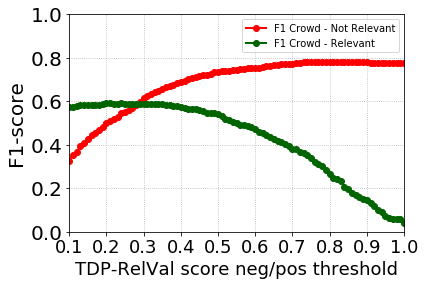

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = 6, 4
plt.plot(notrel[:,0], notrel[:,1], 'bo-', color = 'red', lw = 2, label = "F1 Crowd - Not Relevant")
plt.plot(rel[:,0], rel[:,1], 'bo-', color = 'darkgreen', lw = 2, label = "F1 Crowd - Relevant")

plt.xlim(0.1,1.0)
plt.xlabel("TDP-RelVal score neg/pos threshold", fontsize=18)
plt.ylabel("F1-score", fontsize=20)
plt.ylim(0.0,1.0)
plt.xticks(fontsize=18)
plt.yticks(fontsize=20)
leg = plt.legend()
leg.get_frame().set_alpha(0.8)
plt.grid(ls=':')
#plt.title("Without Highlight, Relations Not Merged, 3-point scale")
plt.savefig("Plots/bin1_all_topics.eps",  bbox_inches='tight', format="eps", dpi=1000)
plt.show()
plt.close()

In [8]:
notrel

array([[ 0.01      ,  0.10443864],
       [ 0.02      ,  0.11606218],
       [ 0.03      ,  0.12383901],
       [ 0.04      ,  0.15680324],
       [ 0.05      ,  0.21047479],
       [ 0.06      ,  0.23347805],
       [ 0.07      ,  0.26054003],
       [ 0.08      ,  0.28876509],
       [ 0.09      ,  0.30600092],
       [ 0.1       ,  0.32776524],
       [ 0.11      ,  0.35221239],
       [ 0.12      ,  0.36871997],
       [ 0.13      ,  0.39399142],
       [ 0.14      ,  0.4081287 ],
       [ 0.15      ,  0.42673308],
       [ 0.16      ,  0.44289808],
       [ 0.17      ,  0.45487657],
       [ 0.18      ,  0.46988432],
       [ 0.19      ,  0.4824319 ],
       [ 0.2       ,  0.50019448],
       [ 0.21      ,  0.51076923],
       [ 0.22      ,  0.51922345],
       [ 0.23      ,  0.52852853],
       [ 0.24      ,  0.54505006],
       [ 0.25      ,  0.55164835],
       [ 0.26      ,  0.56069364],
       [ 0.27      ,  0.5715305 ],
       [ 0.28      ,  0.58169014],
       [ 0.29      ,

In [9]:
rel

array([[ 0.01      ,  0.54761277],
       [ 0.02      ,  0.54819915],
       [ 0.03      ,  0.54936306],
       [ 0.04      ,  0.55296326],
       [ 0.05      ,  0.55965056],
       [ 0.06      ,  0.56262042],
       [ 0.07      ,  0.56578581],
       [ 0.08      ,  0.56869369],
       [ 0.09      ,  0.56996878],
       [ 0.1       ,  0.57347465],
       [ 0.11      ,  0.57515961],
       [ 0.12      ,  0.57711443],
       [ 0.13      ,  0.58175355],
       [ 0.14      ,  0.5819378 ],
       [ 0.15      ,  0.58113436],
       [ 0.16      ,  0.58289917],
       [ 0.17      ,  0.58361669],
       [ 0.18      ,  0.58455767],
       [ 0.19      ,  0.58682635],
       [ 0.2       ,  0.59011164],
       [ 0.21      ,  0.59047006],
       [ 0.22      ,  0.58980188],
       [ 0.23      ,  0.58711374],
       [ 0.24      ,  0.59222333],
       [ 0.25      ,  0.58870968],
       [ 0.26      ,  0.586113  ],
       [ 0.27      ,  0.58629004],
       [ 0.28      ,  0.585485  ],
       [ 0.29      ,

In [25]:
#dataset['crowd_rel_binary'] = pd.Series(np.random.randn(len(dataset)), index=dataset.index)

for i in xrange(len(dataset.index)):
    #subset = nist[(nist["Topic Id"] == dataset["input.query_id"].iloc[i]) & (nist["Document Id"] == dataset["input.document_id"].iloc[i])]
    if dataset['relevance_score'].iloc[i] >= 0.4:
        dataset['crowd_rel_binary'].iloc[i] = 1
    else:
        dataset['crowd_rel_binary'].iloc[i] = 0

In [27]:
dataset

,Unnamed: 0,duration,input.bin,input.doc_len,input.document_body,input.document_id,input.document_title,input.index,input.query_id,input.topic_description,...,none_score,nist_rel,nist_rel_binary,nist_rel_norm,rel_dif,nist_rel_binary_norm,rel_dif_binary,rel_dif_mod,rel_dif_binary_mod,crowd_rel_binary
0,0,51.428571,1,118,<p>LEAD: The computers that keep track of this...,269,Tower of Pisa Leans A Little More in '86,2466,677,What efforts have been made to stabilize the L...,...,0.593757,0.0,0.0,0.0,-0.330841,0.0,-0.330841,0.330841,0.330841,0.0
1,1,37.142857,1,148,<p>LEAD: Faculty members at the University of ...,553,PATENTS,3683,439,What new inventions or scientific discoveries ...,...,0.107414,1.0,1.0,0.5,-0.282809,1.0,0.217191,0.282809,0.217191,1.0
2,2,31.000000,1,136,<p>LEAD: Guerrillas killed an engineer and two...,1375,3 Are Killed in Rebel Attack On Peru Hydroelec...,3214,307,Identify hydroelectric projects proposed or un...,...,0.272941,1.0,1.0,0.5,-0.227059,1.0,0.272941,0.227059,0.272941,1.0
3,3,34.428571,1,218,<p>LEAD: Five commuter buses were involved in ...,1401,10 Injured in Crash Of 5 Buses in Jersey,5603,363,What disasters have occurred in tunnels used f...,...,0.452963,0.0,0.0,0.0,-0.547037,0.0,-0.547037,0.547037,0.547037,1.0
4,4,36.857143,1,207,<p>LEAD: Since William J. Casey's surgery for ...,2521,Search Begins for A New C.I.A. Chief,5393,310,Evidence that radio waves from radio towers or...,...,0.688338,0.0,0.0,0.0,-0.311662,0.0,-0.311662,0.311662,0.311662,0.0
5,5,83.714286,1,390,<p>LEAD: WHO in Iran supports the Ayatollah Ru...,2935,IRAN: ADRIFT IN A SEA OF BLOOD' ON 13,8821,330,This query is looking for examples of cooperat...,...,0.884379,0.0,0.0,0.0,-0.115621,0.0,-0.115621,0.115621,0.115621,0.0
6,6,35.142857,1,131,"<p>LEAD: Machine tool companies, which recentl...",3060,Ex-Im Tie to Tool Group,3004,414,How much sugar does Cuba export and which coun...,...,0.610308,0.0,0.0,0.0,-0.317362,0.0,-0.317362,0.317362,0.317362,0.0
7,7,81.714286,1,197,<p>LEAD: Federal District Judge Robert R. Merh...,3551,Robins Deadline,5160,330,This query is looking for examples of cooperat...,...,0.524323,0.0,0.0,0.0,-0.389387,0.0,-0.389387,0.389387,0.389387,0.0
8,8,83.428571,1,377,<p>LEAD: Audi of America agreed today to recal...,4050,"250,000 AUDI CARS WILL BE RECALLED",8553,397,Identify documents that discuss the reasons fo...,...,0.154163,2.0,1.0,1.0,0.154163,1.0,0.154163,0.154163,0.154163,1.0
9,9,75.142857,1,439,"<p>LEAD: Zn his long-overdue visit to Africa, ...",4422,Only Another Footnote in Africa?,9772,443,What is the extent of U.S. (government and pri...,...,0.107006,1.0,1.0,0.5,-0.313100,1.0,0.186900,0.313100,0.186900,1.0


In [13]:
def compute_F1_score_highly_relevant(dataset):
    nyt_f1 = np.zeros(shape=(100, 3))
    for idx in range(0, 100):
        thresh = (idx + 1) / 100.0
        tp = 0
        fp = 0
        tn = 0
        fn = 0

        for gt_idx in range(0, len(dataset.index)):
            #print(gt_idx)
            #print(dataset['max_relevance_score'].iloc[gt_idx])
            if dataset['relevance_score'].iloc[gt_idx] >= thresh:
                if dataset["nist_rel"].iloc[gt_idx] == 2:
                    tp = tp + 1.0
                else:
                    fp = fp + 1.0
            else:
                if dataset["nist_rel"].iloc[gt_idx] == 2:
                    fn = fn + 1.0
                else:
                    tn = tn + 1.0
        nyt_f1[idx, 0] = 1.0
        nyt_f1[idx, 1] = thresh
        if tp != 0:
            nyt_f1[idx, 2] = 2.0 * tp / (2.0 * tp + fp + fn)
        else:
            nyt_f1[idx, 2] = 0
    return nyt_f1

def compute_F1_score_not_relevant(dataset):
    nyt_f1 = np.zeros(shape=(100, 3))
    for idx in range(0, 100):
        thresh = (idx + 1) / 100.0
        tp = 0
        fp = 0
        tn = 0
        fn = 0

        for gt_idx in range(0, len(dataset.index)):
            #print(gt_idx)
            #print(dataset['max_relevance_score'].iloc[gt_idx])
            if dataset['relevance_score'].iloc[gt_idx] <= thresh:
                if dataset["nist_rel"].iloc[gt_idx] == 0:
                    tp = tp + 1.0
                else:
                    fp = fp + 1.0
            else:
                if dataset["nist_rel"].iloc[gt_idx] == 0:
                    fn = fn + 1.0
                else:
                    tn = tn + 1.0
        nyt_f1[idx, 0] = 0.0
        nyt_f1[idx, 1] = thresh
        if tp != 0:
            nyt_f1[idx, 2] = 2.0 * tp / (2.0 * tp + fp + fn)
        else:
            nyt_f1[idx, 2] = 0
    return nyt_f1

def compute_F1_score_relevant(dataset, nyt_f1):
    
    for idx in range(0, 5050):
        print(idx)
        tp = 0
        fp = 0
        tn = 0
        fn = 0
        
        for gt_idx in range(0, len(dataset.index)):
            #print(gt_idx)
            #print(dataset['max_relevance_score'].iloc[gt_idx])
            if dataset['relevance_score'].iloc[gt_idx] > nyt_f1[idx, 0] and dataset['relevance_score'].iloc[gt_idx] < nyt_f1[idx, 1]:
                if dataset["nist_rel"].iloc[gt_idx] == 1:
                    tp = tp + 1.0
                else:
                    fp = fp + 1.0
            else:
                if dataset["nist_rel"].iloc[gt_idx] == 1:
                    fn = fn + 1.0
                else:
                    tn = tn + 1.0
        if tp != 0:
            nyt_f1[idx, 2] = 2.0 * tp / (2.0 * tp + fp + fn)
        else:
            nyt_f1[idx, 2] = 0
    return nyt_f1

idx = 0
nyt_f1 = np.zeros(shape=(5050, 3))
for idx1 in range(0, 100):
    thresh1 = (idx1) / 100.0
    for idx2 in range(idx1, 100):
        thresh2 = (idx2 + 1) /100.0
        nyt_f1[idx, 0] = thresh1
        nyt_f1[idx, 1] = thresh2
        nyt_f1[idx, 2] = 0.0
        idx = idx + 1

In [14]:
highlyrel = compute_F1_score_highly_relevant(dataset)
notrel = compute_F1_score_not_relevant(dataset)
rel = compute_F1_score_relevant(dataset, nyt_f1)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061


3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


In [15]:
notrel

array([[ 0.        ,  0.01      ,  0.10443864],
       [ 0.        ,  0.02      ,  0.11606218],
       [ 0.        ,  0.03      ,  0.12383901],
       [ 0.        ,  0.04      ,  0.15680324],
       [ 0.        ,  0.05      ,  0.21047479],
       [ 0.        ,  0.06      ,  0.23347805],
       [ 0.        ,  0.07      ,  0.26054003],
       [ 0.        ,  0.08      ,  0.28876509],
       [ 0.        ,  0.09      ,  0.30600092],
       [ 0.        ,  0.1       ,  0.32776524],
       [ 0.        ,  0.11      ,  0.35221239],
       [ 0.        ,  0.12      ,  0.36871997],
       [ 0.        ,  0.13      ,  0.39399142],
       [ 0.        ,  0.14      ,  0.4081287 ],
       [ 0.        ,  0.15      ,  0.42673308],
       [ 0.        ,  0.16      ,  0.44289808],
       [ 0.        ,  0.17      ,  0.45487657],
       [ 0.        ,  0.18      ,  0.46988432],
       [ 0.        ,  0.19      ,  0.4824319 ],
       [ 0.        ,  0.2       ,  0.50019448],
       [ 0.        ,  0.21      ,  0.510

In [23]:
rel

array([[ 0.        ,  0.01      ,  0.0031348 ],
       [ 0.        ,  0.02      ,  0.00918836],
       [ 0.        ,  0.03      ,  0.00907716],
       [ 0.        ,  0.04      ,  0.01714286],
       [ 0.        ,  0.05      ,  0.03133159],
       [ 0.        ,  0.06      ,  0.03266332],
       [ 0.        ,  0.07      ,  0.04076739],
       [ 0.        ,  0.08      ,  0.05017104],
       [ 0.        ,  0.09      ,  0.05739514],
       [ 0.        ,  0.1       ,  0.05970149],
       [ 0.        ,  0.11      ,  0.07324517],
       [ 0.        ,  0.12      ,  0.07312253],
       [ 0.        ,  0.13      ,  0.07597341],
       [ 0.        ,  0.14      ,  0.08294931],
       [ 0.        ,  0.15      ,  0.09187279],
       [ 0.        ,  0.16      ,  0.09777015],
       [ 0.        ,  0.17      ,  0.1038526 ],
       [ 0.        ,  0.18      ,  0.10731707],
       [ 0.        ,  0.19      ,  0.11146497],
       [ 0.        ,  0.2       ,  0.11437403],
       [ 0.        ,  0.21      ,  0.119

In [31]:
import numpy as np
np.set_printoptions(threshold=np.nan)

In [18]:
highlyrel

array([[ 1.        ,  0.01      ,  0.26227431],
       [ 1.        ,  0.02      ,  0.26288988],
       [ 1.        ,  0.03      ,  0.26356094],
       [ 1.        ,  0.04      ,  0.26623586],
       [ 1.        ,  0.05      ,  0.27203698],
       [ 1.        ,  0.06      ,  0.27342447],
       [ 1.        ,  0.07      ,  0.27625802],
       [ 1.        ,  0.08      ,  0.27895819],
       [ 1.        ,  0.09      ,  0.28037383],
       [ 1.        ,  0.1       ,  0.28281414],
       [ 1.        ,  0.11      ,  0.2859175 ],
       [ 1.        ,  0.12      ,  0.28602228],
       [ 1.        ,  0.13      ,  0.28956966],
       [ 1.        ,  0.14      ,  0.2900369 ],
       [ 1.        ,  0.15      ,  0.28914758],
       [ 1.        ,  0.16      ,  0.29136554],
       [ 1.        ,  0.17      ,  0.29296424],
       [ 1.        ,  0.18      ,  0.29317739],
       [ 1.        ,  0.19      ,  0.2961796 ],
       [ 1.        ,  0.2       ,  0.29908037],
       [ 1.        ,  0.21      ,  0.300

In [28]:
dataset.to_csv("bin1_results_absolut.csv")

In [30]:
idx = 0
nyt_f1 = np.zeros(shape=(5050, 3))
for idx1 in range(0, 100):
    thresh1 = (idx1) / 100.0
    for idx2 in range(idx1, 100):
        thresh2 = (idx2 + 1) /100.0
        nyt_f1[idx, 0] = thresh1
        nyt_f1[idx, 1] = thresh2
        nyt_f1[idx, 2] = 0.0
        idx = idx + 1
        
        
for idx in range(0, 5050):
    print(idx)
    tp = 0
    fp = 0
    tn = 0
    fn = 0
        
    for gt_idx in range(0, len(dataset.index)):
        if dataset['relevance_score'].iloc[gt_idx] > nyt_f1[idx, 0] and dataset['relevance_score'].iloc[gt_idx] < nyt_f1[idx, 1]:                
            if dataset["nist_rel"].iloc[gt_idx] == 1:
                tp = tp + 1.0
            else:
                fp = fp + 1.0
        else:
            if dataset["nist_rel"].iloc[gt_idx] == 1:
                fn = fn + 1.0
            else:
                tn = tn + 1.0
        
        if dataset['relevance_score'].iloc[gt_idx] >= nyt_f1[idx, 1]:
            if dataset["nist_rel"].iloc[gt_idx] == 2:
                tp = tp + 1.0
            else:
                fp = fp + 1.0
        else:
            if dataset["nist_rel"].iloc[gt_idx] == 2:
                fn = fn + 1.0
            else:
                tn = tn + 1.0
        
        if dataset['relevance_score'].iloc[gt_idx] <= nyt_f1[idx, 0]:
            if dataset["nist_rel"].iloc[gt_idx] == 0:
                tp = tp + 1.0
            else:
                fp = fp + 1.0
        else:
            if dataset["nist_rel"].iloc[gt_idx] == 0:
                fn = fn + 1.0
            else:
                tn = tn + 1.0

        
    if tp != 0:
        nyt_f1[idx, 2] = 2.0 * tp / (2.0 * tp + fp + fn)
    else:
        nyt_f1[idx, 2] = 0



0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


In [32]:
nyt_f1

array([[ 0.        ,  0.01      ,  0.17946022],
       [ 0.        ,  0.02      ,  0.17981073],
       [ 0.        ,  0.03      ,  0.17981073],
       [ 0.        ,  0.04      ,  0.18051174],
       [ 0.        ,  0.05      ,  0.18261479],
       [ 0.        ,  0.06      ,  0.18226428],
       [ 0.        ,  0.07      ,  0.18331581],
       [ 0.        ,  0.08      ,  0.18436733],
       [ 0.        ,  0.09      ,  0.18506835],
       [ 0.        ,  0.1       ,  0.18541886],
       [ 0.        ,  0.11      ,  0.18752191],
       [ 0.        ,  0.12      ,  0.18647038],
       [ 0.        ,  0.13      ,  0.1871714 ],
       [ 0.        ,  0.14      ,  0.18752191],
       [ 0.        ,  0.15      ,  0.1871714 ],
       [ 0.        ,  0.16      ,  0.18822292],
       [ 0.        ,  0.17      ,  0.18927445],
       [ 0.        ,  0.18      ,  0.18892394],
       [ 0.        ,  0.19      ,  0.19032597],
       [ 0.        ,  0.2       ,  0.19102699],
       [ 0.        ,  0.21      ,  0.191

In [42]:
dataset['crowd_rel_ternary'] = pd.Series(np.random.randn(len(dataset)), index=dataset.index)

for i in xrange(len(dataset.index)):
    if dataset['relevance_score'].iloc[i] <= 0.34:
        dataset['crowd_rel_ternary'].iloc[i] = 0
    elif dataset['relevance_score'].iloc[i] >= 0.86:
        dataset['crowd_rel_ternary'].iloc[i] = 2
    else:
        dataset['crowd_rel_ternary'].iloc[i] = 1